In [1]:
import matplotlib.pyplot as plt
import numpy as np
import math 
import sklearn.preprocessing 
import random
import yaml
import h5py
import logging
import datetime
import os
import time

import pprint
from tqdm import tqdm_notebook as tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, SequentialSampler, BatchSampler
import torch.nn.functional as F


from load_matlab_timedata import get_data_from
from src.TSGenerator import f_Y, f_X, get_func_timeseries
from src.DataLoader import TimeSeriesDataset
from src.model_utils import init_logger, plot_shared_scale, plot_multiscale
from src.Model import LSTM
from src.Losses import myLoss, prognose_dy


## Loading config files, setup execution parameters, init objects

In [2]:
plt.rcParams['figure.figsize'] = 20, 7.
CONFIG_FILENAME = "model_params.yaml"
# ! ls DC_motor_simulation
with open(CONFIG_FILENAME, 'r') as f:
        config = yaml.load(f, Loader=yaml.FullLoader)
   
pprint.pprint(config)


p_net = config['network_params']

p_train = config['train_params']

p_gen = config['generator_params']

p_data = config['data_params']
need_normalize = p_data['need_normalize']

{'data_params': {'integration_step': 0.01,
                 'leave_nth': 13,
                 'mat_file': 'DC_motor_simulation/res.mat',
                 'need_normalize': True,
                 'test_size': 0.3,
                 'use_part_of_data': 1.0},
 'exp_path': 'only_batches',
 'generator_params': {'a': 0.5, 'b': 1.0, 'f_X': 'math.sin', 'f_Y': 'math.cos'},
 'is_debug': False,
 'network_params': {'dtype': 'torch.float',
                    'hidden_size': 16,
                    'input_size': 64,
                    'num_layers': 2,
                    'output_dim': 3,
                    'per_element': True,
                    'retrospective_steps': 128},
 'to_generate_data': False,
 'train_params': {'auto_loss': True,
                  'aux_loss': {'part_of_max_for_const': 0.3,
                               'scaling_order': 5,
                               'steady_state_threshold': 0.001},
                  'batch_size': 1024,
                  'core_loss': {'part_of_max_for_

# Set parameters

In [3]:

# # If `per_element` is True, then LSTM reads in one timestep at a time.
if  p_net['per_element']:
    lstm_input_size = 1
else:
    lstm_input_size = p_net['input_size']
    
# if is_debug:
#     x, y = get_func_timeseries(f_Y = f_Y, f_X = f_X, a=p_generate['a'], b=p_generate['b'])
to_generate_data = config['to_generate_data'] 
if to_generate_data:
    p_gen = config['generator_params']
    print("Data generator params:")
    pprint.pprint(p_gen)
    a = p_gen['a']
    b = p_gen['b']
is_debug = config['is_debug']


init_logger(config)

logging.info("Experiment started with params")
logging.info(f"data_par: {p_data}")
logging.info(f"net_par: {p_net}")
logging.info(f"train_par: {p_train}") 

logger inited to file [only_batcheslogs/exp_2019-05-04_14:02:56.log]


## Init data loader and get appropriate part of data

using 1.0 of data
X normalized, norms: [14.99712541]
x shape (76924, 1)
x_normalized shaoe (76924, 1)


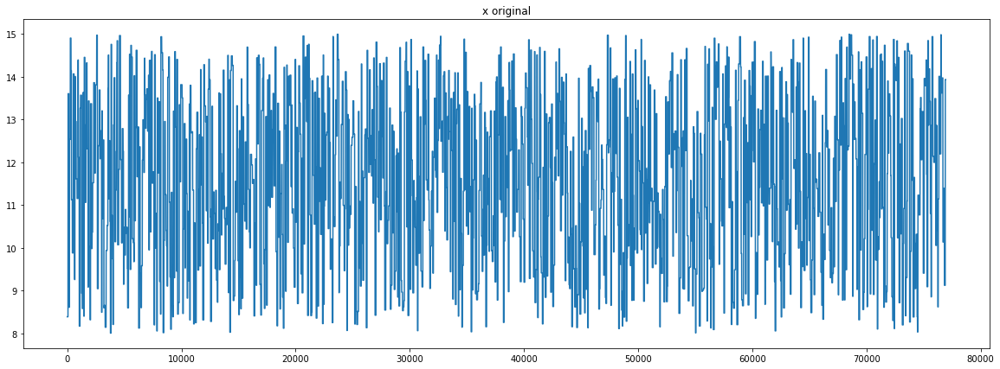

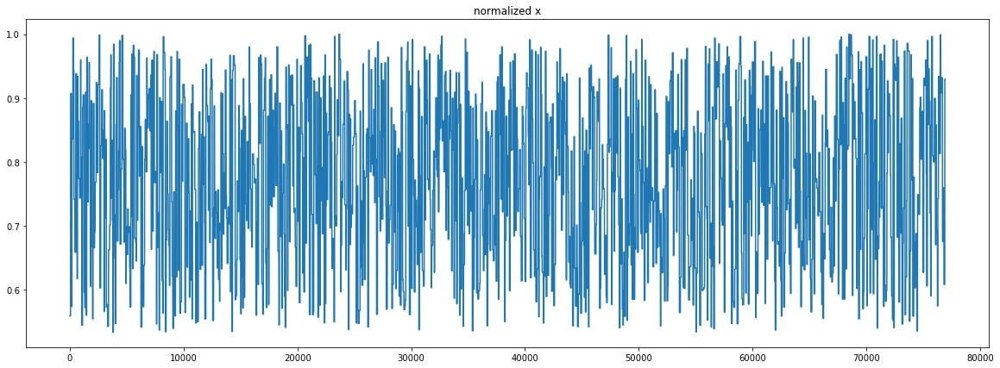

Y normalized, norms: [0.01499693]
input shape (76924, 1)
input partition shape (23078, 1)
output partition shape (23078, 1)
stacked Y shape  (22951, 1)
Y_tensor torch.Size([22951, 1])
X_tensor torch.Size([128, 22949, 1])
X normalized, norms: [14.99712541]
x shape (76924, 1)
x_normalized shaoe (76924, 1)


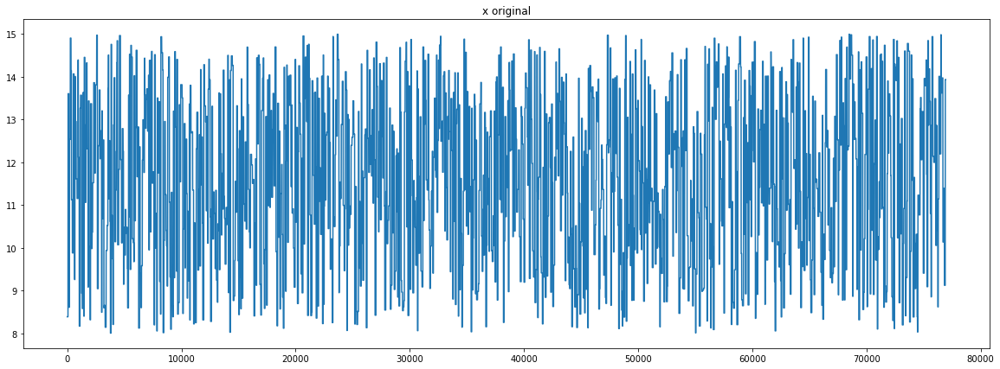

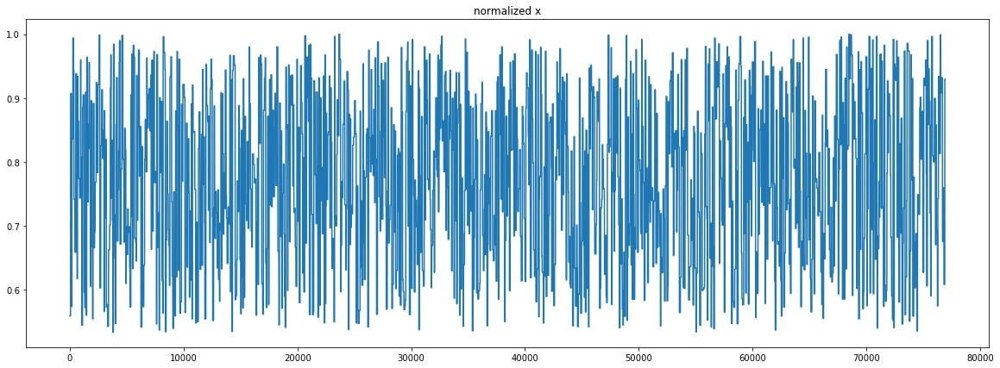

Y normalized, norms: [0.01499693]
input shape (76924, 1)
input partition shape (53846, 1)
output partition shape (53846, 1)
stacked Y shape  (53719, 1)
Y_tensor torch.Size([53719, 1])
X_tensor torch.Size([128, 53717, 1])
train set: [53719] batches
test set: [22951] batches
data_loading time 38.221052408218384 secs


In [4]:
# todo add time tracking for this cell
use_part = p_data['use_part_of_data']
print(f"using {use_part} of data")

t_tick = time.time()

test_ts_ds = TimeSeriesDataset(config=config,
                               partition=(use_part - use_part*p_data['test_size'], use_part),                        
                               logging=logging)

train_ts_ds = TimeSeriesDataset(config=config,
                                partition=(0, use_part - use_part*p_data['test_size']),
                                logging=logging)

print(f"train set: [{len(train_ts_ds)}] batches")
print(f"test set: [{len(test_ts_ds)}] batches")

if need_normalize:
    config['x_norm'] = train_ts_ds.x_norms[0]
    config['y_norm'] = train_ts_ds.y_norms[0]
    config['x_norm']
else:
    config['x_norm'] = 1
    config['y_norm'] = 1
    config['x_norm']

train_dl = DataLoader(dataset = train_ts_ds,
                      batch_sampler = BatchSampler(
                          sampler = SequentialSampler(train_ts_ds), 
                          batch_size = p_train['batch_size'],
                          drop_last = True)
                     )
test_dl = DataLoader(dataset = test_ts_ds,
                     batch_sampler = BatchSampler(
                     sampler = SequentialSampler(test_ts_ds), 
                     batch_size = p_train['batch_size'], 
                     drop_last = True)
                    )    
    
t_tock = time.time()
dataload_time = t_tock - t_tick
print(f"data_loading time {dataload_time} secs")

## Inspecting data we have, get several batches and look inside on pretty large scale to see individual iterations:

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 128, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


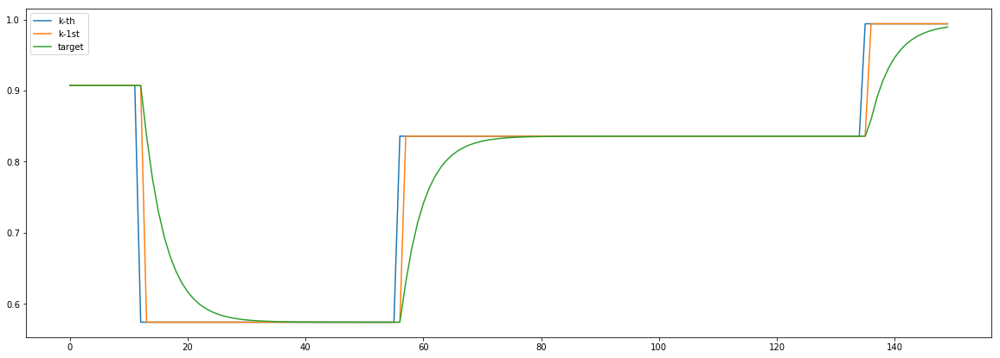

x [batch_size, retrospective_steps, channels] :torch.Size([1024, 128, 1])
y [batch_size, channels]: torch.Size([1024, 1])
y_last [slice_size]: (150,)


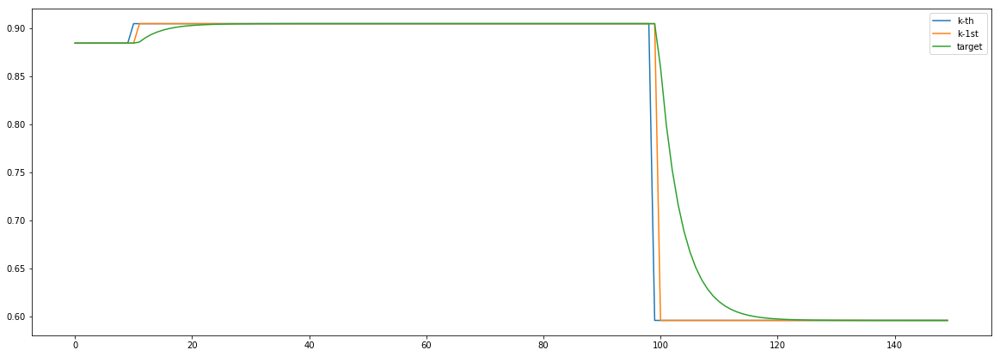

In [5]:
f, t = 0, 150
for i, batch in enumerate(train_dl):
    x, y, ind = batch
    print(f"x [batch_size, retrospective_steps, channels] :{x.shape}")
    print(f"y [batch_size, channels]: {y.shape}")
    y_kth = y.detach().numpy()[f:t, 0]
    print(f"y_last [slice_size]: {y_kth.shape}")
    x = x.transpose(0,1)
    plt.plot(x.detach().numpy()[-1][f:t], label='k-th')
    plt.plot(x.detach().numpy()[-2][f:t], label='k-1st')
    plt.plot(y_kth, label='target')
    plt.legend()
    plt.show()
    if i == 1:
        break

## Creating objects from imported files

In [6]:
from src.Model import LSTM
from src.Losses import myLoss, prognose_dy  # imports here for faster rerun and debug procedure

model = LSTM(lstm_input_size,
             p_net['hidden_size'],
             batch_size=p_train['batch_size'],
             output_dim=p_net['output_dim'],
             num_layers=p_net['num_layers'])

loss_fn = myLoss

# if p_train['loss_fn'] == 'mse':  
#     loss_fn = torch.nn.MSELoss(reduction=p_train['reduction'])
# elif p_train['loss_fn'] == 'l1':  
#     loss_fn = torch.nn.L1Loss(reduction=p_train['reduction'])

if p_train['optimizer'] == "adam":
    lr = p_train['learning_rate']
    optimiser = torch.optim.Adam(model.parameters(), lr=lr)

logging.info(f"Model n params: {model.get_num_params()}")
print(f"model has [{model.get_num_params()}] params")
num_epochs = p_train['num_epochs']
logging.info("Training process INITIALIZED")


model has [3443.0] params


In [7]:
# #####################
# # 
# #####################
# from torch.nn import init
# for layer_p in a._all_weights:
#     for p in layer_p:
#         if 'weight' in p:
#             # print(p, a.__getattr__(p))
#             init.normal(a.__getattr__(p), 0.0, 0.02)

In [8]:
logging.info("History INITIALIZED")

hist = {
    "train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "const":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "const":np.zeros(num_epochs)
        }
    },
    "eval_train":{
        "batches":{
            "main":np.zeros(len(train_dl)),
            "aux":np.zeros(len(train_dl)),
            "const":np.zeros(len(train_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "const":np.zeros(num_epochs)
        }
    },
    "eval_test":{
        "batches":{
            "main":np.zeros(len(test_dl)),
            "aux":np.zeros(len(test_dl)),
            "const":np.zeros(len(test_dl))
        },
        "epochs":{
            "main":np.zeros(num_epochs),
            "aux":np.zeros(num_epochs),
            "const":np.zeros(num_epochs)
        }
    },
    'mean_params_sample':
    {
        '1':np.zeros(num_epochs),
        '2':np.zeros(num_epochs),            
    },
    'lr': np.zeros(num_epochs),
    'loss_rate': np.zeros(num_epochs),
    'weights_sum': np.zeros(num_epochs)
}

In [ ]:
def batch_iteration(iter_index, model, optimiser, batch_data, backprop, hist_part):
    
    x_batch, y_batch, indexes = data
    x_batch.transpose_(0, 1) # todo get rid of it
    model.hidden = model.init_hidden()

    y_pred = model(x_batch)
    losses = loss_fn(y_pred, y_batch, x_batch, config)
    main_loss, aux_loss, const_loss = losses
    main_loss -= main_loss
    aux_loss *= 1000
    losses = [main_loss * 0, aux_loss * 1000, const_loss]
#         print(f"losses before scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")
    
    
    
    if backprop:
        max_loss = max(losses)
        combined_loss = sum(losses)

        optimiser.zero_grad()

        combined_loss.backward()

    #         print(f"losses after scaling: m[{main_loss.item()}] a[{aux_loss.item()}] c[{const_loss.item()}]")

        optimiser.step()
    
    hist_part["main"][iter_index] = main_loss.item()
    hist_part["aux"][iter_index] = aux_loss.item()
    hist_part["const"][iter_index] = const_loss.item()
    
    return y_pred

In [ ]:
def update_long_term_hist(batches_hist, long_term_hist):
    mean_main = np.average(batches_hist["main"])
    mean_aux = np.average(batches_hist["aux"])
    mean_const = np.average(batches_hist["const"])
    long_term_hist["main"][t] = mean_main
    long_term_hist["aux"][t] = mean_aux
    long_term_hist["const"][t] = mean_const
    return mean_main, mean_aux, mean_const

In [ ]:
def slice_loss_sum(losses_dict, index):
    return sum([val[index] for val in losses_dict.values()])

## Train model


aux preds: 0.1459037959575653 0.06439545005559921
main loss 0.0
aux loss 6028305.102595604
const loss 0.040505853230850056
combined loss 6028305.1431014575 


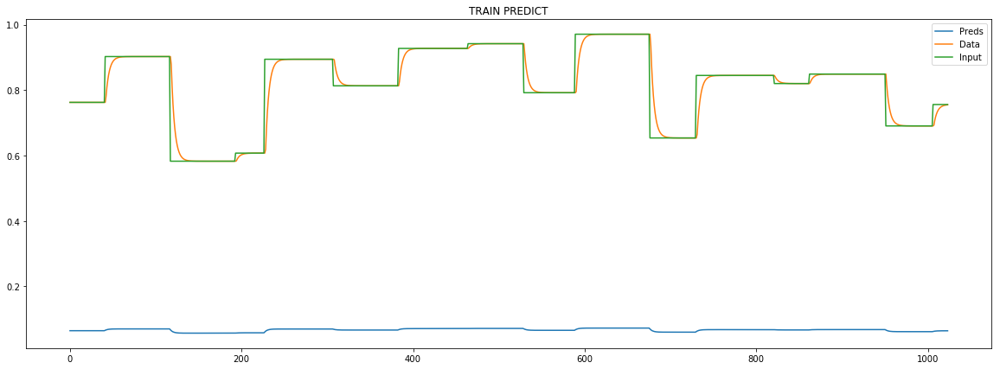

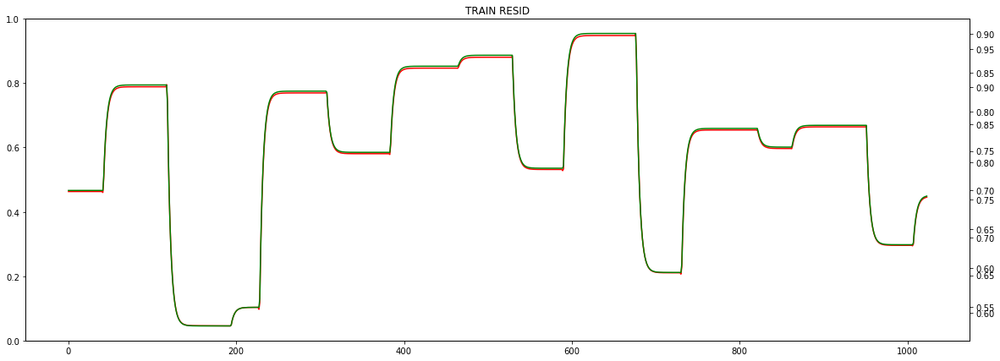

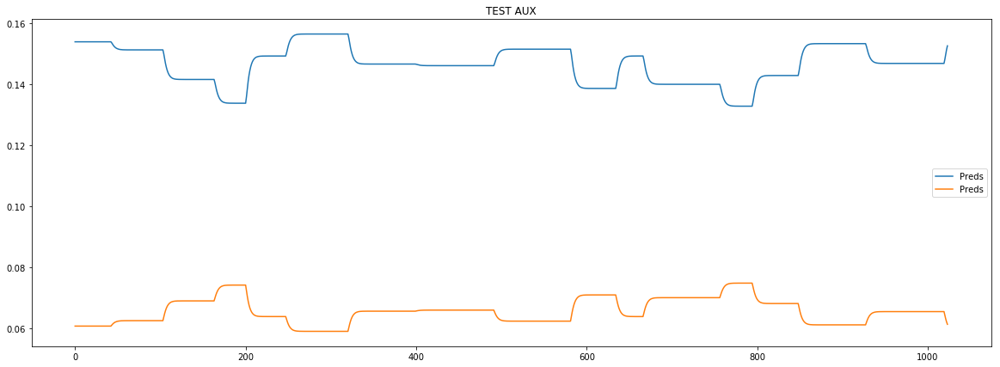

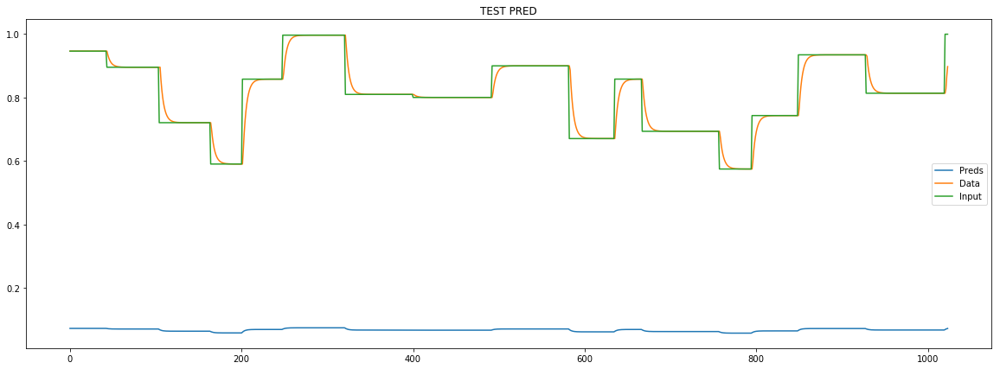

Epoch [0] 
     train_loss[6028305.1431014575] 
     eval_train[986760.3300743755] 
     eval_test[1006972.025330022]



aux preds: 0.16547344624996185 0.15109609067440033
main loss 0.0
aux loss 839762.0817307692
const loss 0.07191814682804622
combined loss 839762.153648916 


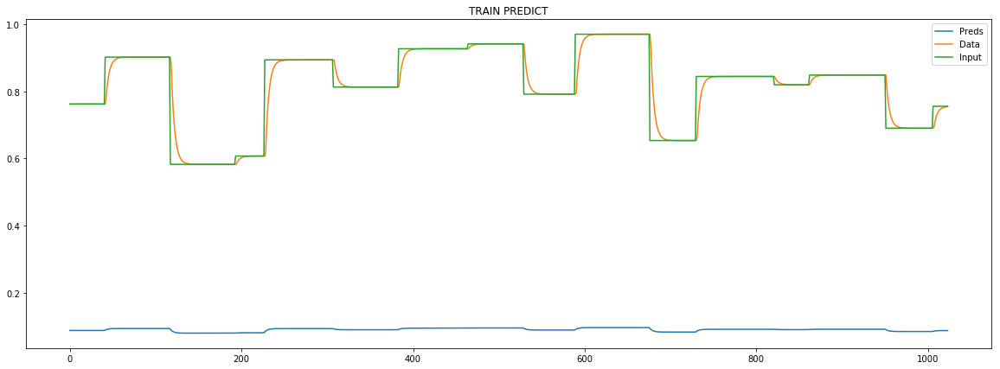

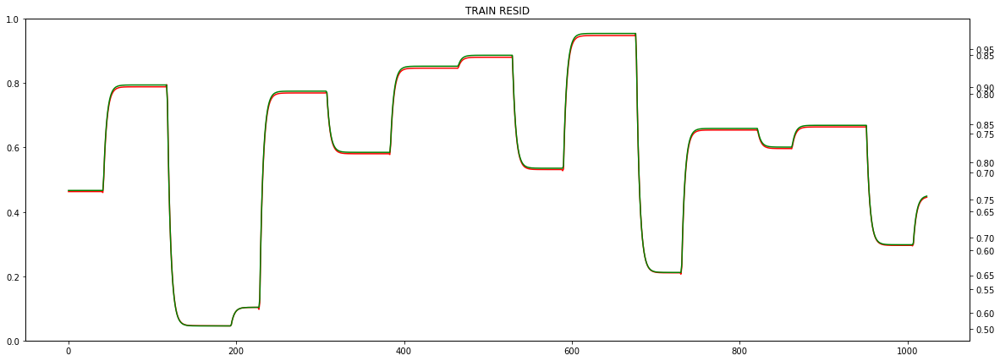

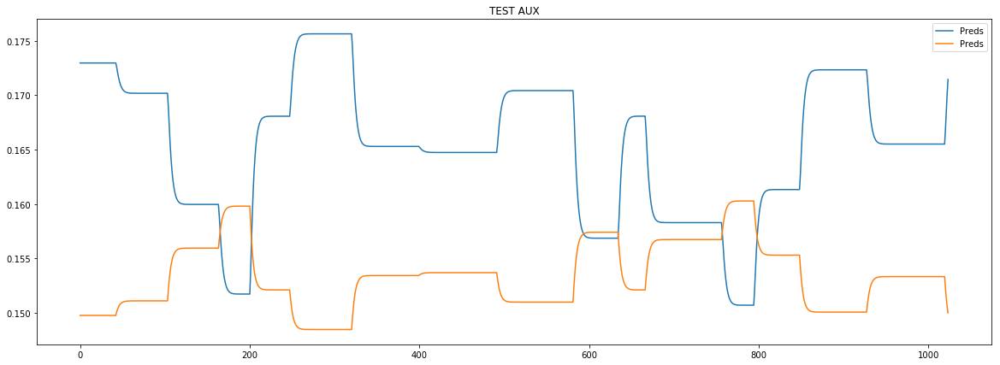

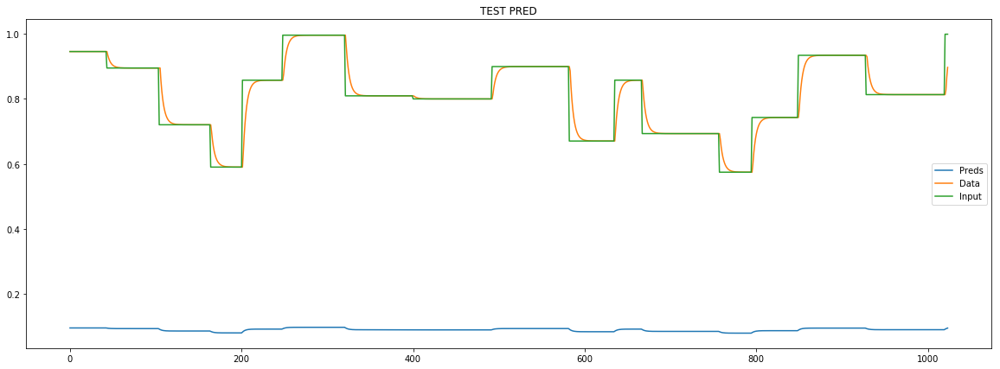

Epoch [1] 
     train_loss[839762.153648916] 
     eval_train[755817.2596890922] 
     eval_test[771580.4466312245]



aux preds: 0.17793166637420654 0.2865092158317566
main loss 0.0
aux loss 688797.8263221154
const loss 0.06551182012145336
combined loss 688797.8918339355 


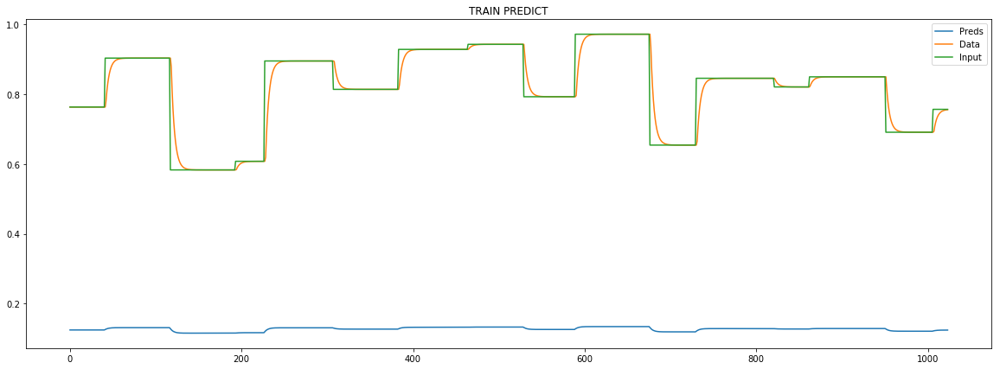

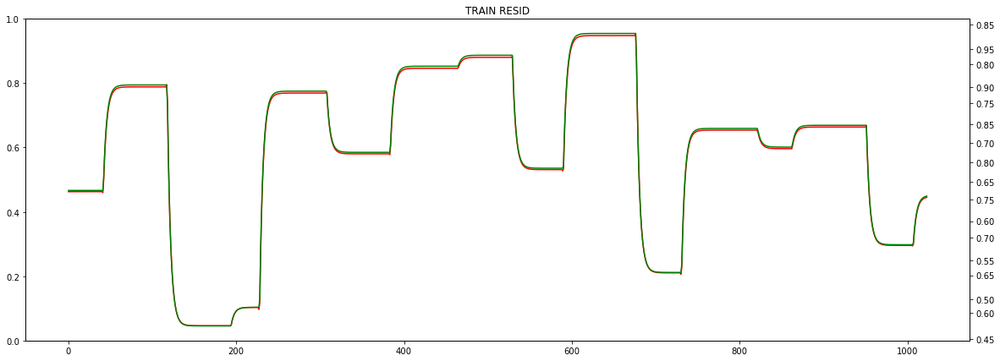

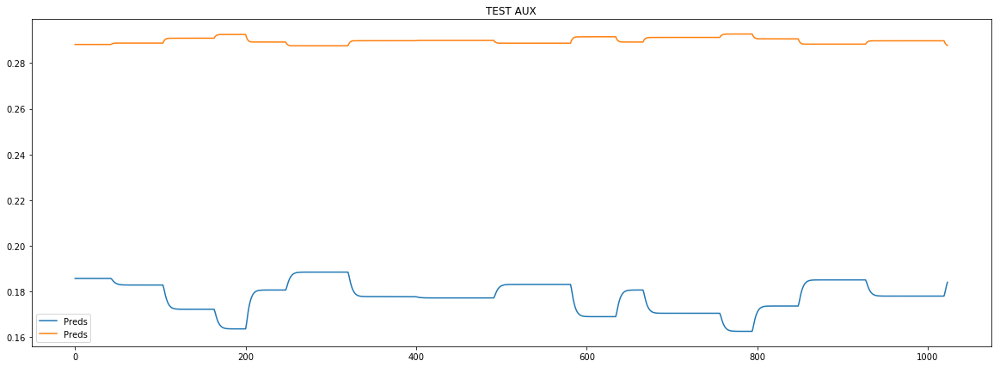

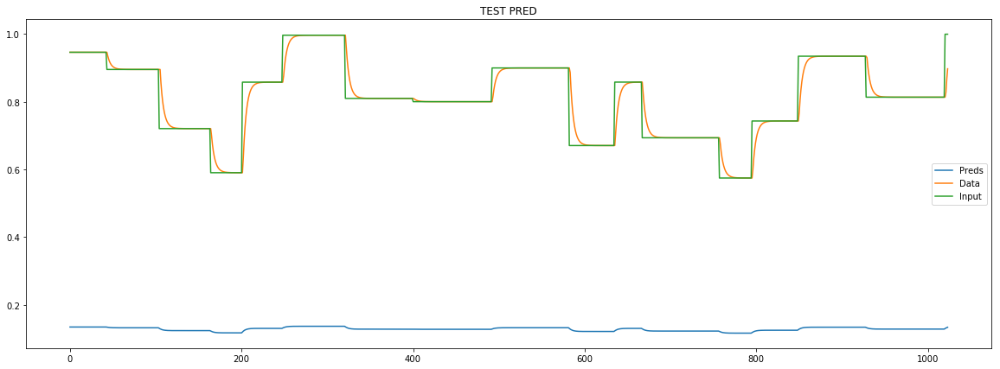

Epoch [2] 
     train_loss[688797.8918339355] 
     eval_train[614036.3398169565] 
     eval_test[627171.3747199961]



aux preds: 0.19414222240447998 0.4914111793041229
main loss 0.0
aux loss 529074.4032451923
const loss 0.0638325445067424
combined loss 529074.4670777367 


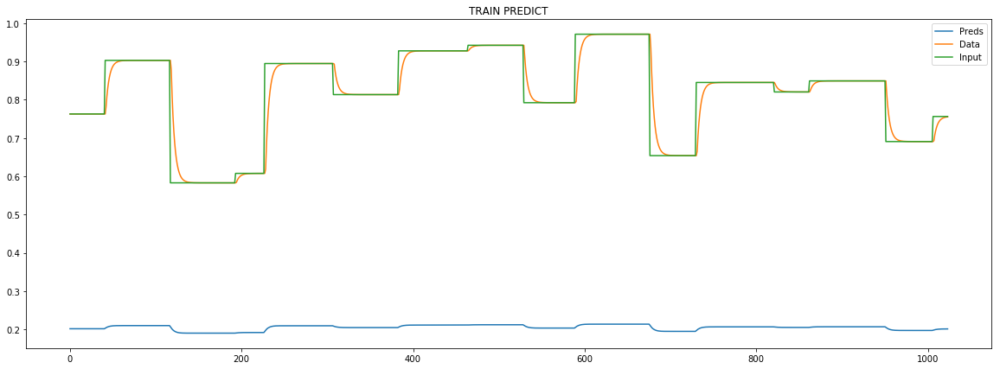

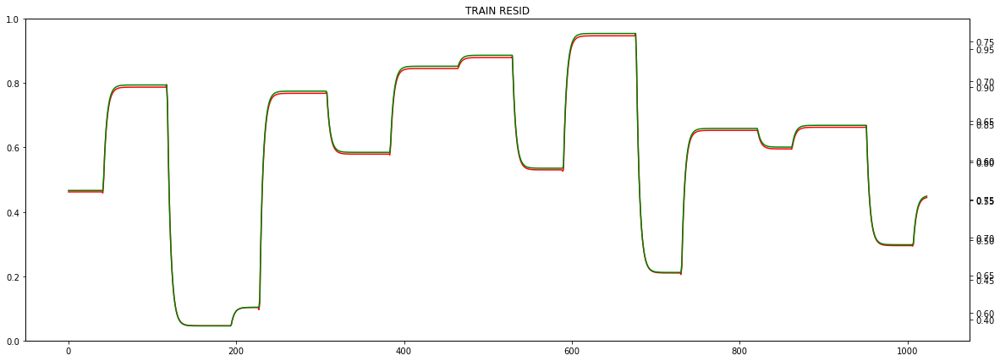

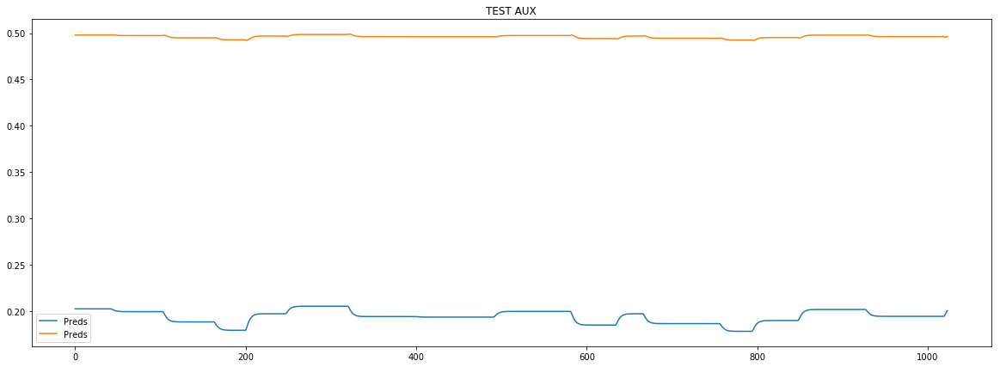

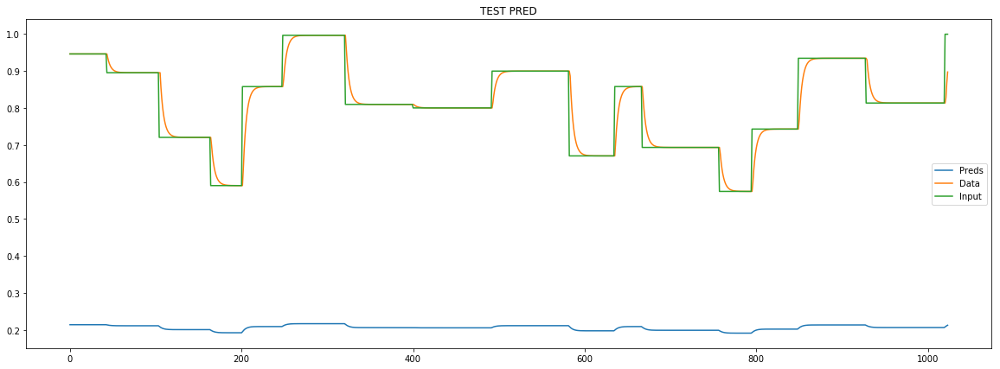

Epoch [3] 
     train_loss[529074.4670777367] 
     eval_train[429995.23230681295] 
     eval_test[439860.79126428155]



aux preds: 0.21998336911201477 0.8192819952964783
main loss 0.0
aux loss 310244.8296274039
const loss 0.09427302753409514
combined loss 310244.92390043143 


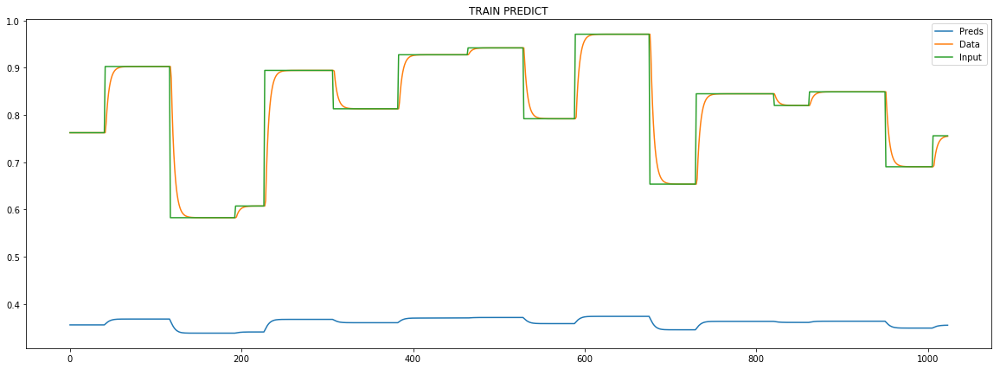

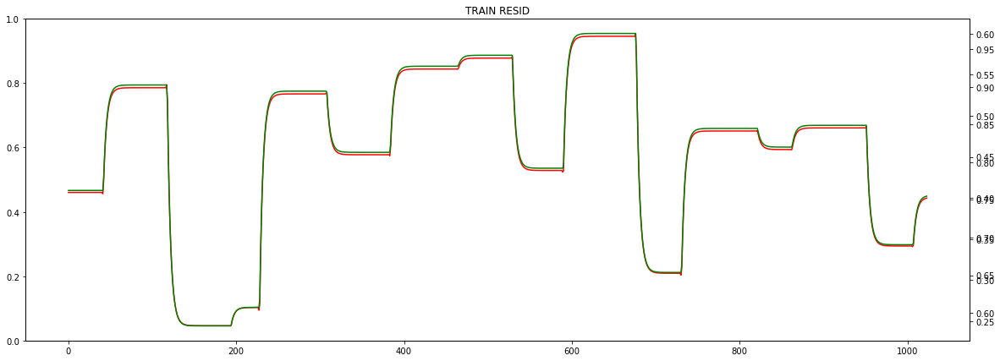

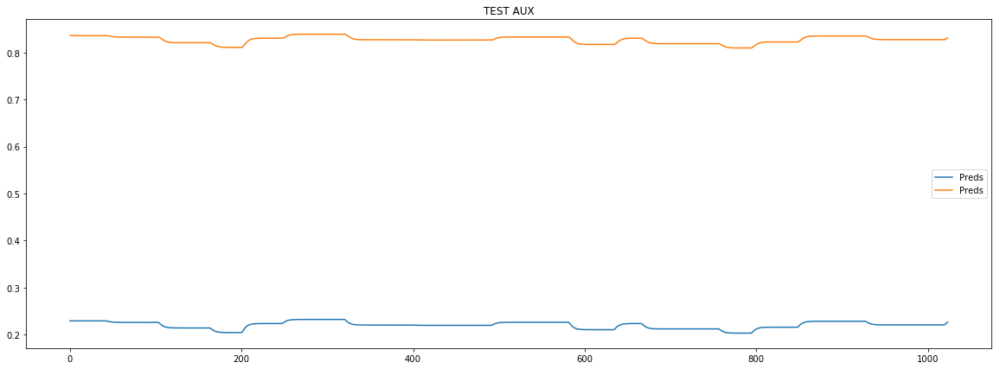

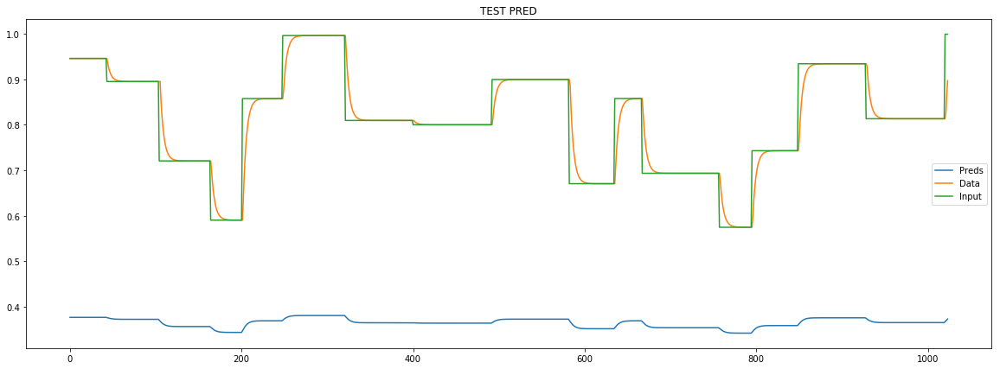

loss rate [0.7128596654212956]
Epoch [4] 
     train_loss[310244.92390043143] 
     eval_train[170849.7951613411] 
     eval_test[175979.94691568037]



aux preds: 0.5360177159309387 1.1702042818069458
main loss 0.0
aux loss 12768.857670710637
const loss 0.26904361895643747
combined loss 12769.126714329594 


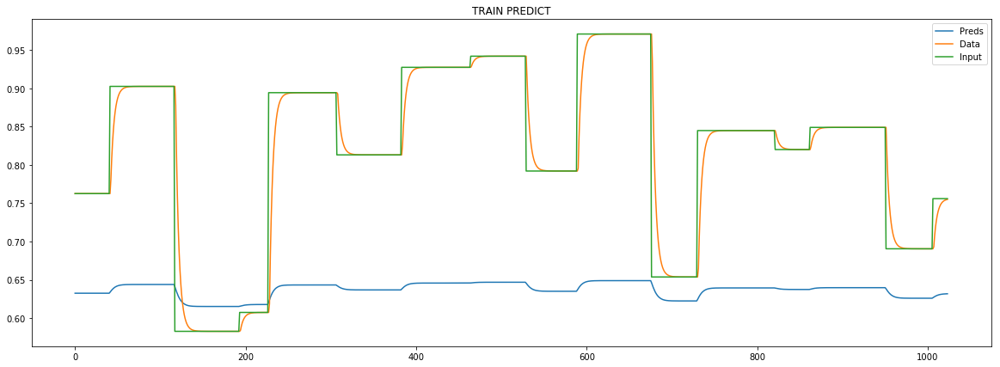

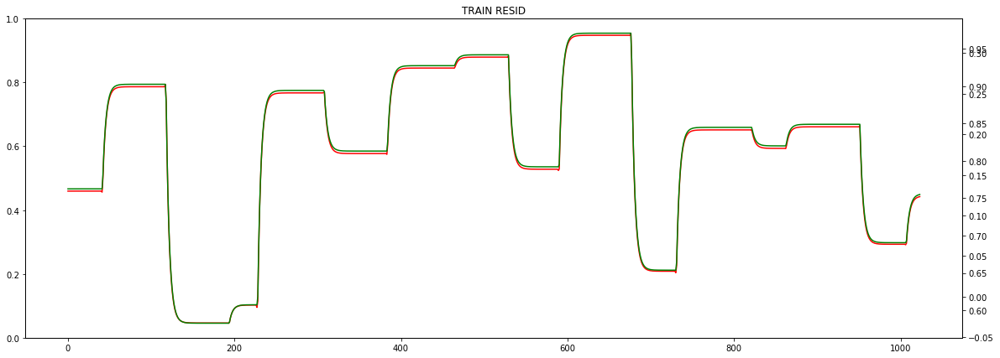

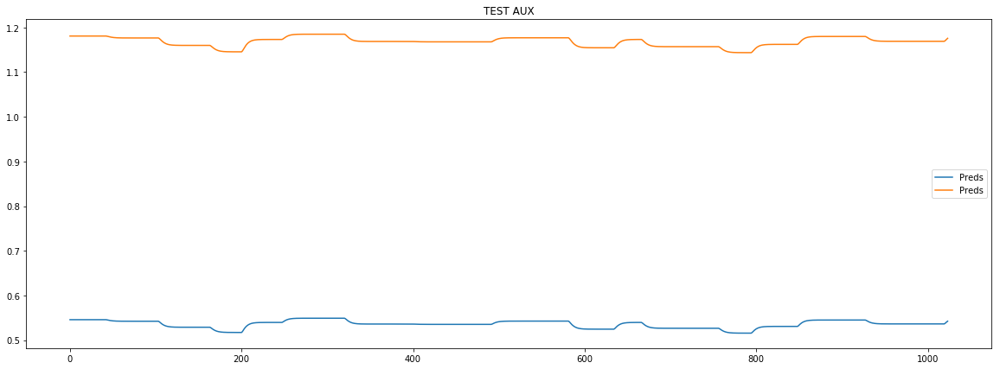

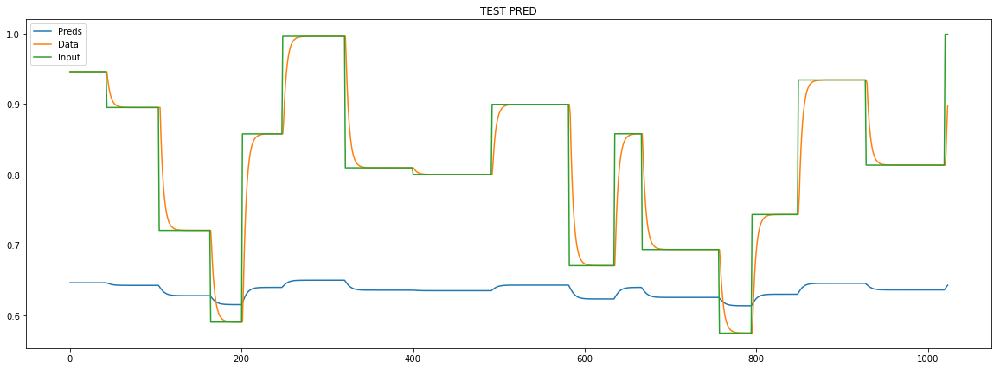

loss rate [0.9954430958937194]
Epoch [5] 
     train_loss[12769.126714329594] 
     eval_train[1652.215182804431] 
     eval_test[1888.095667143437]



aux preds: 0.9420128464698792 1.2170989513397217
main loss 0.0
aux loss 1023.4780384944036
const loss 0.6241415767715528
combined loss 1024.102180071175 


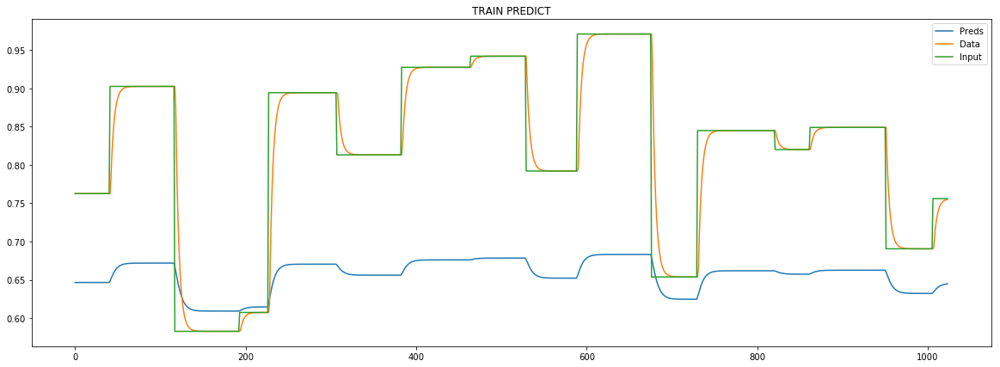

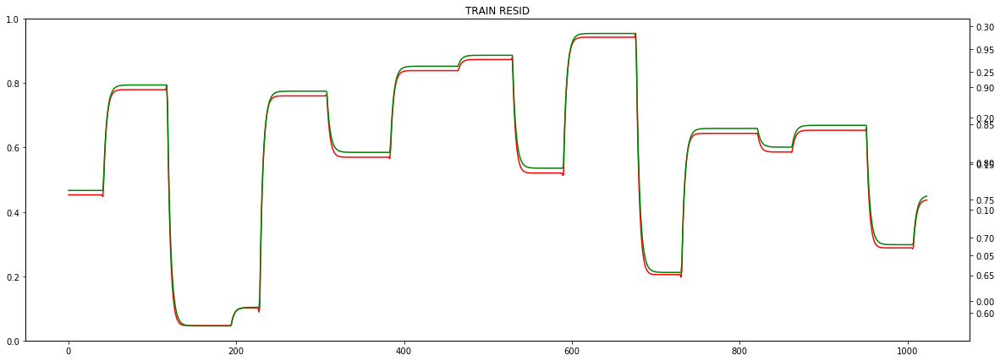

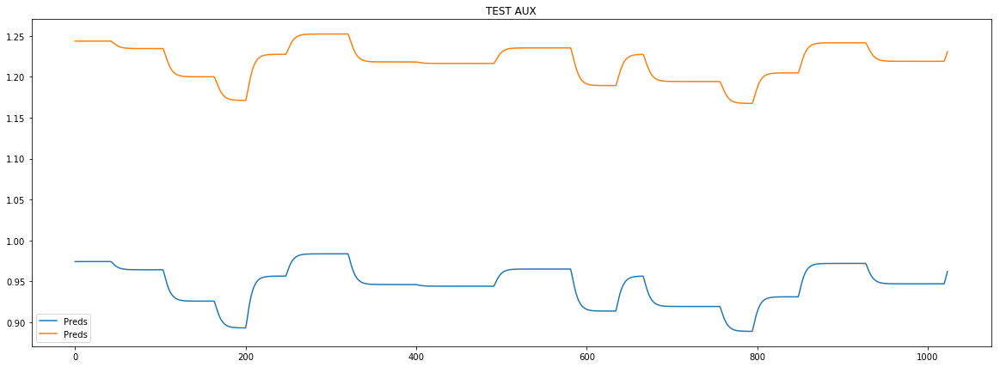

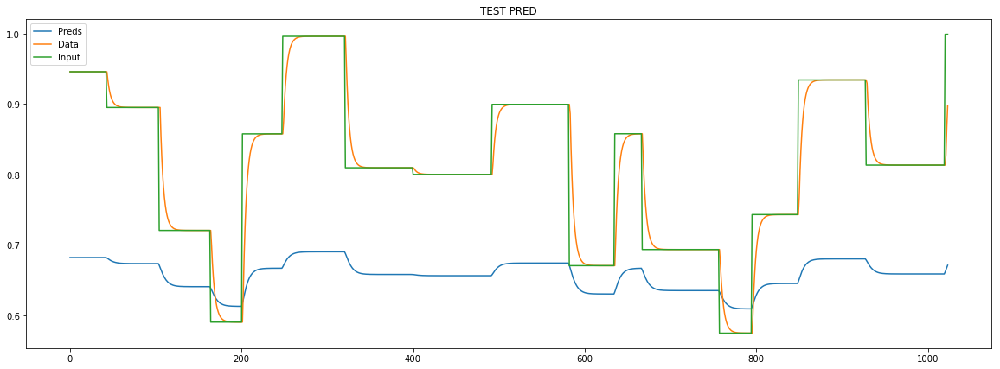

loss rate [0.9958155126401109]
Epoch [6] 
     train_loss[1024.102180071175] 
     eval_train[787.1437811782727] 
     eval_test[861.6261656907471]



aux preds: 0.7684516906738281 1.2332134246826172
main loss 0.0
aux loss 580.0059811518743
const loss 4.381839472513932
combined loss 584.3878206243882 


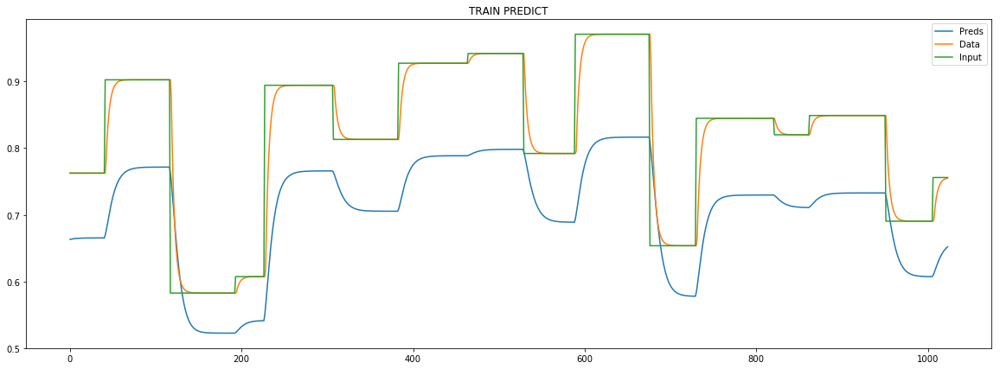

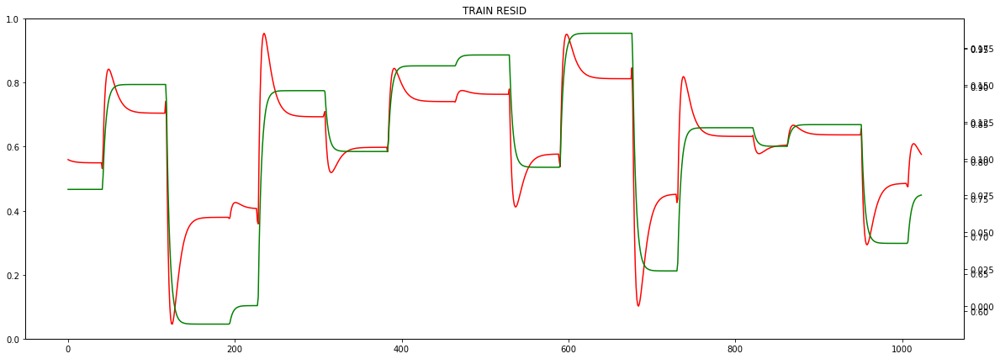

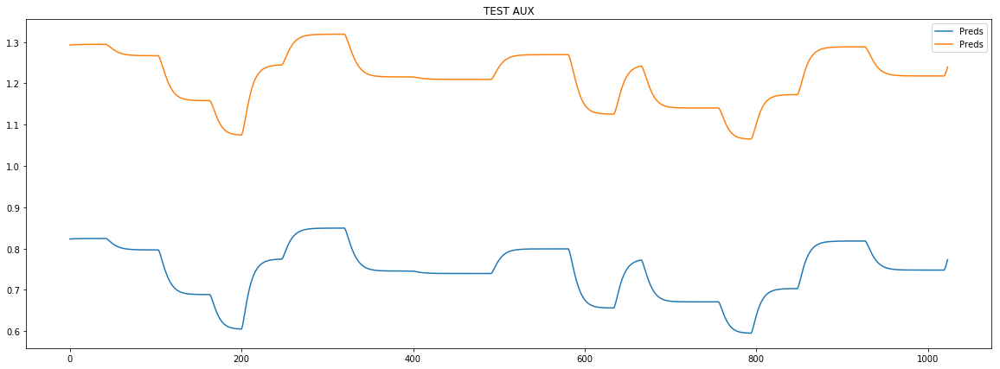

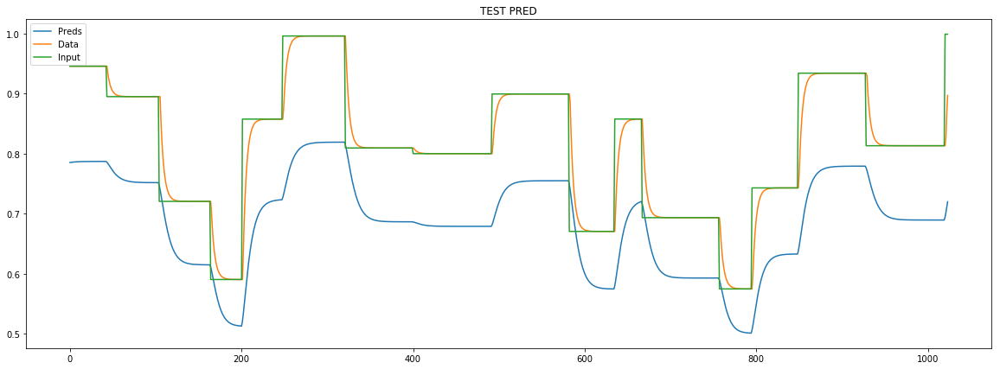

loss rate [0.9962902422759062]
Epoch [7] 
     train_loss[584.3878206243882] 
     eval_train[204.25878842060382] 
     eval_test[221.0145897215063]



aux preds: 0.7617841362953186 1.2188104391098022
main loss 0.0
aux loss 359.465427838839
const loss 10.80880282475398
combined loss 370.27423066359296 


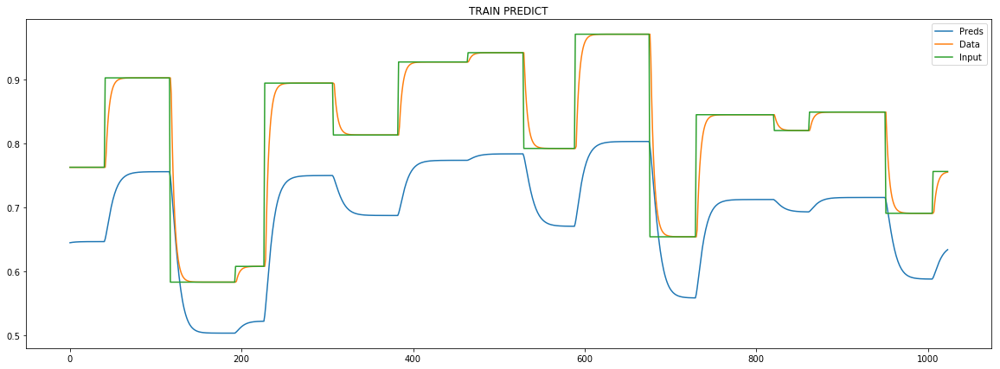

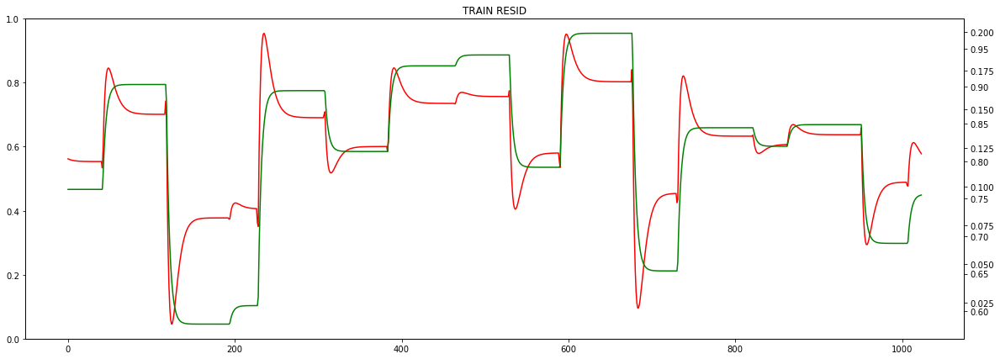

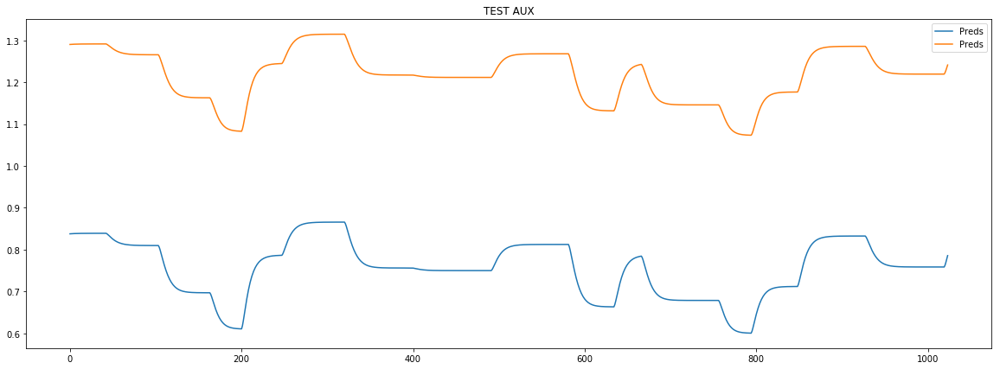

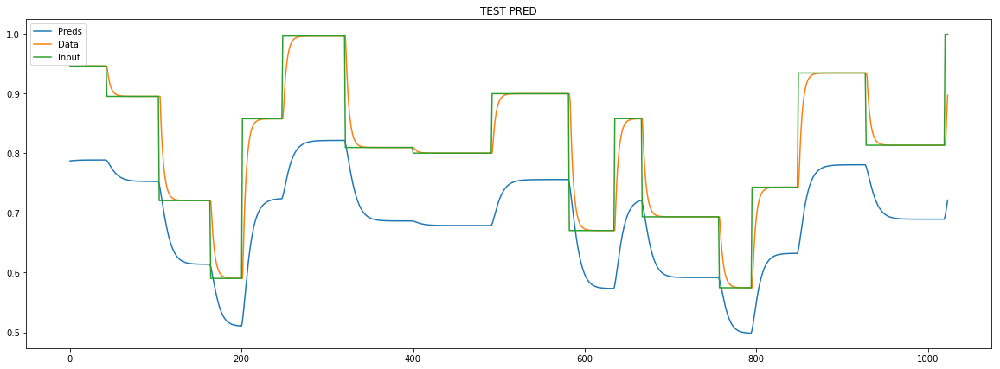

loss rate [0.7805341317655903]
Epoch [8] 
     train_loss[370.27423066359296] 
     eval_train[200.88696371592007] 
     eval_test[217.32508275725624]



aux preds: 0.7498911619186401 1.2209811210632324
main loss 0.0
aux loss 331.12495466379016
const loss 10.727571890904354
combined loss 341.8525265546945 


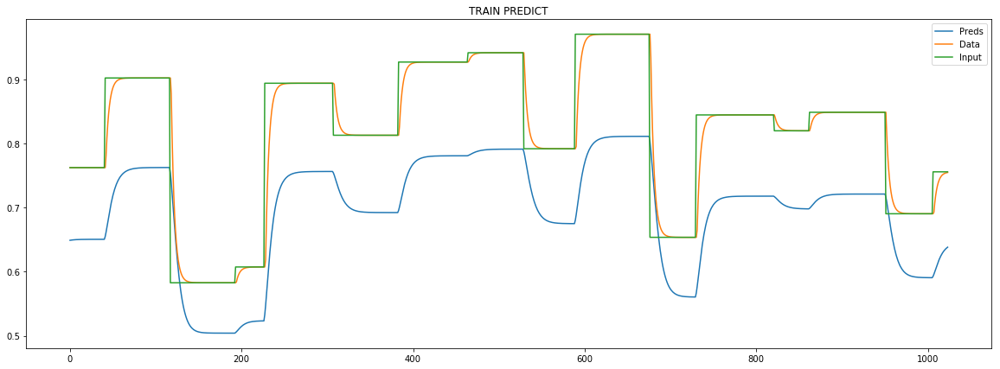

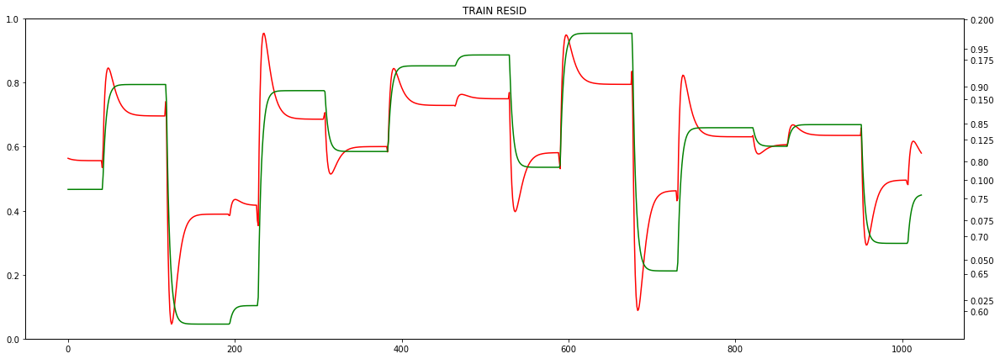

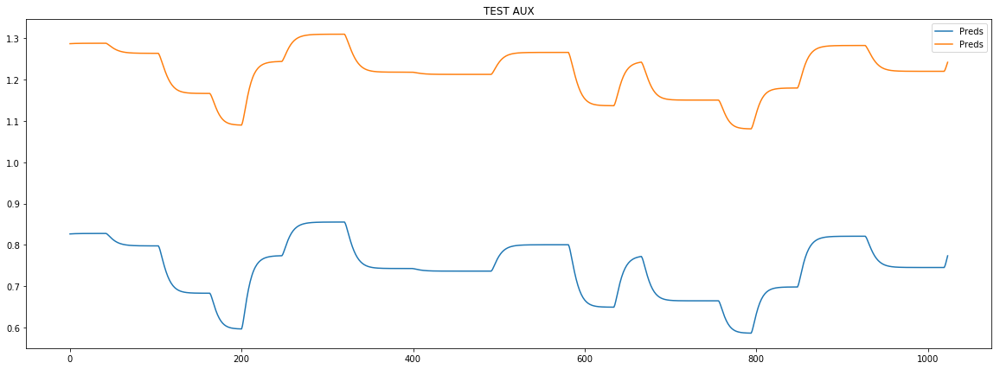

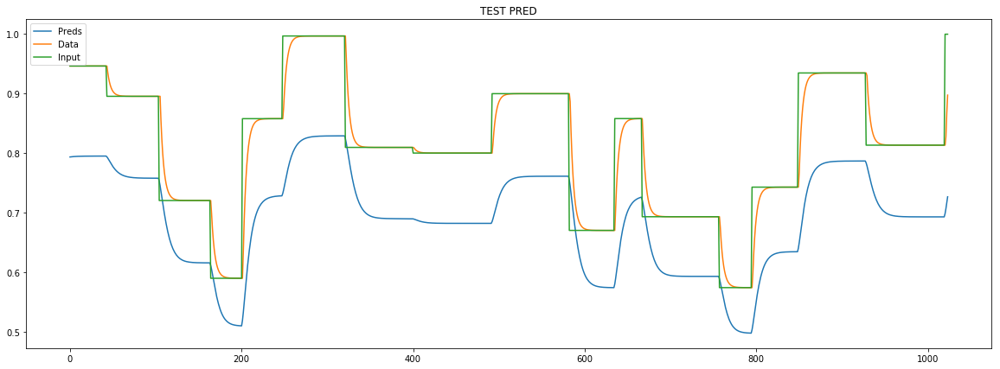

loss rate [0.5100054148832959]
Epoch [9] 
     train_loss[341.8525265546945] 
     eval_train[196.54227589643918] 
     eval_test[212.32540717991915]



aux preds: 0.7292925119400024 1.2178131341934204
main loss 0.0
aux loss 300.97432415301984
const loss 10.298523352696346
combined loss 311.2728475057162 


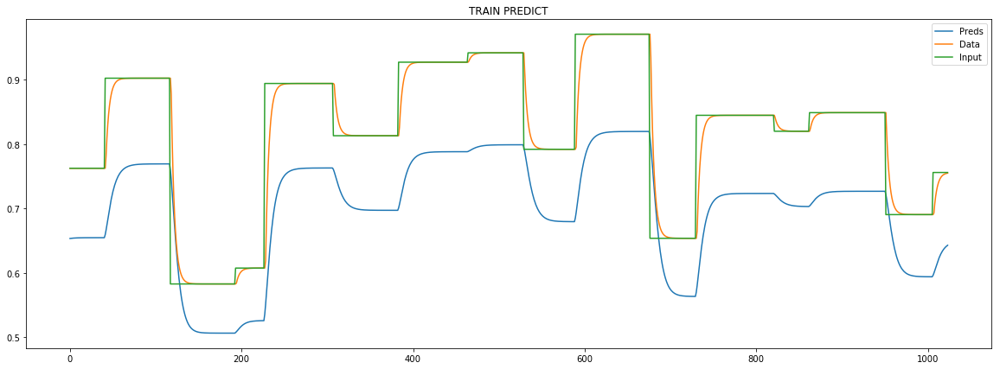

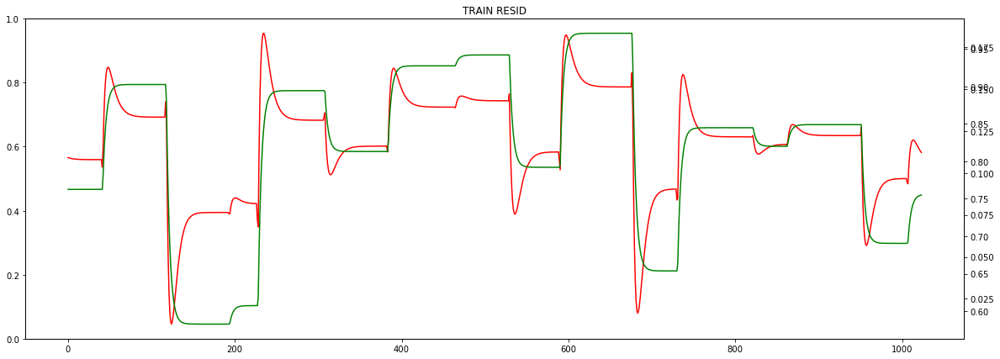

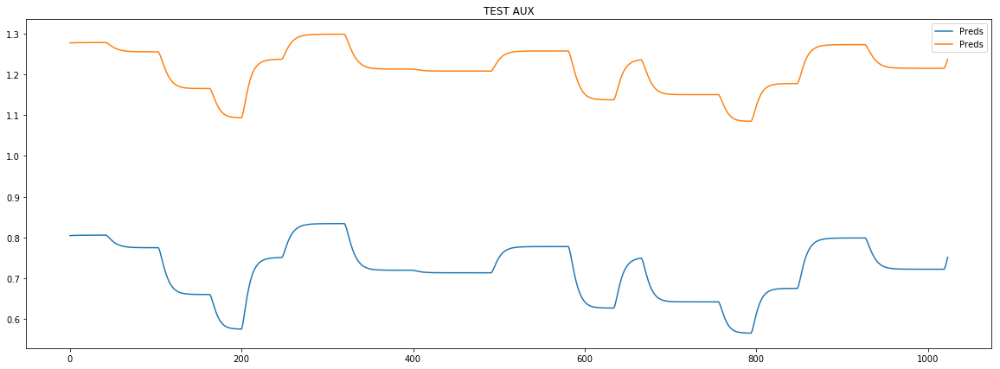

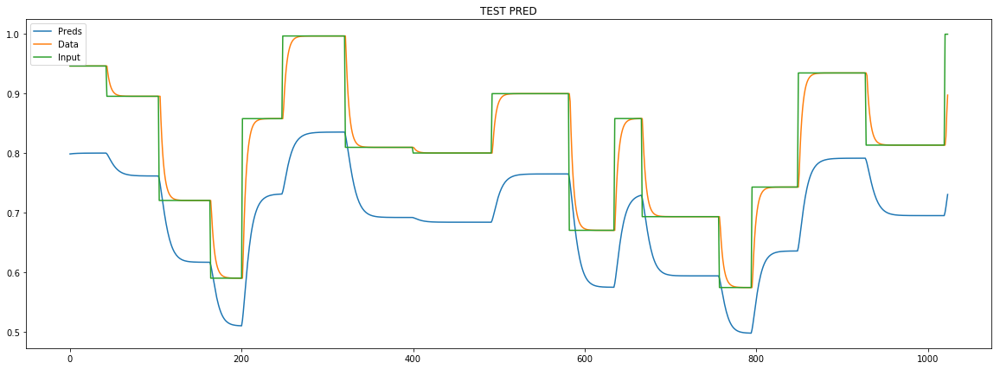

loss rate [0.07814122302942572]
Epoch [10] 
     train_loss[311.2728475057162] 
     eval_train[185.26885455388287] 
     eval_test[199.94043818387118]



aux preds: 0.7188155651092529 1.2057234048843384
main loss 0.0
aux loss 286.34321961036096
const loss 9.762768937991215
combined loss 296.1059885483522 


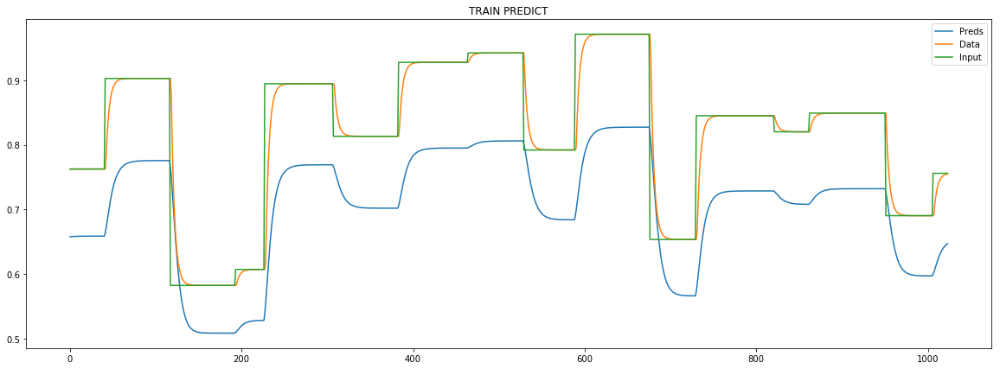

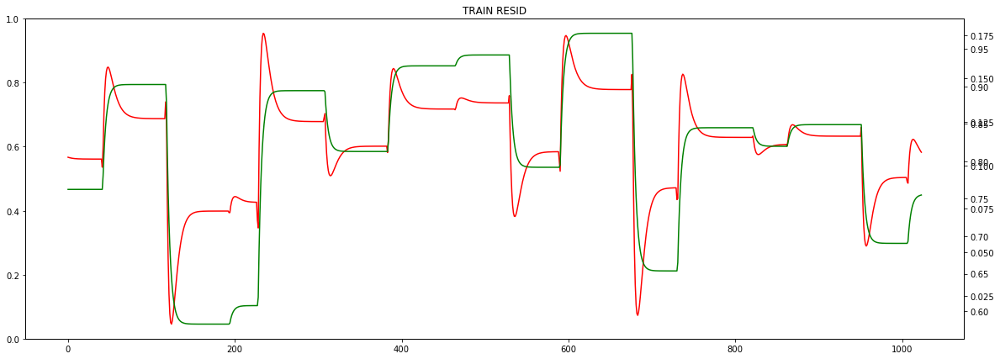

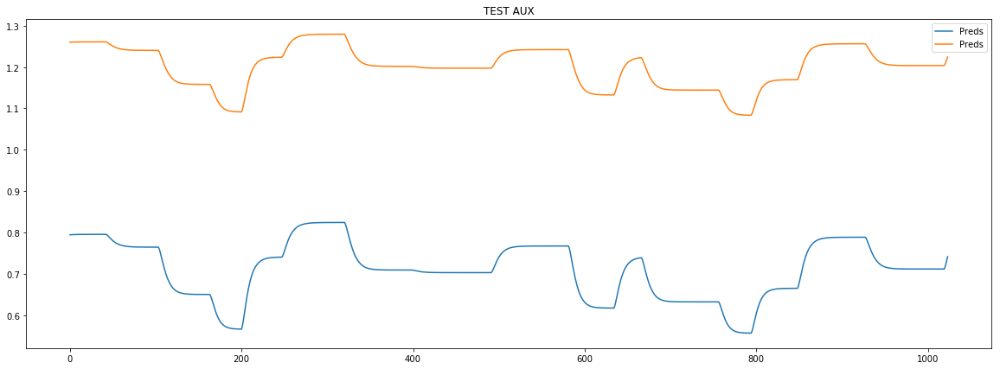

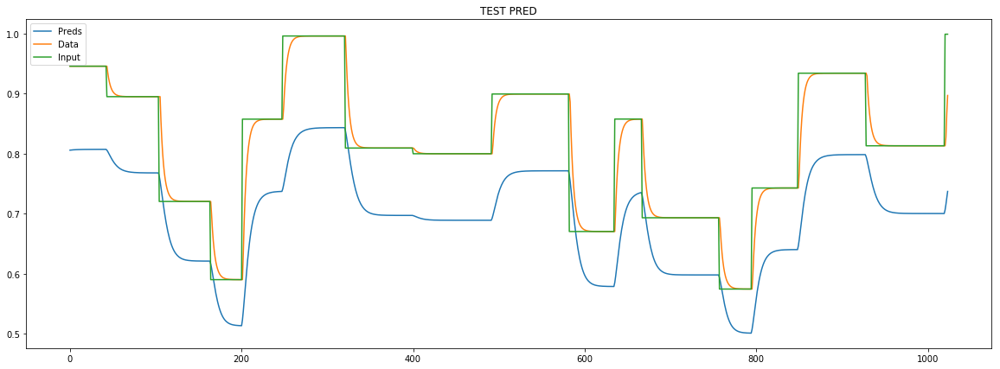

loss rate [0.08566405786027753]
Epoch [11] 
     train_loss[296.1059885483522] 
     eval_train[178.05126962294946] 
     eval_test[191.88587147539312]



aux preds: 0.7136617302894592 1.1969647407531738
main loss 0.0
aux loss 273.9016758845403
const loss 9.245442821429325
combined loss 283.1471187059696 


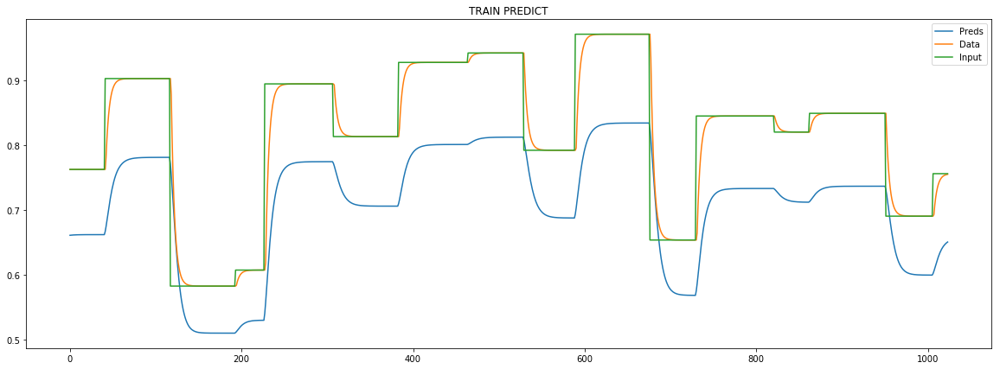

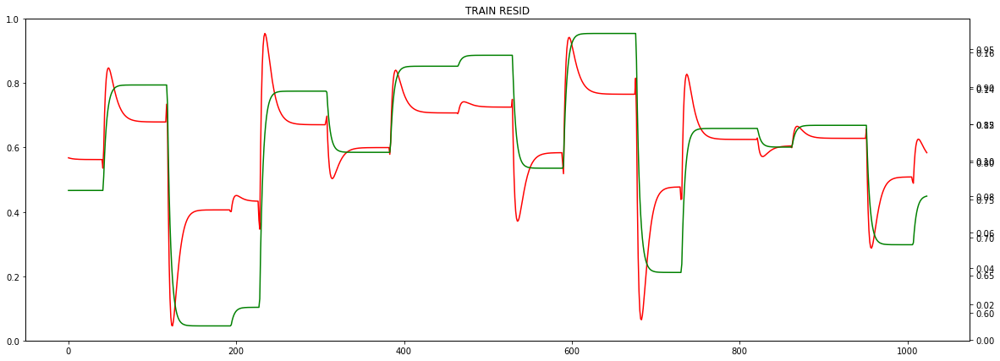

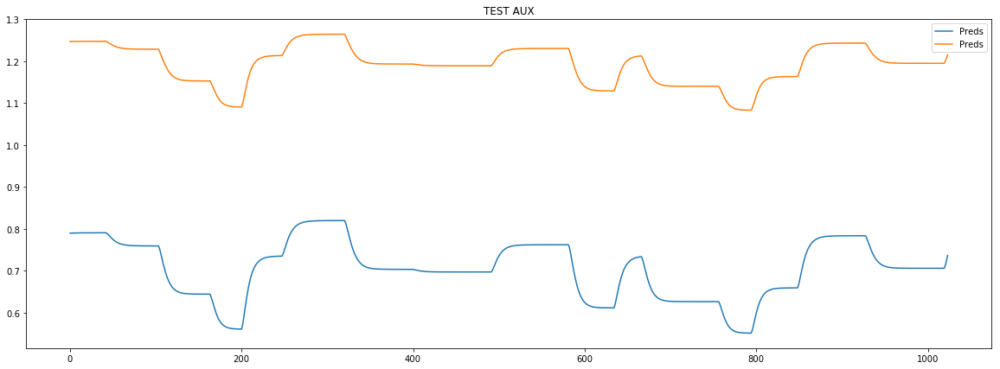

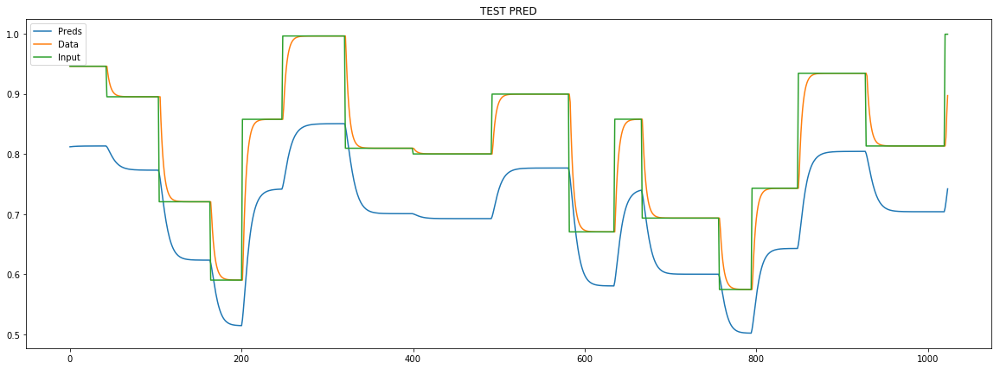

loss rate [0.08435480183559796]
Epoch [12] 
     train_loss[283.1471187059696] 
     eval_train[171.23685371875763] 
     eval_test[184.3962061621926]



aux preds: 0.7076958417892456 1.1881287097930908
main loss 0.0
aux loss 264.55190247755786
const loss 8.83143659738394
combined loss 273.3833390749418 


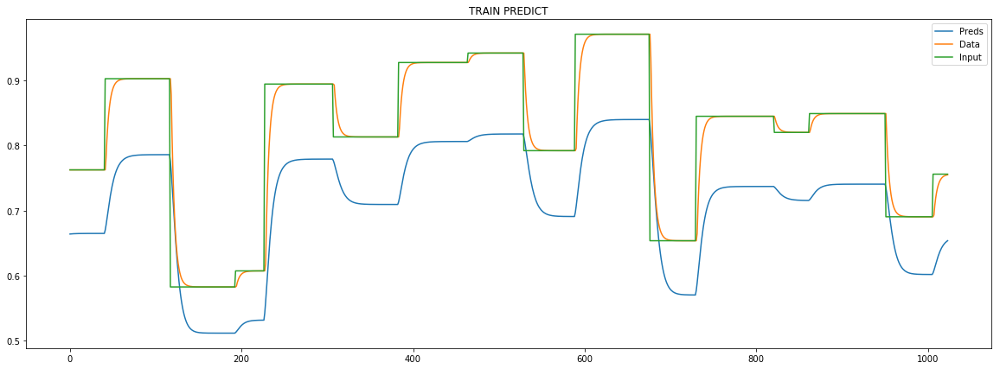

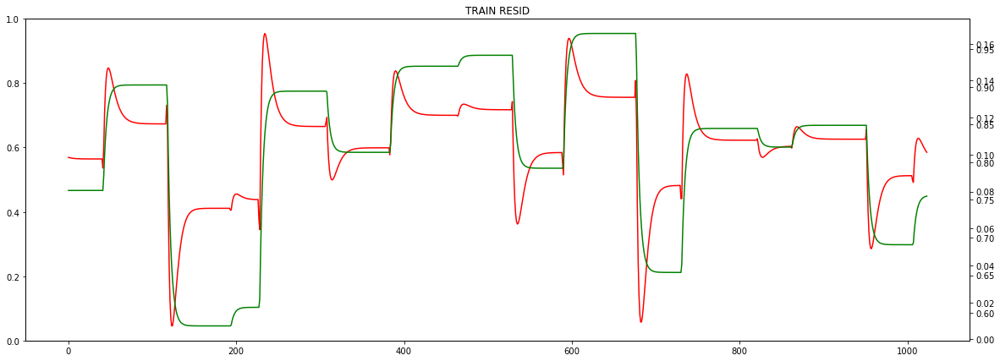

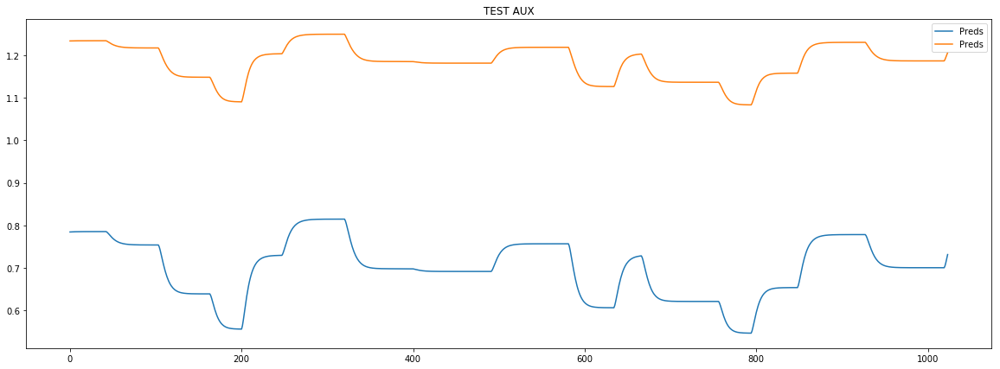

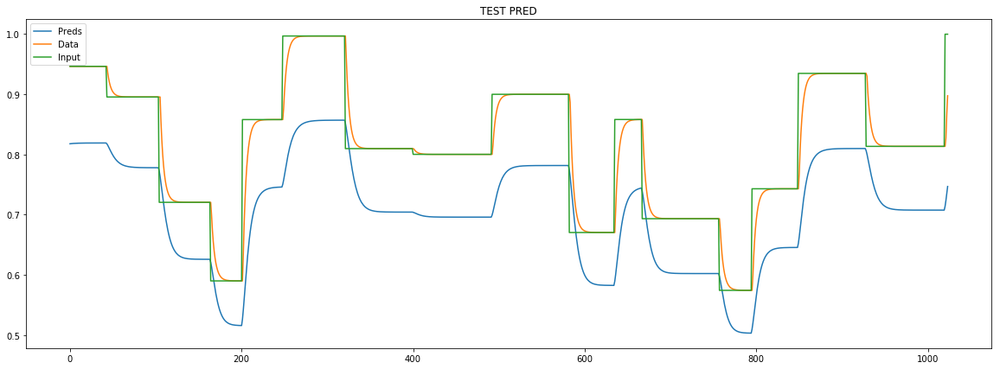

loss rate [0.07135588468272569]
Epoch [13] 
     train_loss[273.3833390749418] 
     eval_train[165.82558617225058] 
     eval_test[178.36854947697032]



aux preds: 0.7007869482040405 1.179112434387207
main loss 0.0
aux loss 255.00260998652533
const loss 8.395160344930796
combined loss 263.3977703314561 


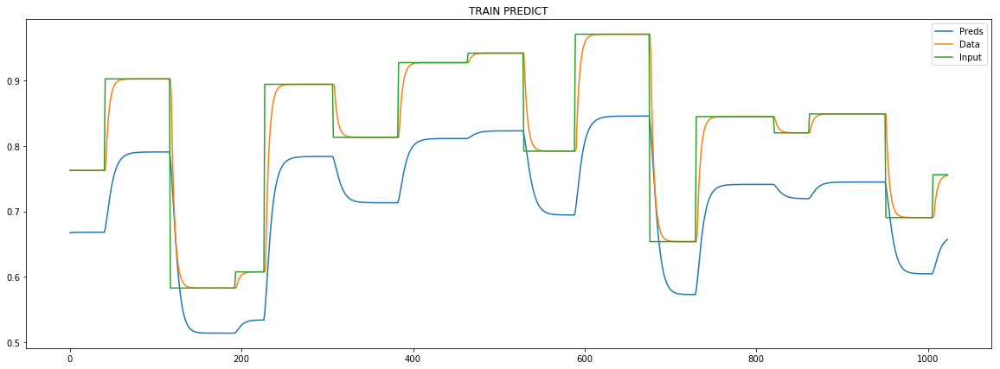

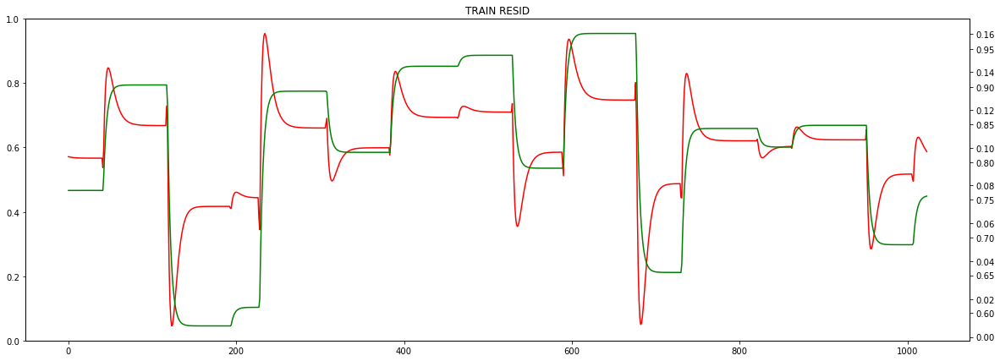

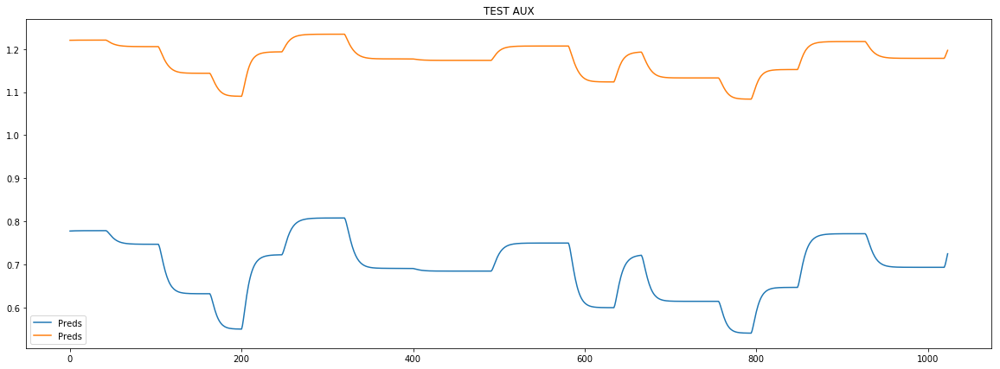

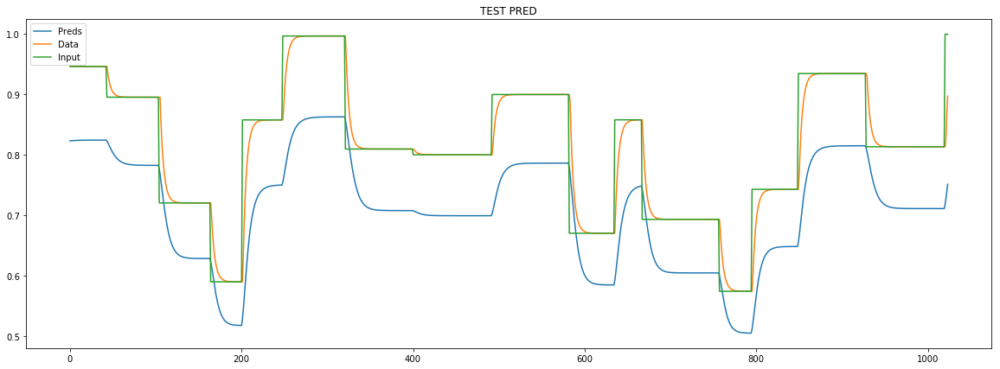

loss rate [0.06912588274837295]
Epoch [14] 
     train_loss[263.3977703314561] 
     eval_train[160.20615961918463] 
     eval_test[172.10330429944125]



aux preds: 0.6941993236541748 1.1696372032165527
main loss 0.0
aux loss 246.47372421851526
const loss 7.9584085666216335
combined loss 254.4321327851369 


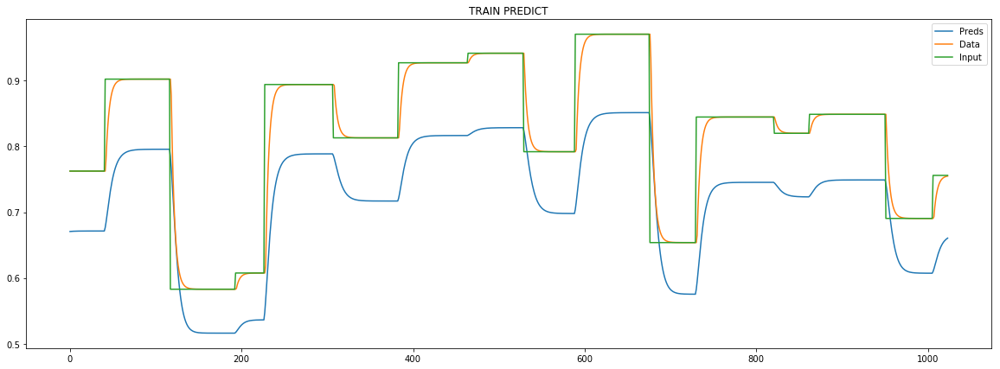

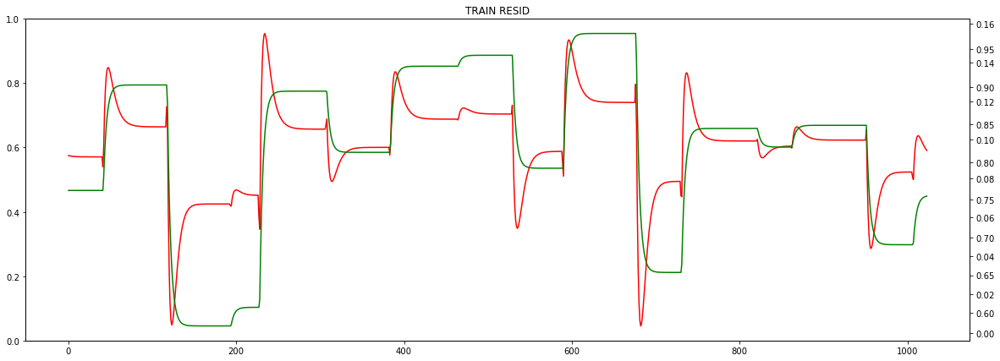

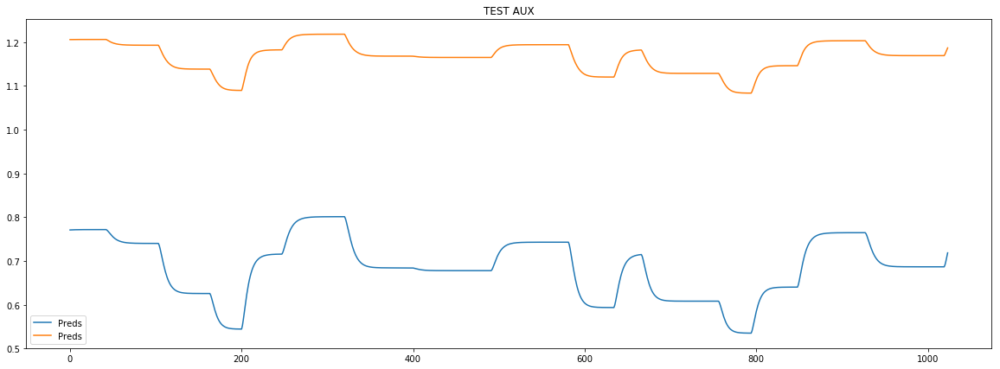

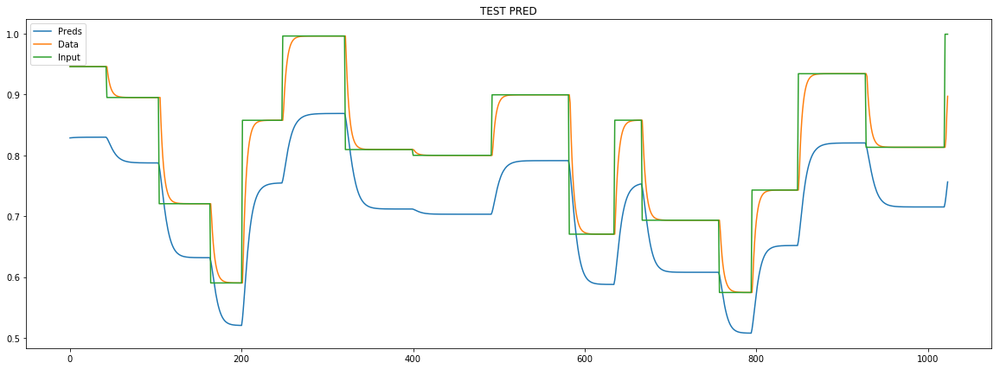

loss rate [0.06541282499357104]
Epoch [15] 
     train_loss[254.4321327851369] 
     eval_train[155.3240217933288] 
     eval_test[166.62694304639643]



aux preds: 0.6874497532844543 1.1597682237625122
main loss 0.0
aux loss 237.91672090383676
const loss 7.5462217560181255
combined loss 245.4629426598549 


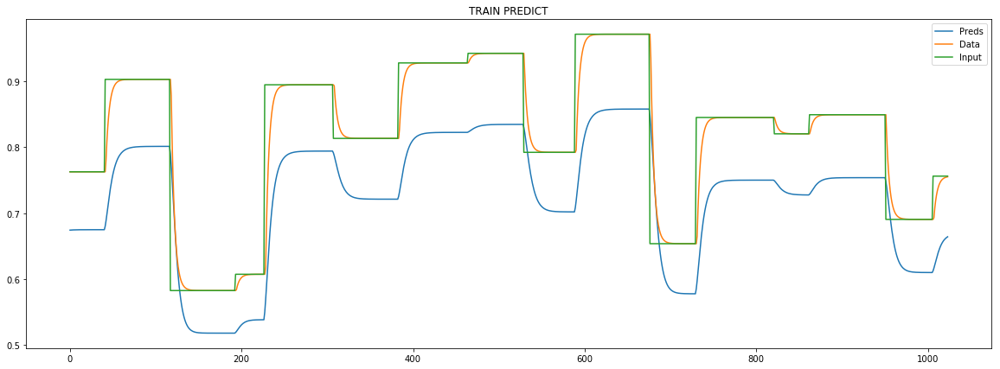

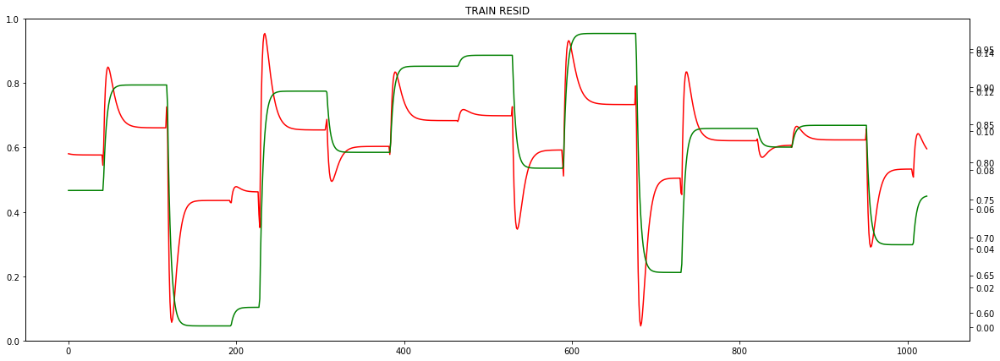

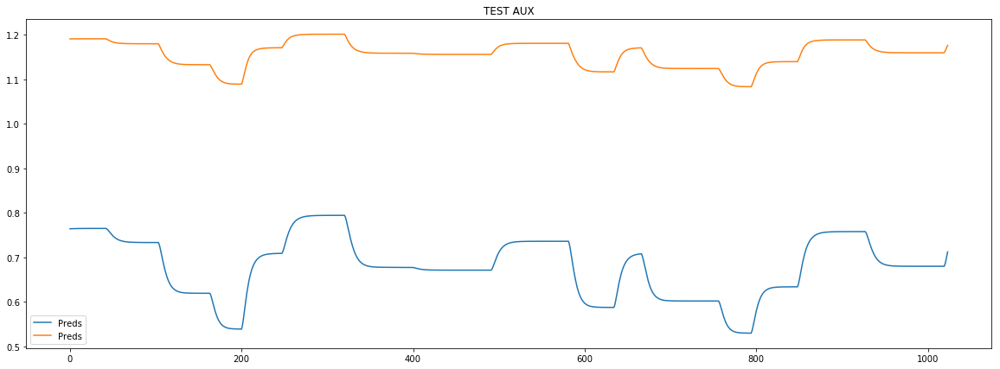

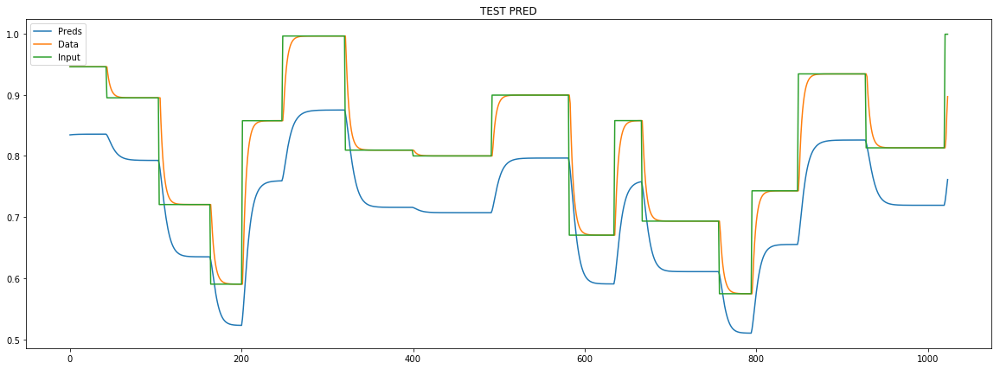

loss rate [0.06465042263993925]
Epoch [16] 
     train_loss[245.4629426598549] 
     eval_train[150.50172547652173] 
     eval_test[161.22271368720314]



aux preds: 0.6808706521987915 1.1494109630584717
main loss 0.0
aux loss 229.9506457402156
const loss 7.1686632587359504
combined loss 237.11930899895157 


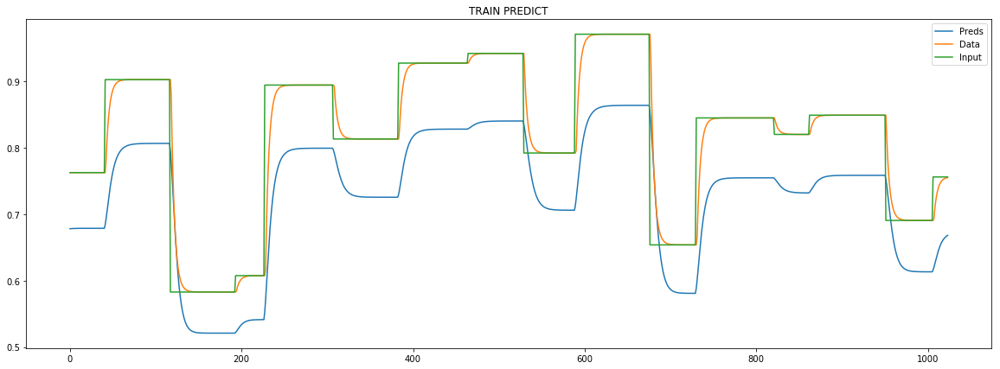

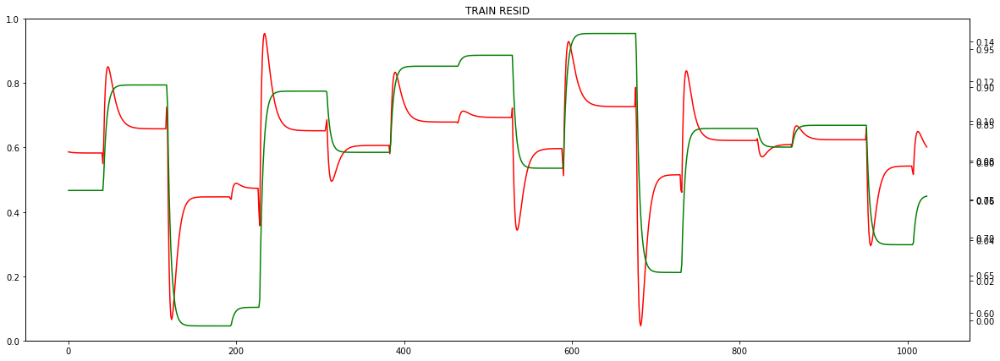

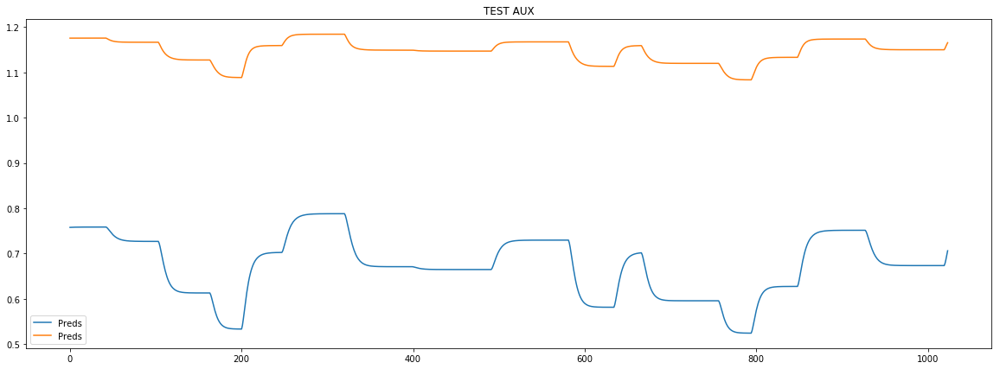

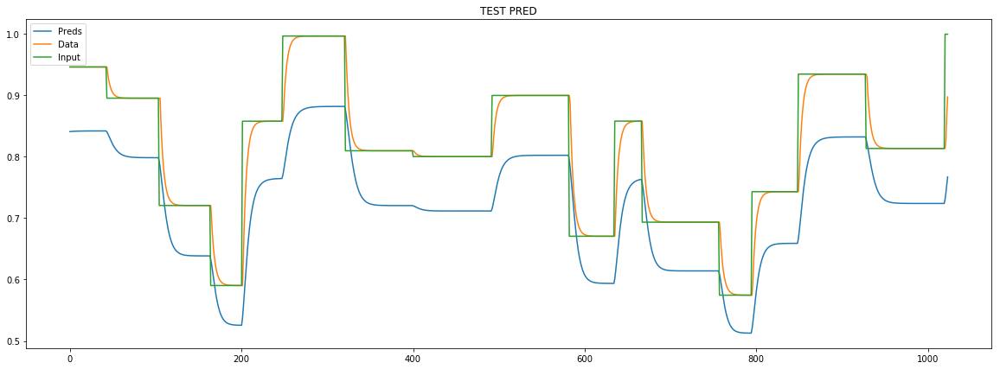

loss rate [0.06156712953600352]
Epoch [17] 
     train_loss[237.11930899895157] 
     eval_train[146.2022130030852] 
     eval_test[156.3907641064037]



aux preds: 0.6755098104476929 1.1389867067337036
main loss 0.0
aux loss 222.53016134408804
const loss 6.8585716256728535
combined loss 229.3887329697609 


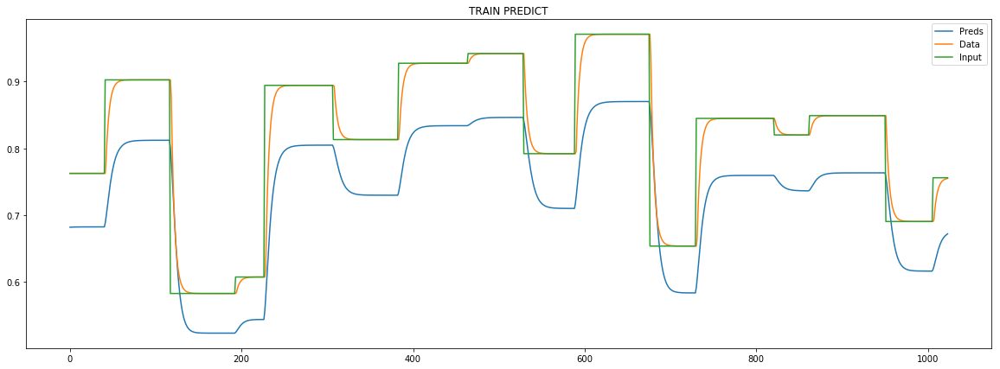

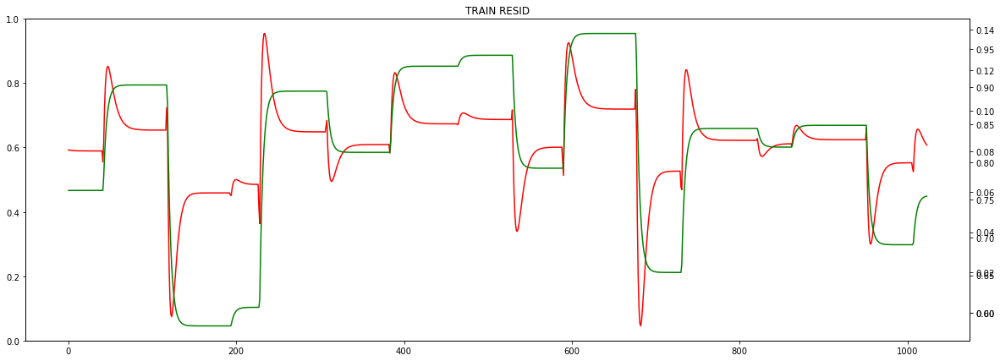

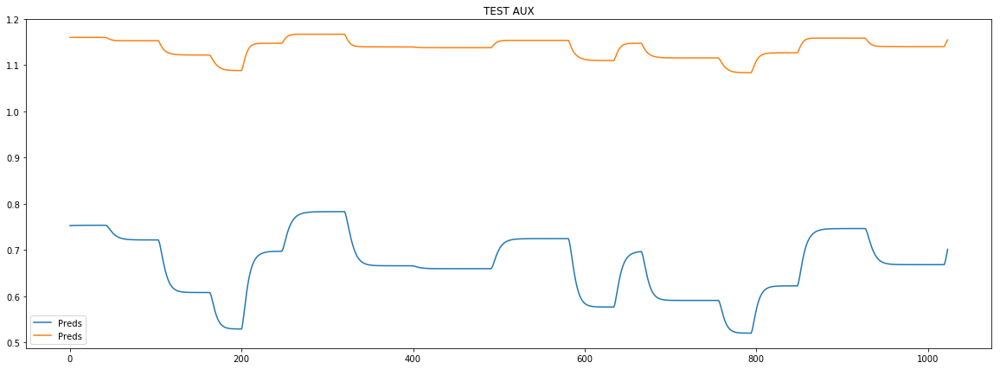

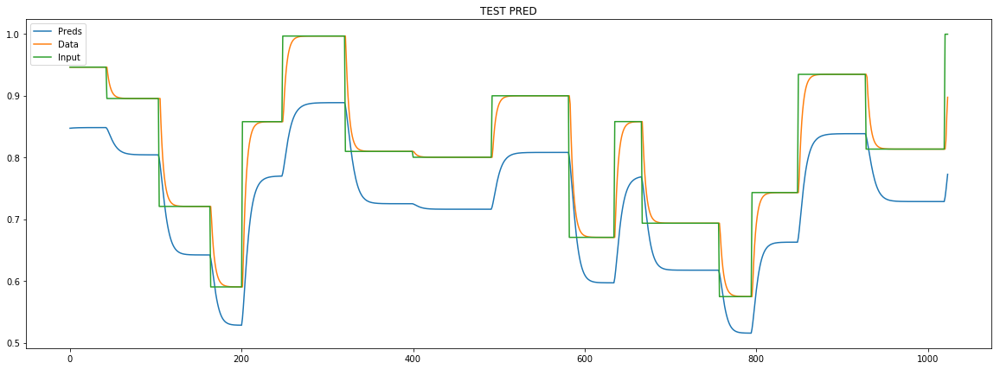

loss rate [0.05785523487371791]
Epoch [18] 
     train_loss[229.3887329697609] 
     eval_train[142.35423793242526] 
     eval_test[152.0748591856523]



aux preds: 0.6702601909637451 1.1283490657806396
main loss 0.0
aux loss 215.3714834359976
const loss 6.587249705424676
combined loss 221.95873314142227 


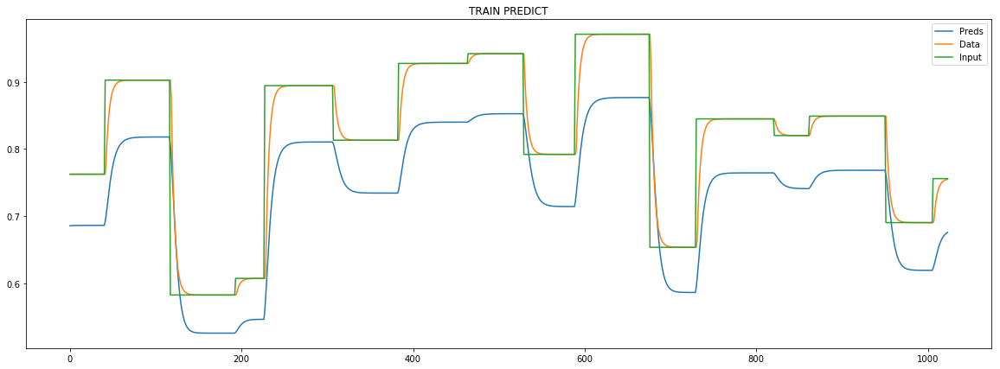

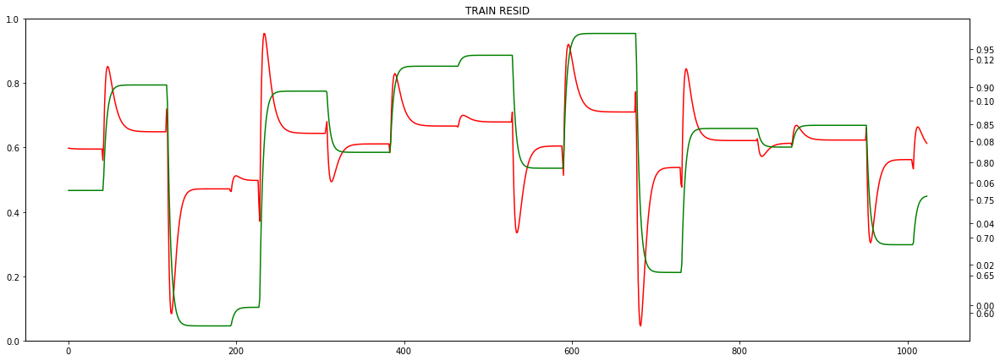

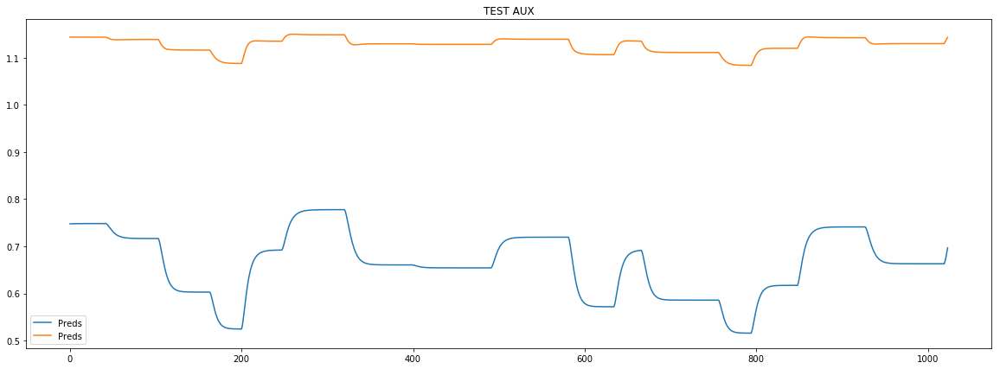

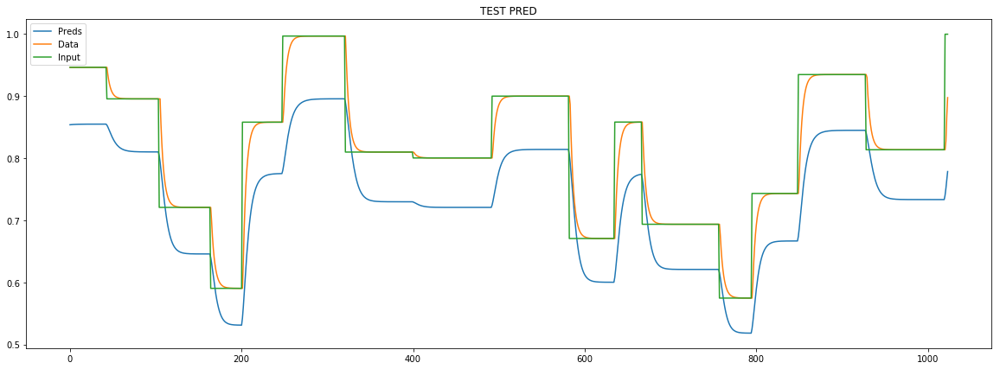

loss rate [0.05429670957777499]
Epoch [19] 
     train_loss[221.95873314142227] 
     eval_train[138.7726601224679] 
     eval_test[148.06193525140938]



aux preds: 0.6655409932136536 1.1174817085266113
main loss 0.0
aux loss 208.59361281761755
const loss 6.349591475266677
combined loss 214.94320429288422 


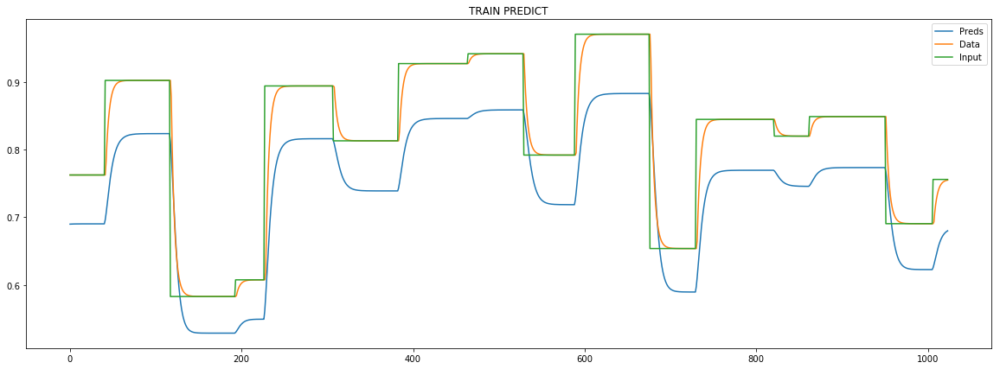

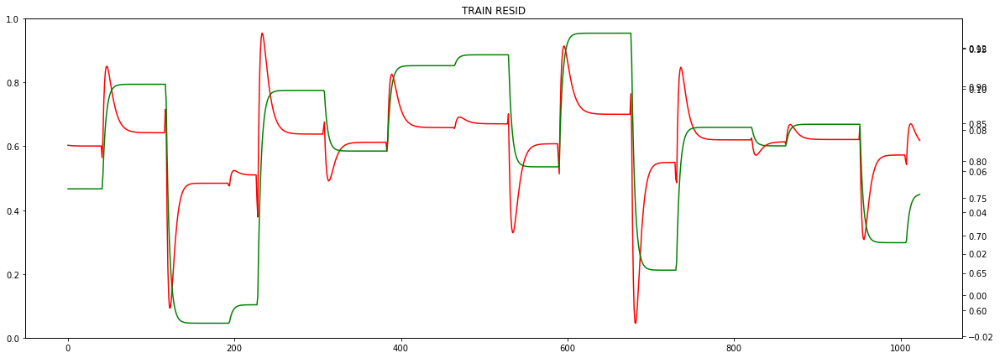

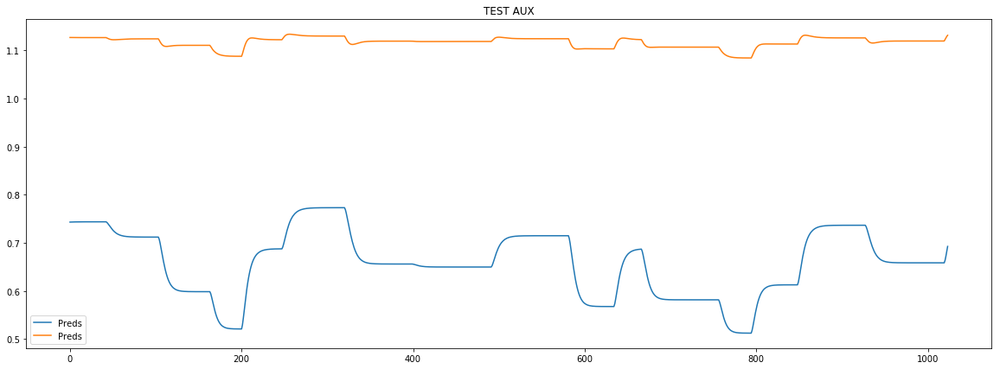

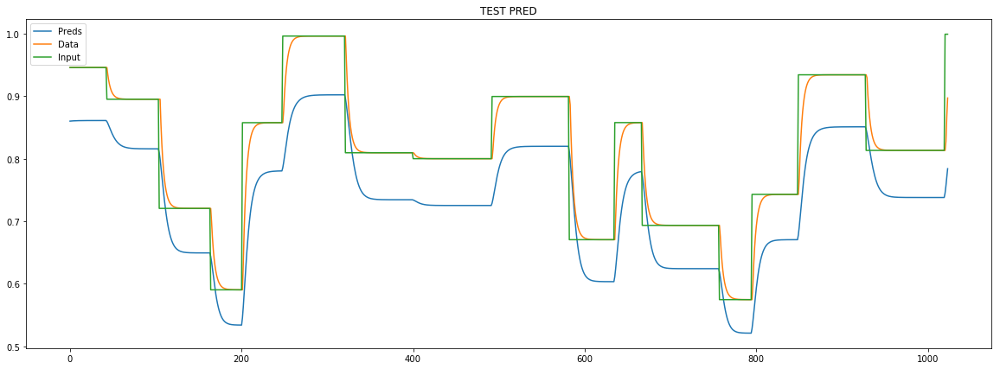

loss rate [0.049828465317610426]
Epoch [20] 
     train_loss[214.94320429288422] 
     eval_train[135.66524994831818] 
     eval_test[144.59316364201632]



aux preds: 0.6606238484382629 1.1066770553588867
main loss 0.0
aux loss 201.98827508779672
const loss 6.166532126756815
combined loss 208.15480721455353 


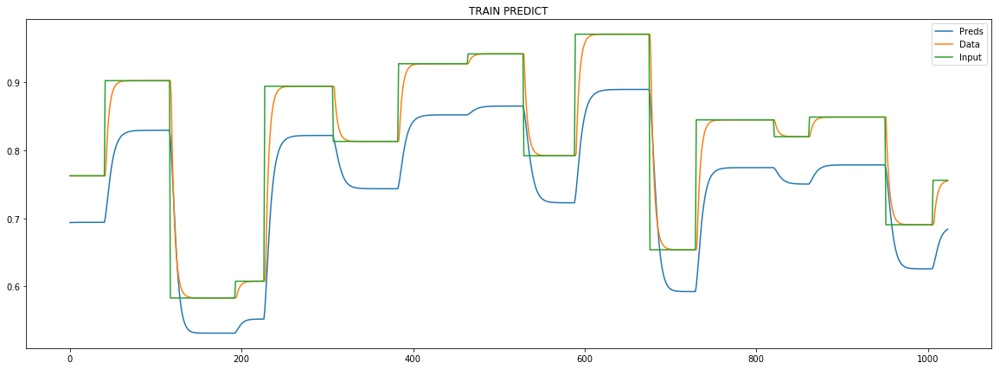

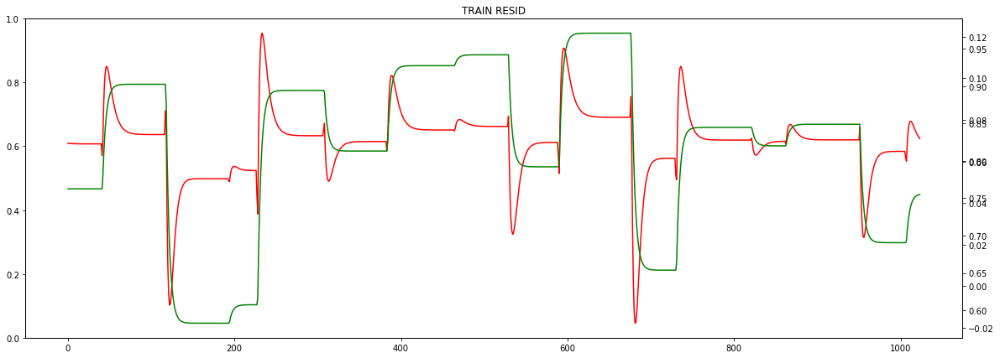

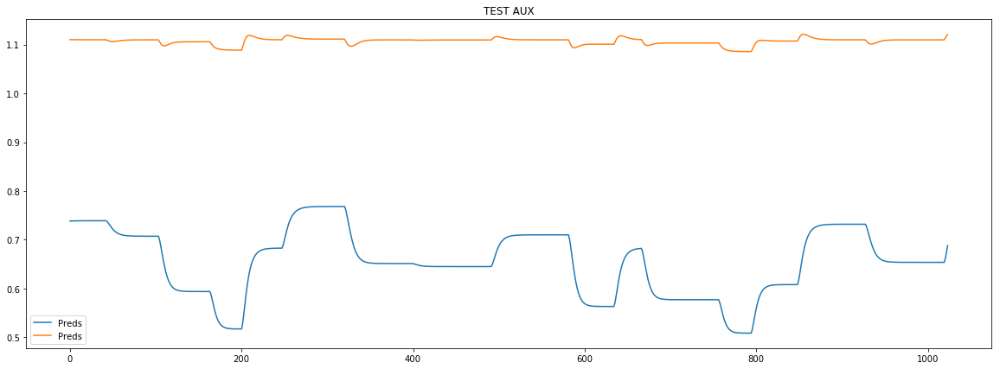

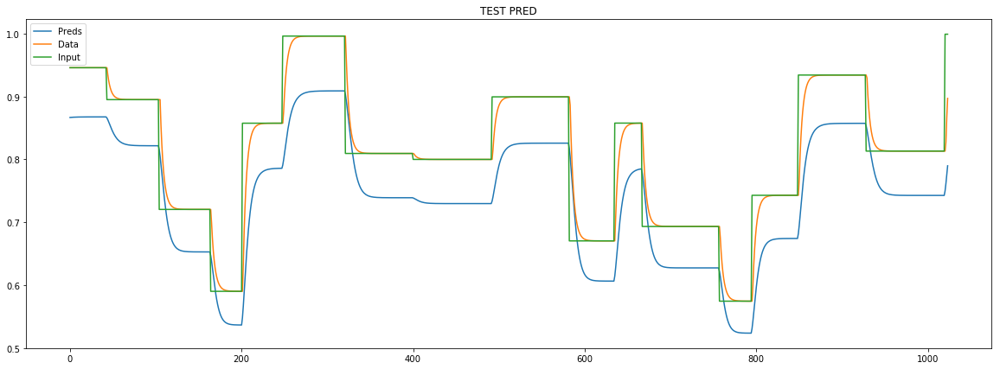

loss rate [0.04534478277275722]
Epoch [21] 
     train_loss[208.15480721455353] 
     eval_train[132.89123004216412] 
     eval_test[141.52125824581492]



aux preds: 0.6557788252830505 1.0963670015335083
main loss 0.0
aux loss 195.93083550379828
const loss 6.043388724327087
combined loss 201.97422422812537 


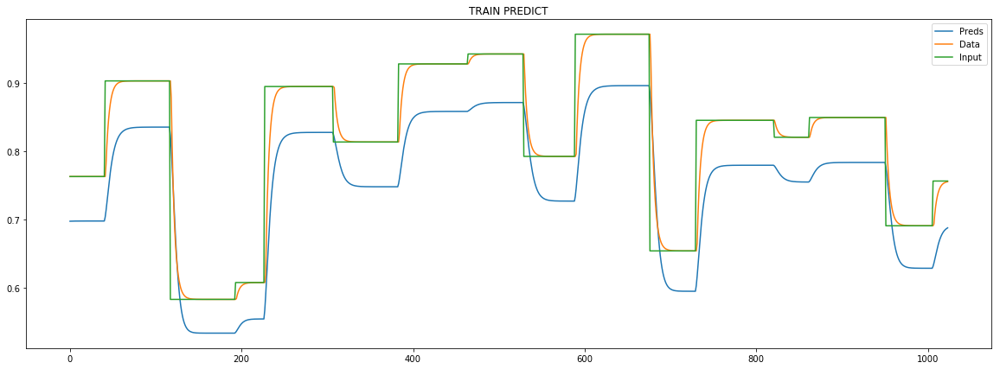

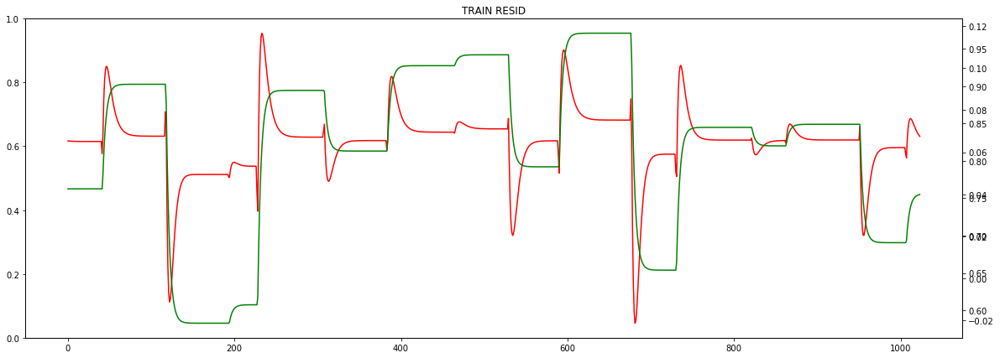

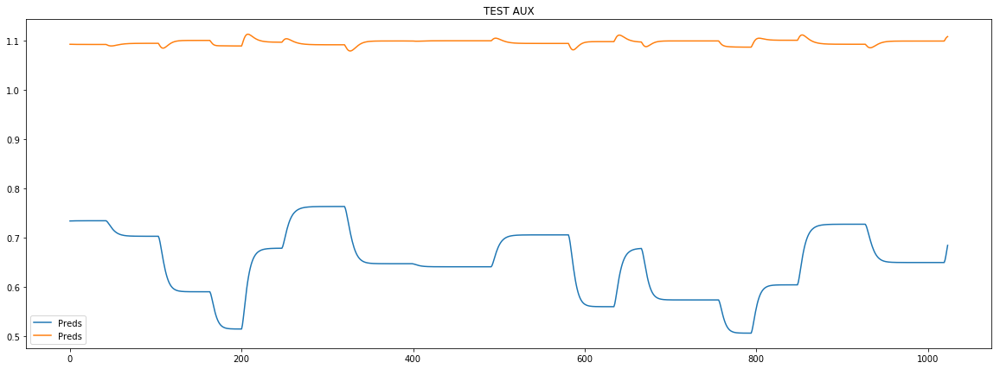

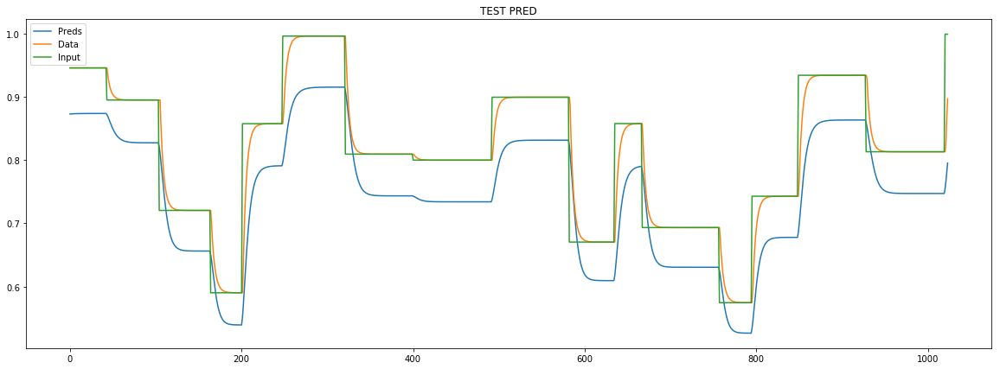

loss rate [0.03920235450377807]
Epoch [22] 
     train_loss[201.97422422812537] 
     eval_train[130.6323500275612] 
     eval_test[139.0518738898364]



aux preds: 0.650918185710907 1.0873571634292603
main loss 0.0
aux loss 190.3281269807082
const loss 5.9846462194736185
combined loss 196.31277320018182 


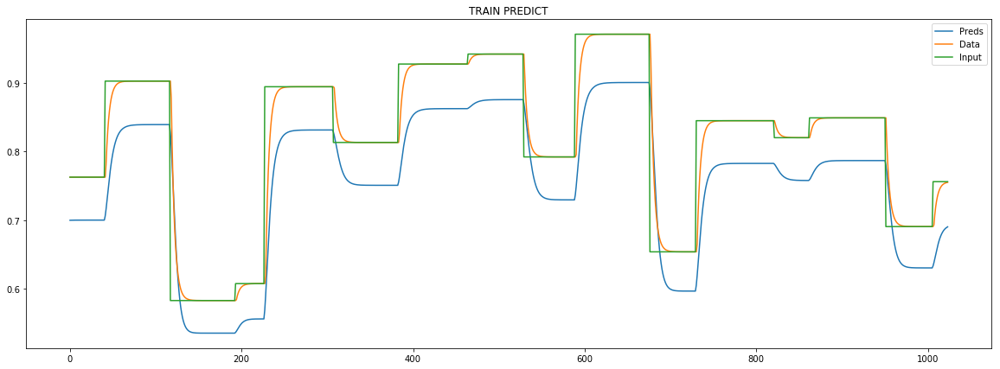

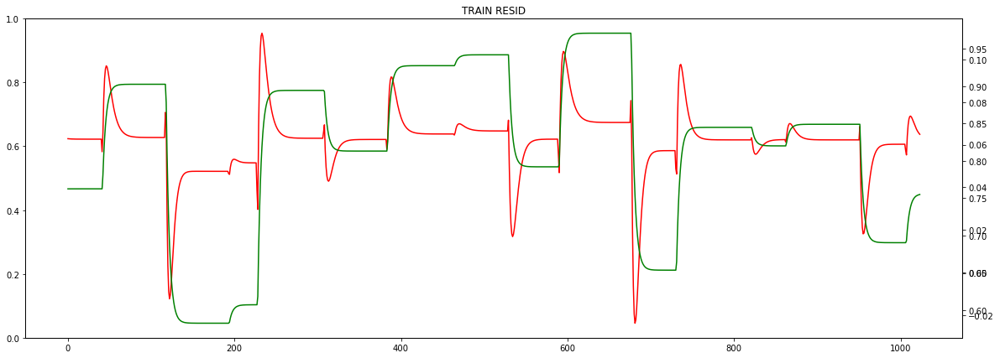

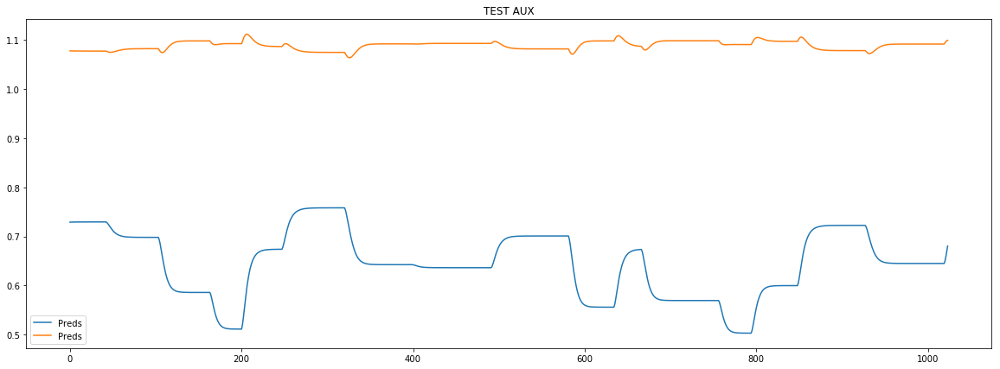

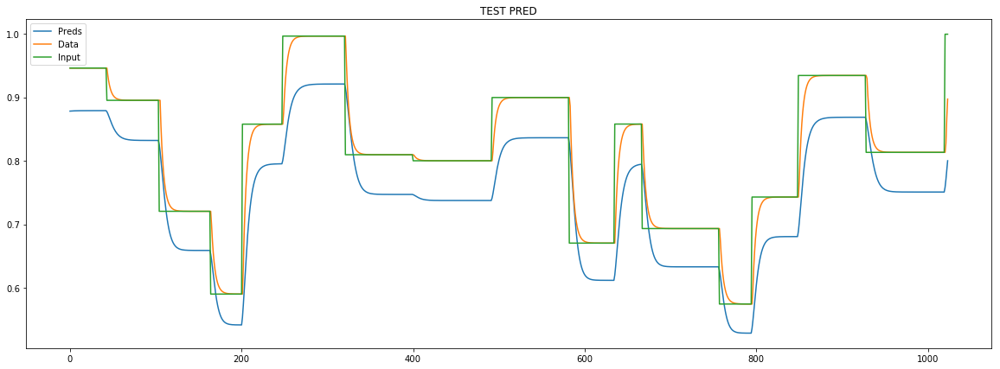

loss rate [0.03281592581222015]
Epoch [23] 
     train_loss[196.31277320018182] 
     eval_train[128.77091504518802] 
     eval_test[137.07135671919042]



aux preds: 0.6462866067886353 1.0805587768554688
main loss 0.0
aux loss 185.44502140925482
const loss 5.980104263012226
combined loss 191.42512567226706 


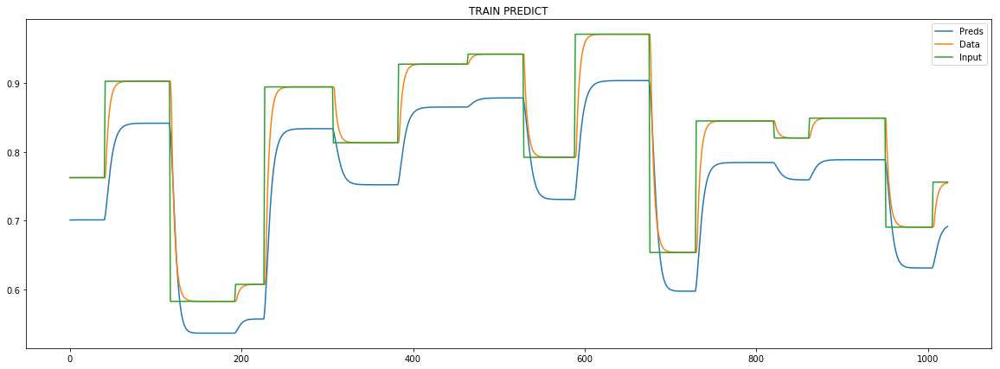

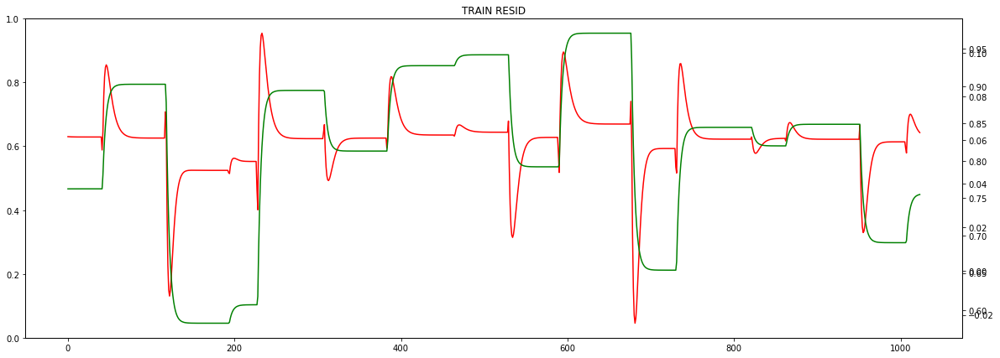

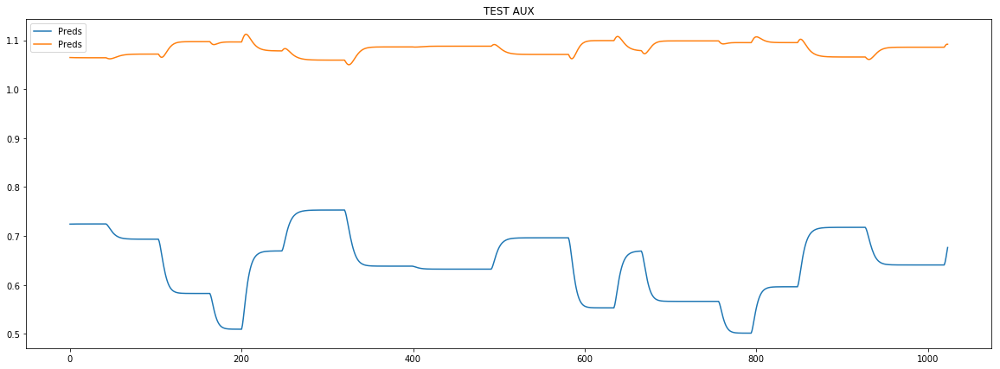

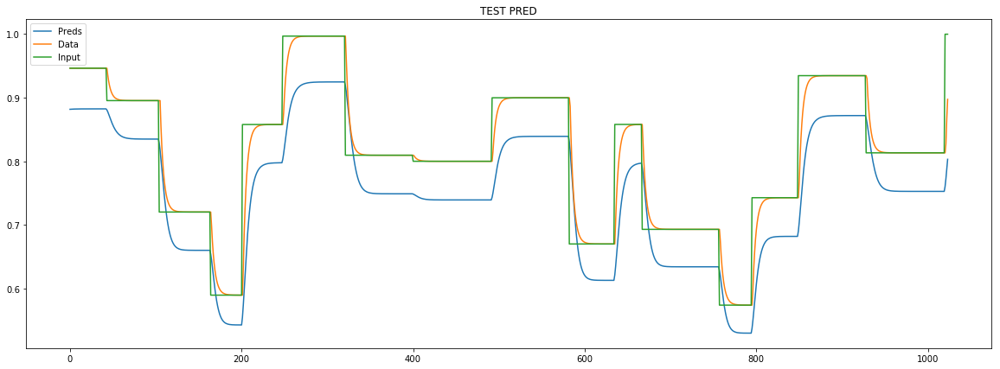

loss rate [0.02670567564426296]
Epoch [24] 
     train_loss[191.42512567226706] 
     eval_train[127.21909300639079] 
     eval_test[135.49700353362346]



aux preds: 0.6425677537918091 1.0767854452133179
main loss 0.0
aux loss 181.21276928828314
const loss 6.019051373004913
combined loss 187.23182066128805 


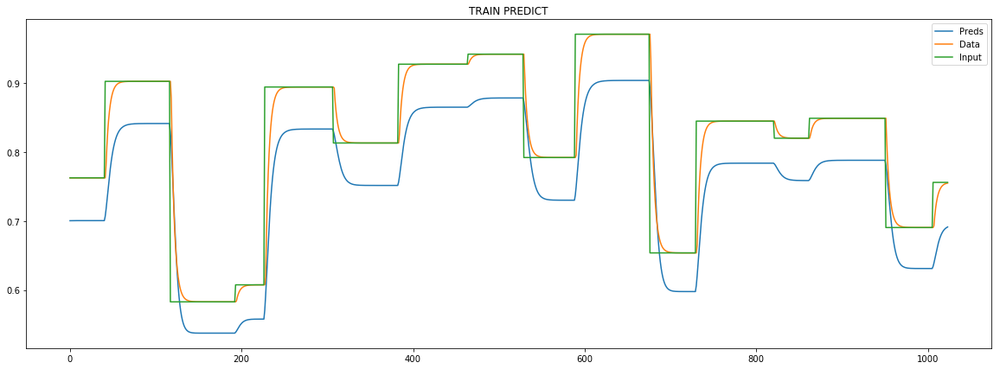

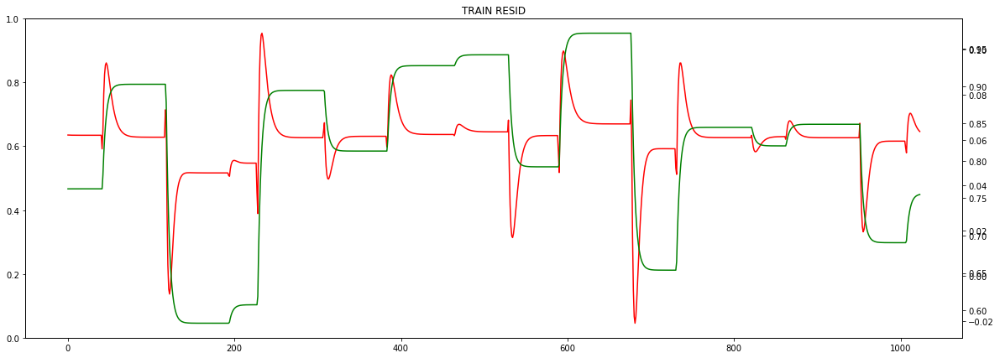

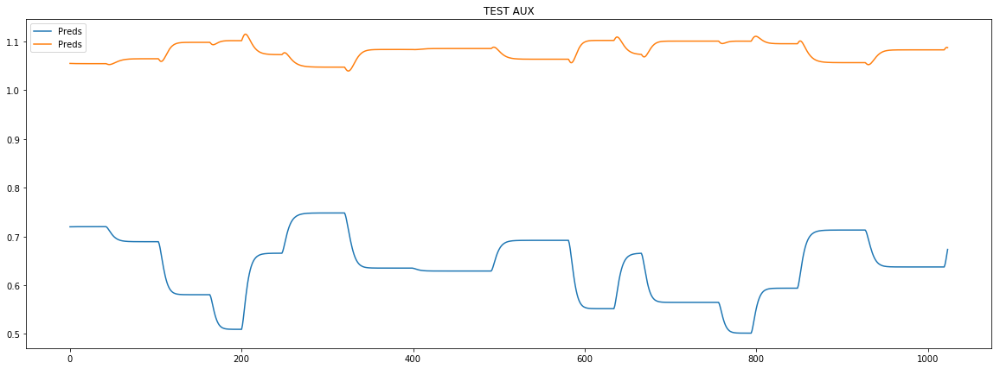

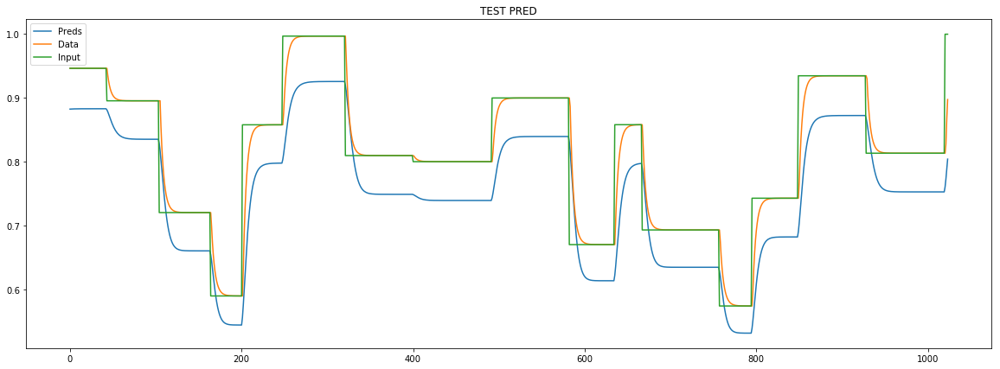

loss rate [0.022360009181033424]
Epoch [25] 
     train_loss[187.23182066128805] 
     eval_train[125.78819295534721] 
     eval_test[134.13880064270714]



aux preds: 0.6386326551437378 1.0749300718307495
main loss 0.0
aux loss 177.7561264038086
const loss 6.0430441957253676
combined loss 183.79917059953397 


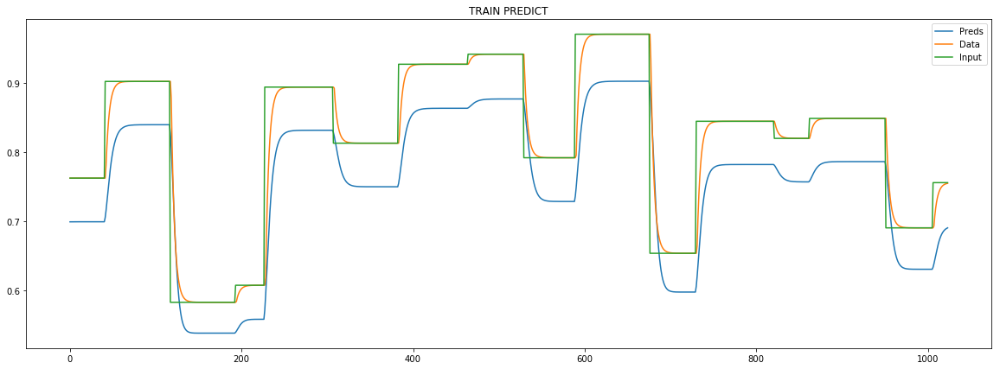

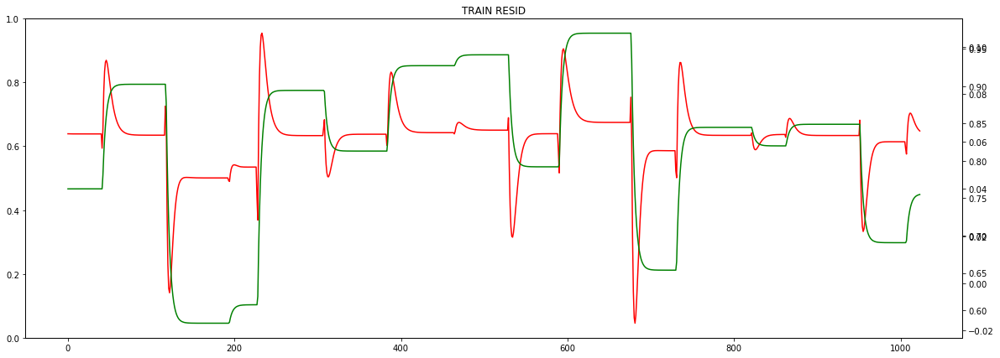

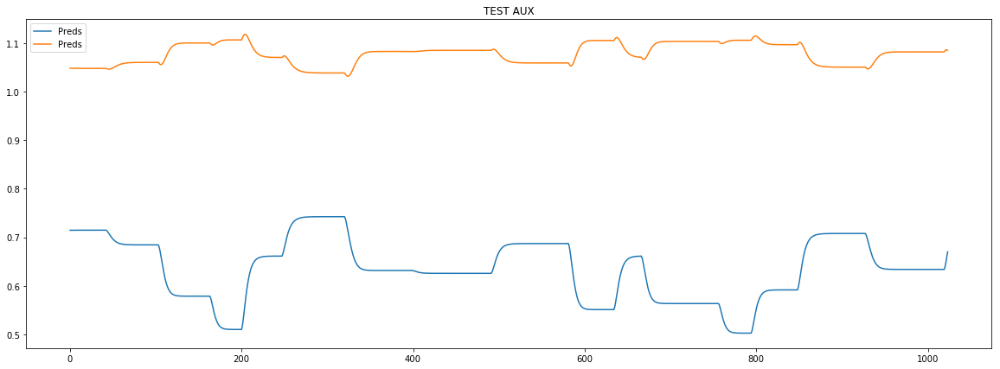

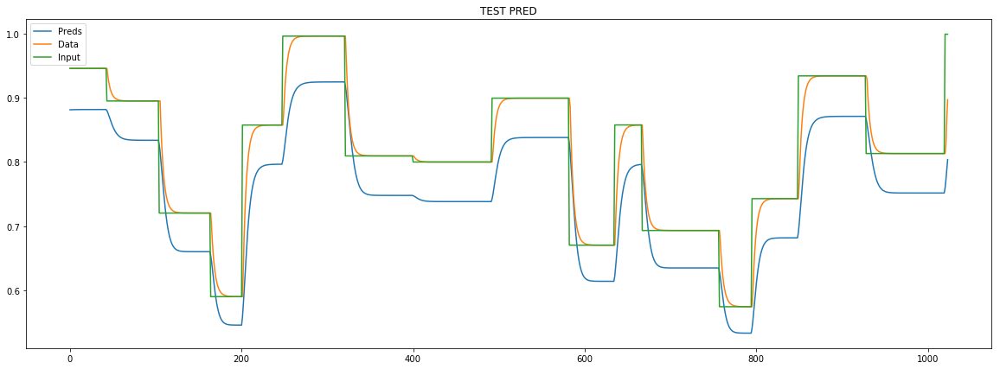

loss rate [0.018545282371355443]
Epoch [26] 
     train_loss[183.79917059953397] 
     eval_train[124.59817073436885] 
     eval_test[133.05488725142044]



aux preds: 0.6349909901618958 1.0737746953964233
main loss 0.0
aux loss 174.6811472085806
const loss 6.049332224405729
combined loss 180.73047943298633 


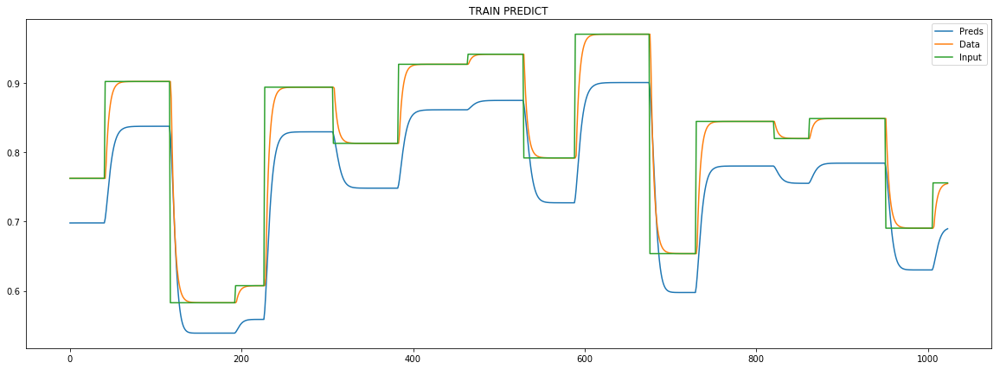

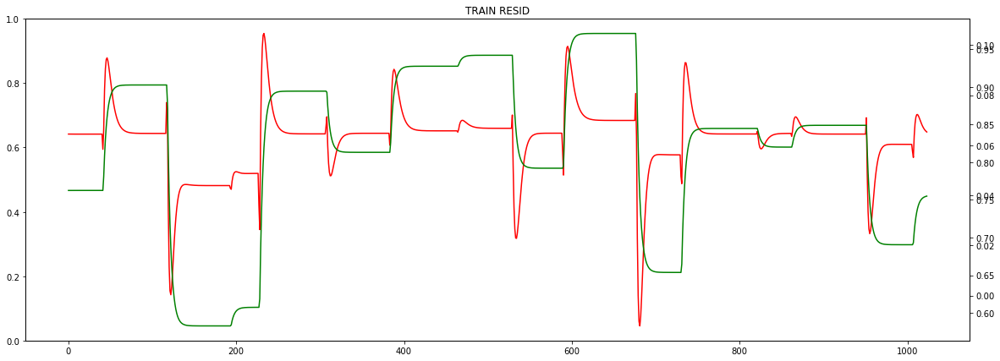

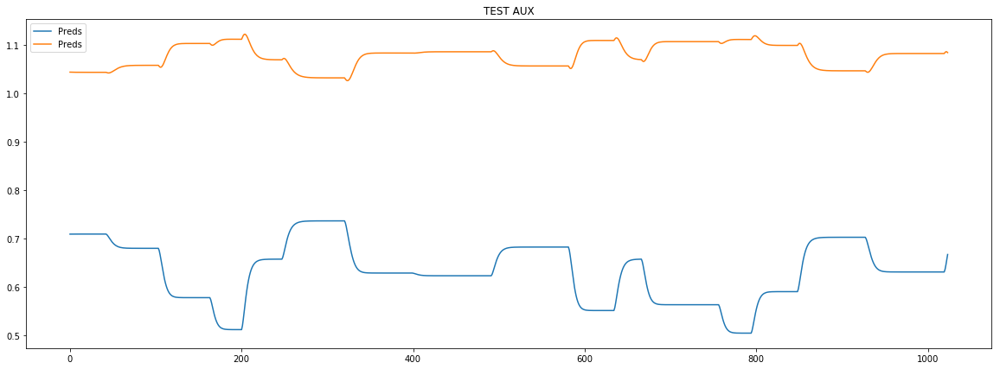

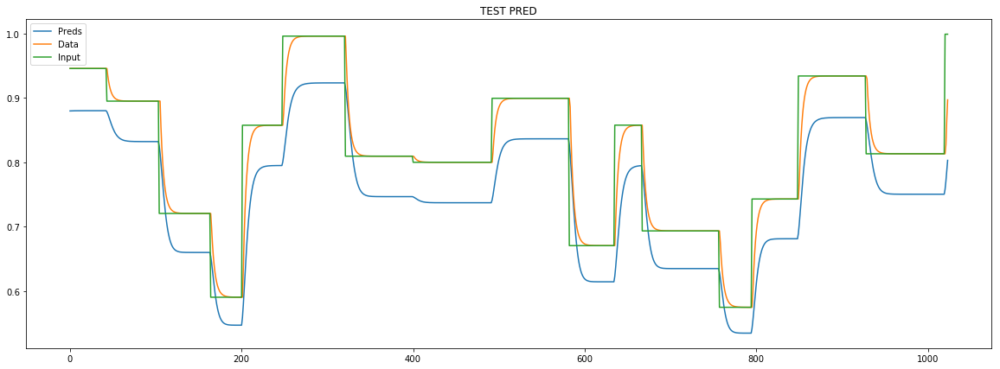

loss rate [0.014937756987699058]
Epoch [27] 
     train_loss[180.73047943298633] 
     eval_train[123.60454286061801] 
     eval_test[132.22513191266492]



aux preds: 0.6318181753158569 1.0736324787139893
main loss 0.0
aux loss 171.87628966111404
const loss 6.042973357897538
combined loss 177.9192630190116 


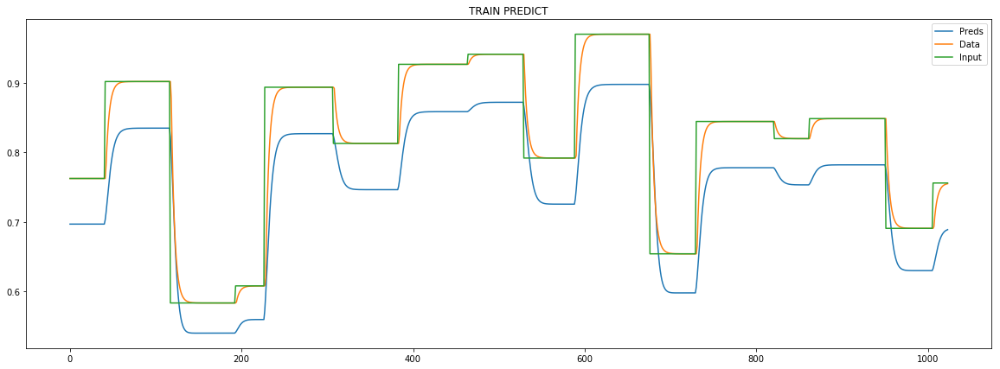

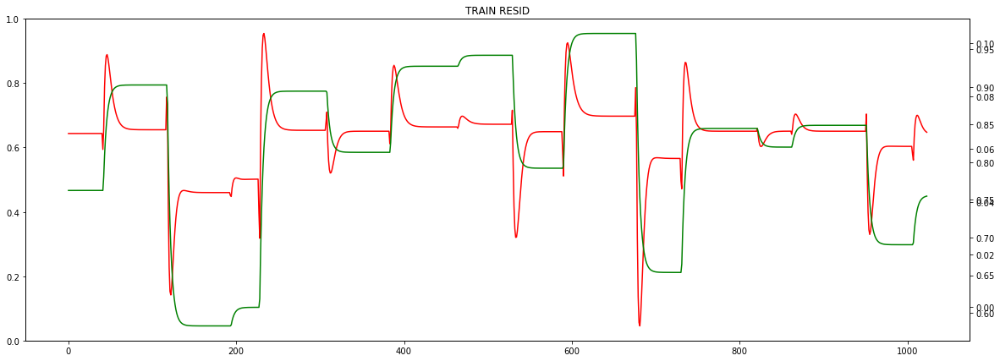

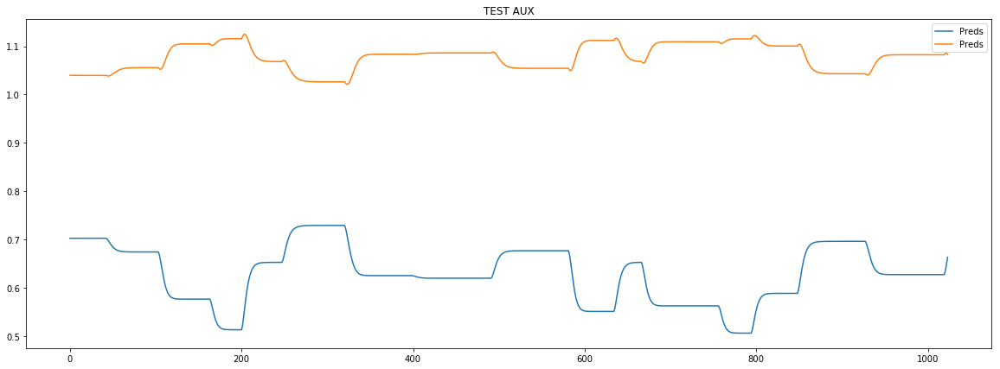

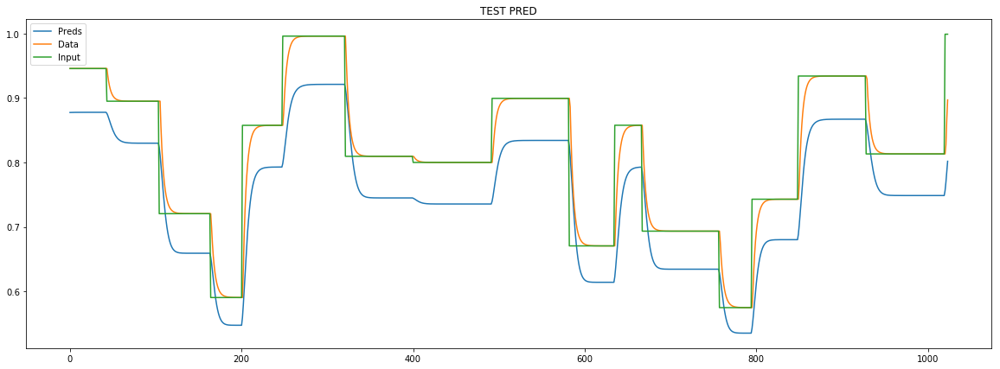

loss rate [0.011087415309345983]
Epoch [28] 
     train_loss[177.9192630190116] 
     eval_train[122.84287091401906] 
     eval_test[131.66343248974192]



aux preds: 0.6276955008506775 1.0723060369491577
main loss 0.0
aux loss 166.7786123569195
const loss 5.81543952685136
combined loss 172.59405188377085 


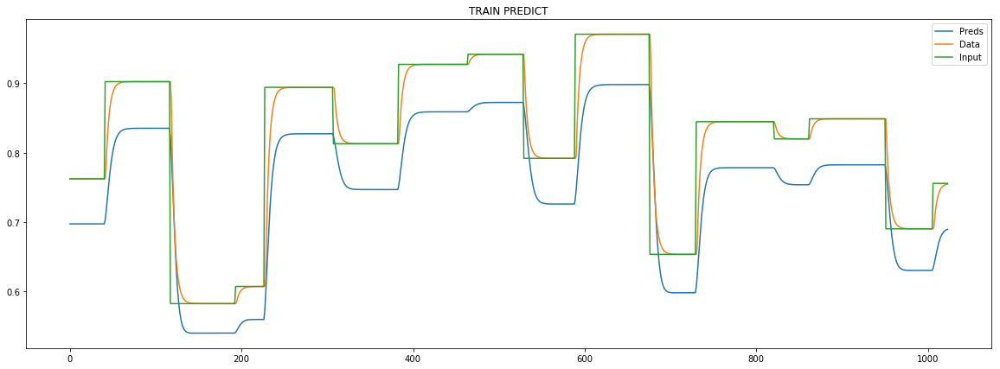

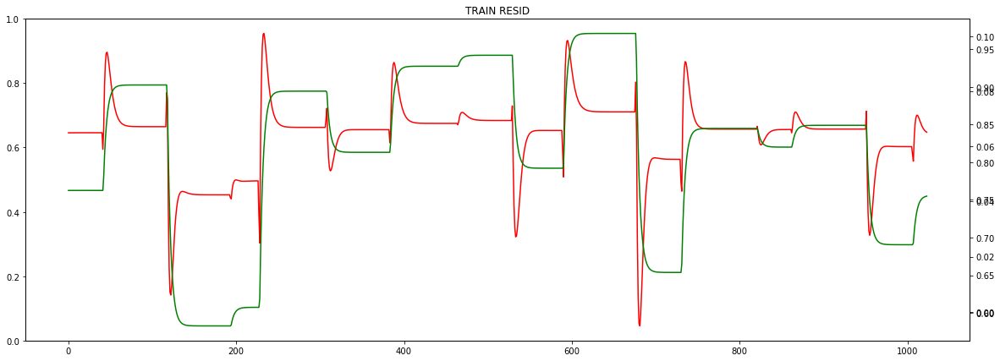

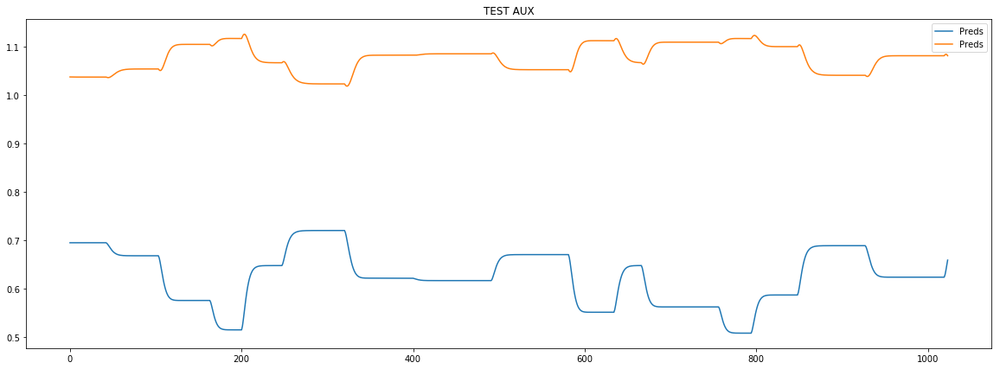

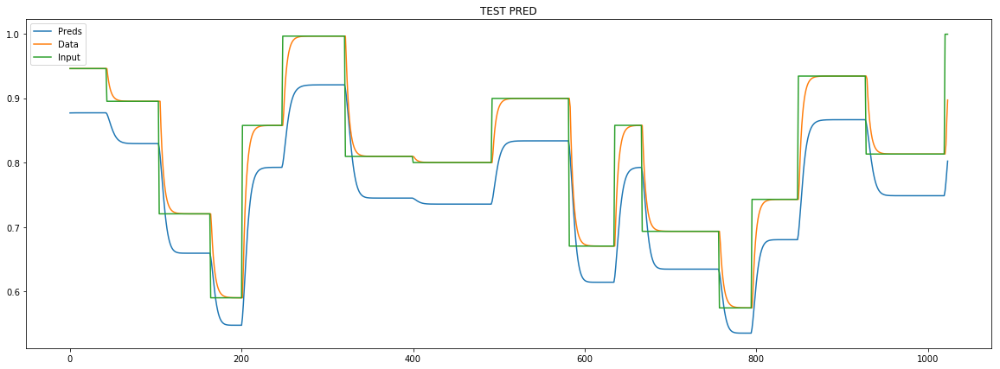

loss rate [0.014012471112557101]
Epoch [29] 
     train_loss[172.59405188377085] 
     eval_train[121.57638260034415] 
     eval_test[130.46043100140312]



aux preds: 0.6235910058021545 1.0709775686264038
main loss 0.0
aux loss 161.09377310826227
const loss 5.4199707095439615
combined loss 166.51374381780624 


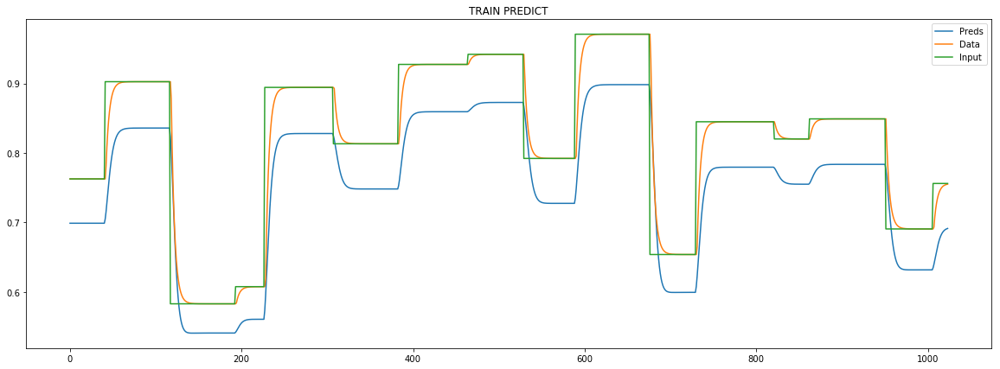

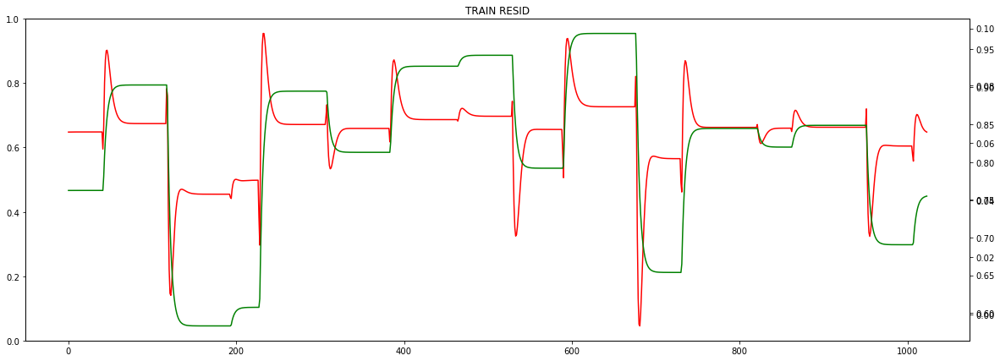

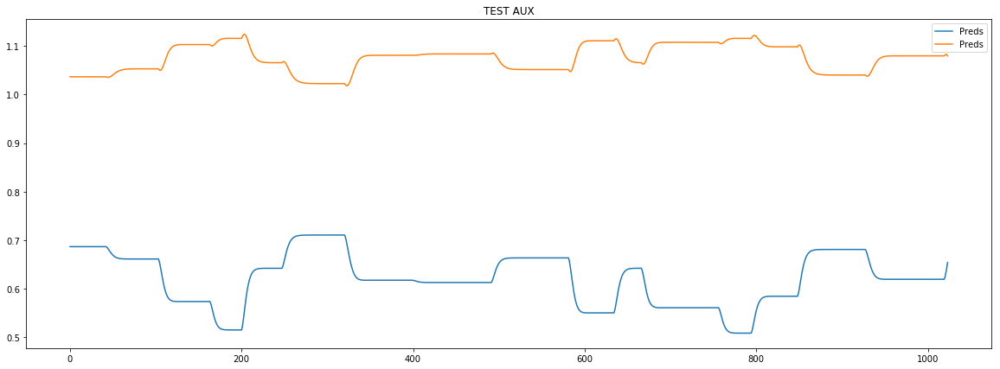

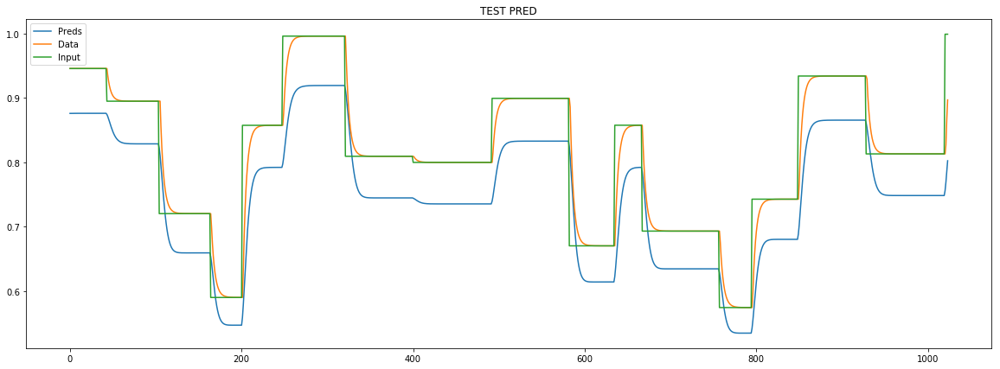

loss rate [0.02049798159645888]
Epoch [30] 
     train_loss[166.51374381780624] 
     eval_train[119.77155761535352] 
     eval_test[128.75521231781352]



aux preds: 0.6200944185256958 1.0780975818634033
main loss 0.0
aux loss 148.7805155974168
const loss 4.622010872914241
combined loss 153.40252647033105 


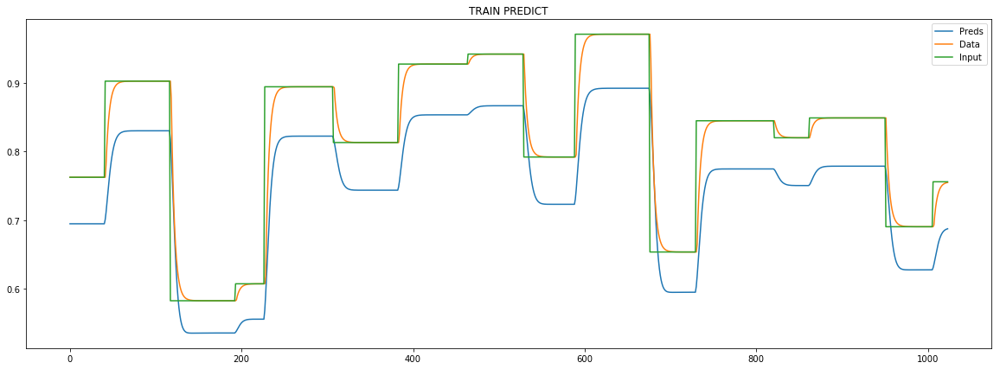

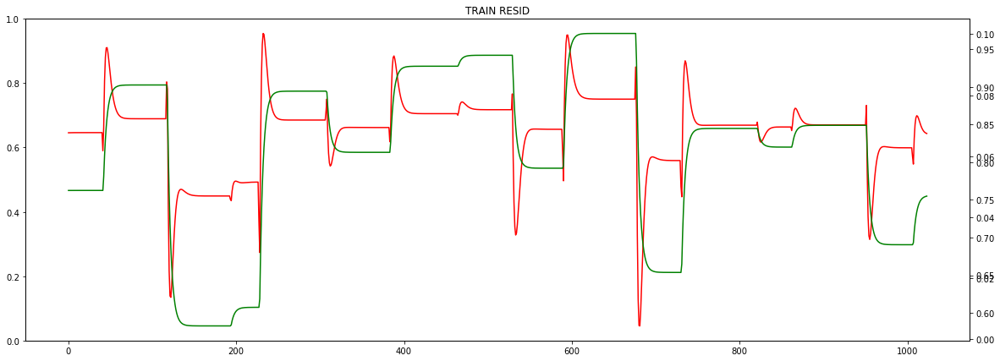

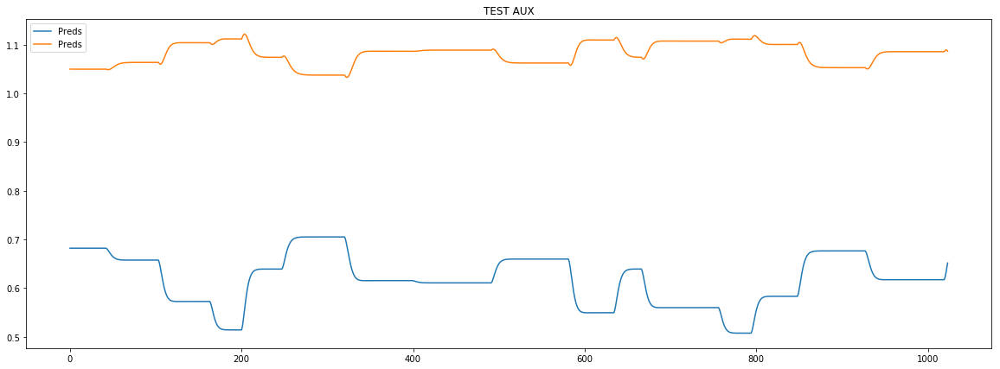

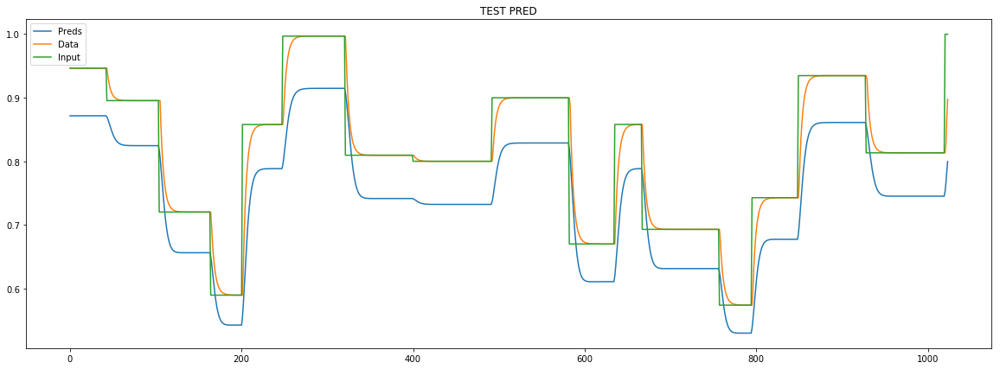

loss rate [0.03892873329737323]
Epoch [31] 
     train_loss[153.40252647033105] 
     eval_train[116.70107449018039] 
     eval_test[125.22088283842261]



aux preds: 0.6208362579345703 1.0833492279052734
main loss 0.0
aux loss 145.27252035874588
const loss 4.152147847872514
combined loss 149.4246682066184 


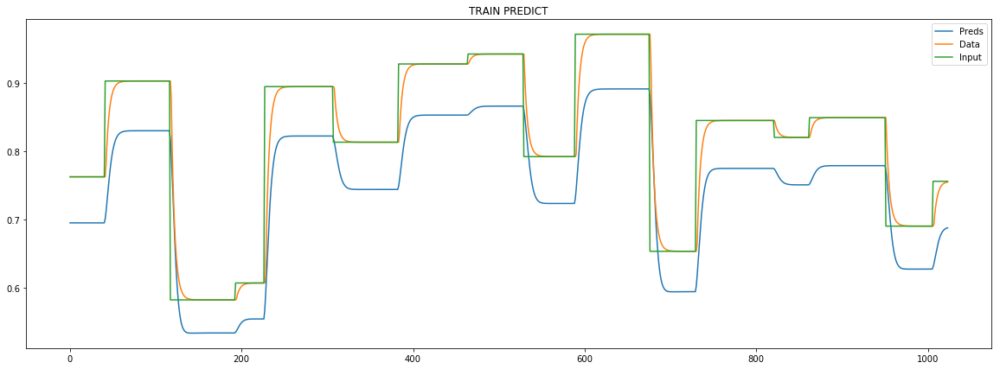

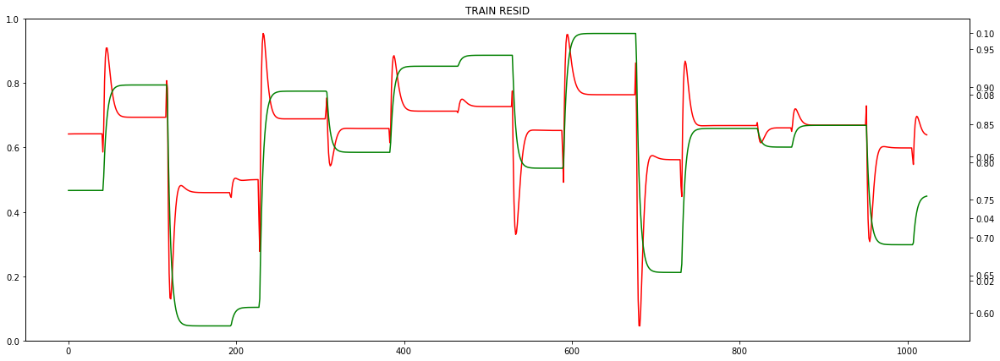

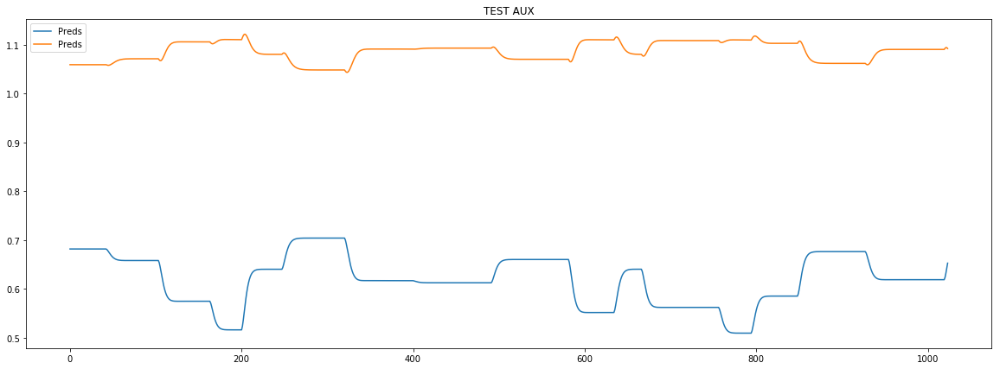

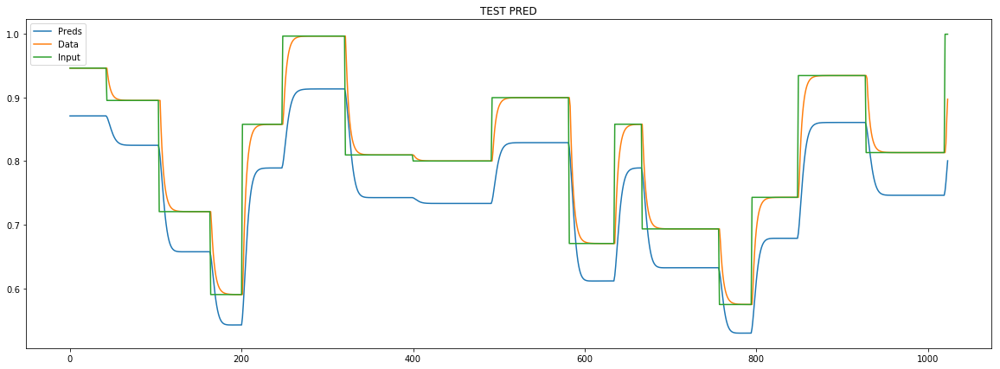

loss rate [0.038995083301840205]
Epoch [32] 
     train_loss[149.4246682066184] 
     eval_train[115.40202088310168] 
     eval_test[123.14846393195066]



aux preds: 0.6174132823944092 1.0688308477401733
main loss 0.0
aux loss 163.07926500760593
const loss 4.237969380158645
combined loss 167.31723438776456 


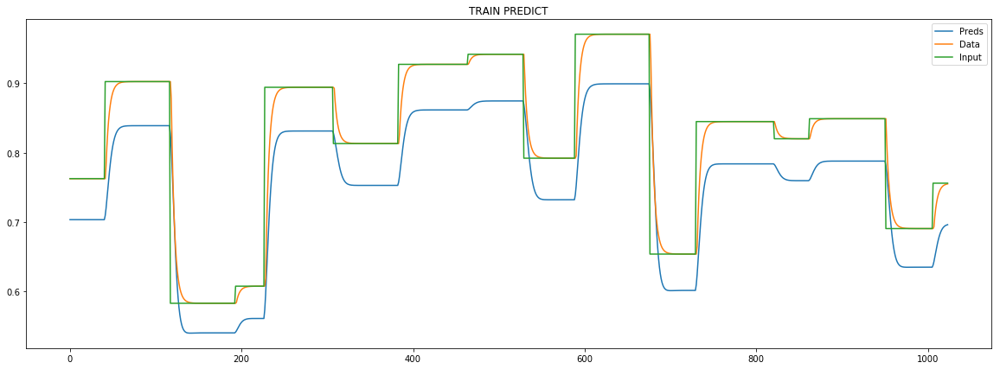

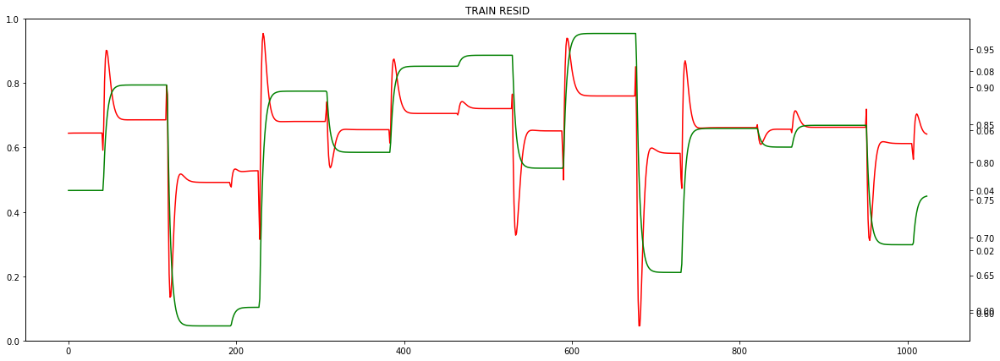

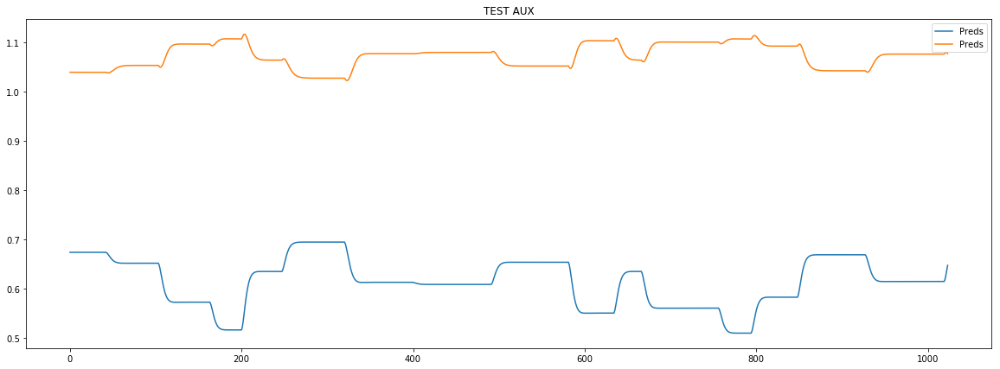

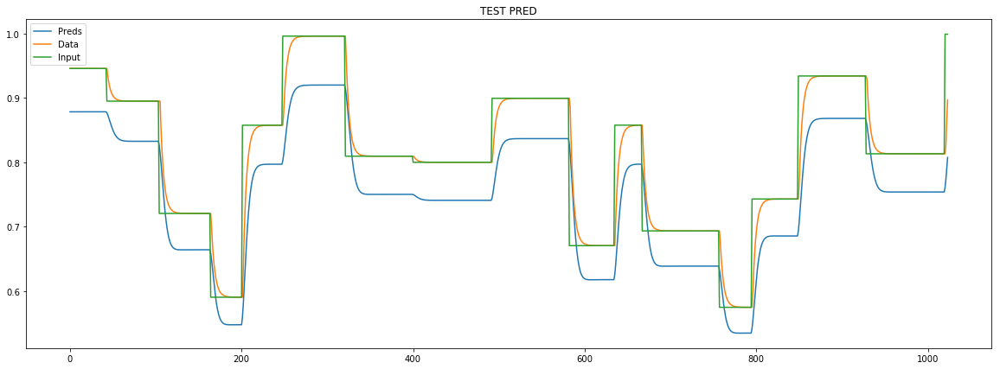

loss rate [0.016315060475628695]
Epoch [33] 
     train_loss[167.31723438776456] 
     eval_train[115.38554393328153] 
     eval_test[123.65724969993938]



aux preds: 0.6182038187980652 1.0713965892791748
main loss 0.0
aux loss 157.6999592414269
const loss 4.196531871190438
combined loss 161.89649111261735 


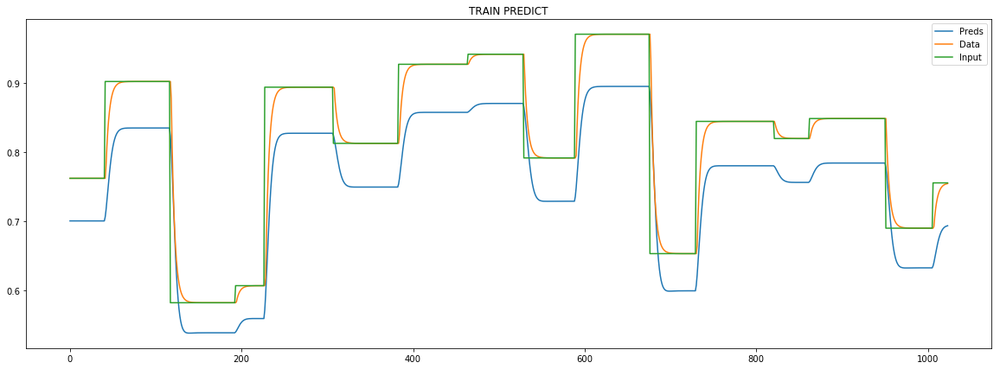

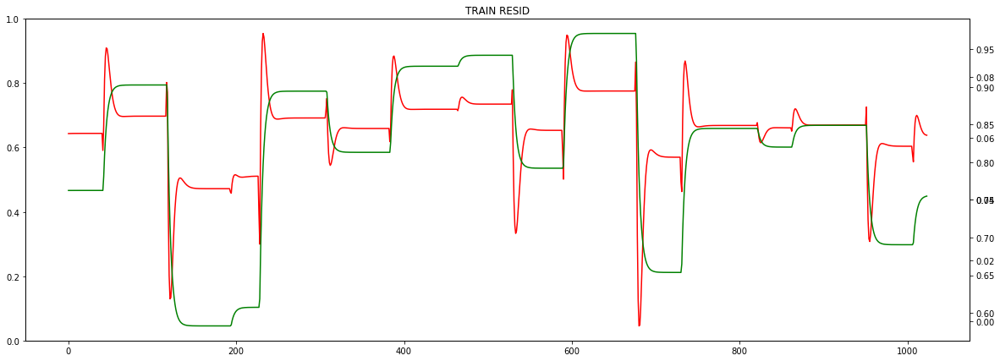

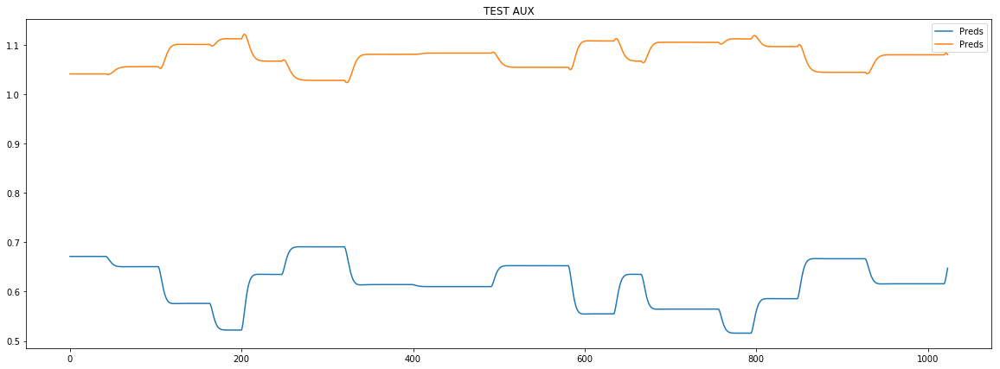

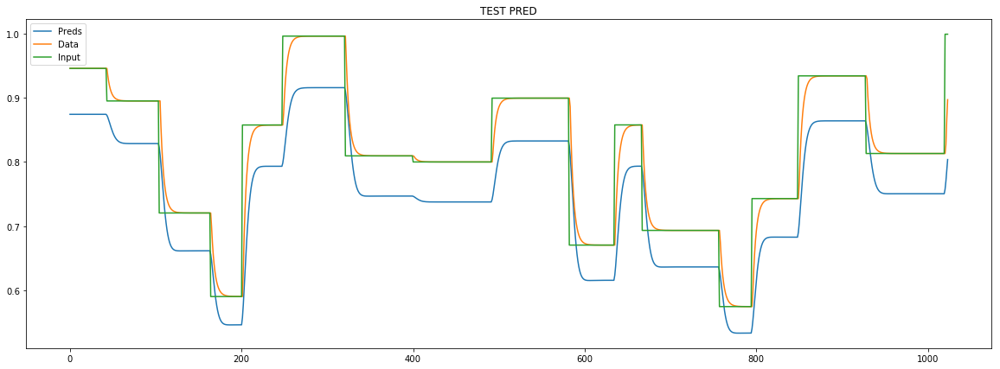

loss rate [0.004838408457507382]
Epoch [34] 
     train_loss[161.89649111261735] 
     eval_train[114.86410544698055] 
     eval_test[123.408859946511]



aux preds: 0.6124562621116638 1.0960371494293213
main loss 0.0
aux loss 129.8450002670288
const loss 3.383318300430591
combined loss 133.2283185674594 


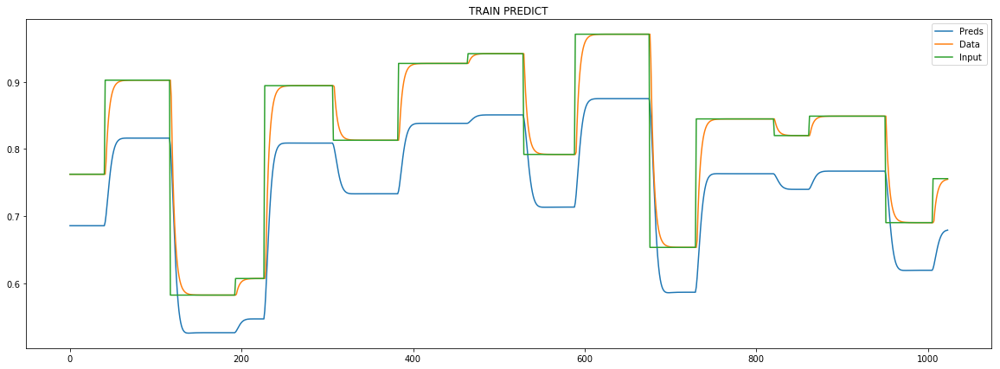

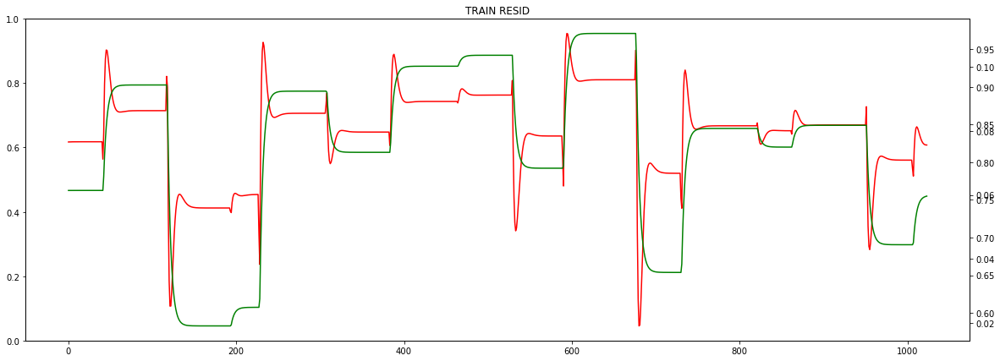

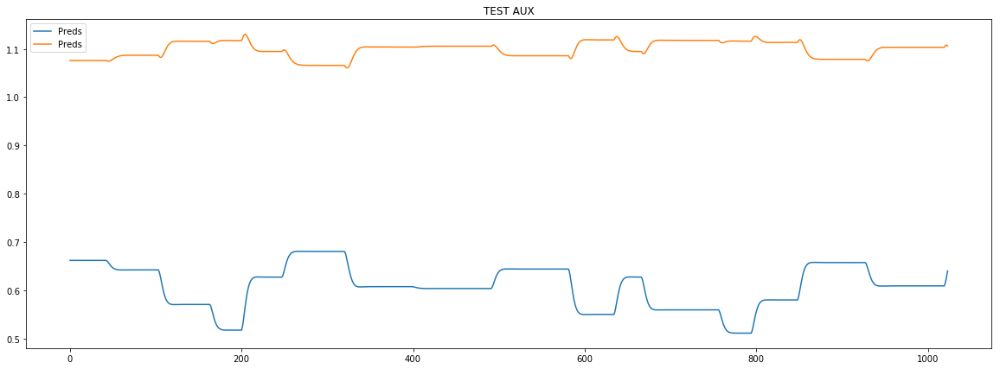

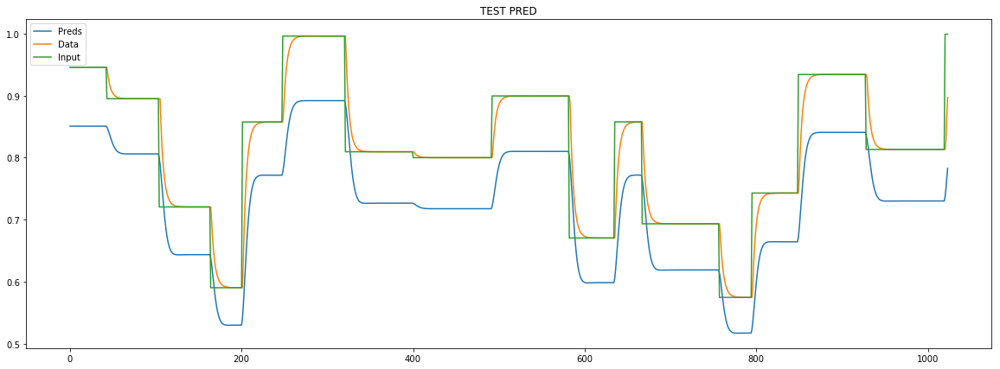

loss rate [-0.013144371353117634]
loss stopped: loss drop= [-0.013144371353117634]

LR UPDATED: 0.0002

Epoch [35] 
     train_loss[133.2283185674594] 
     eval_train[116.19760887439435] 
     eval_test[125.02693713795055]



aux preds: 0.6078228950500488 1.1031594276428223
main loss 0.0
aux loss 109.56126169057993
const loss 2.8115077316761017
combined loss 112.37276942225603 


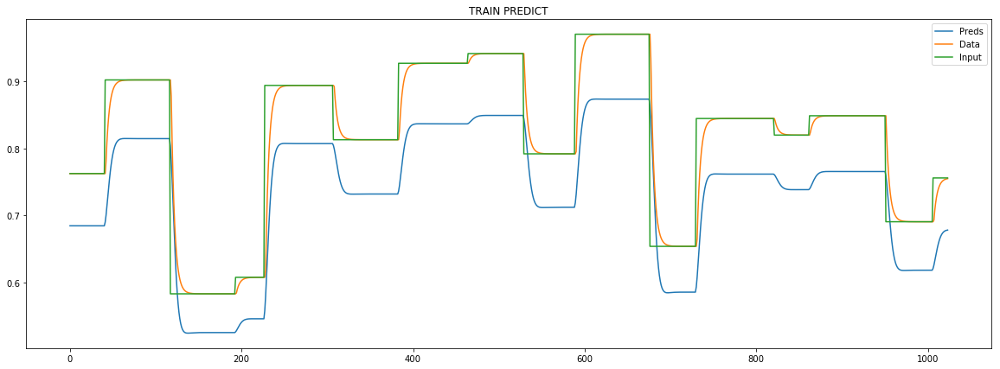

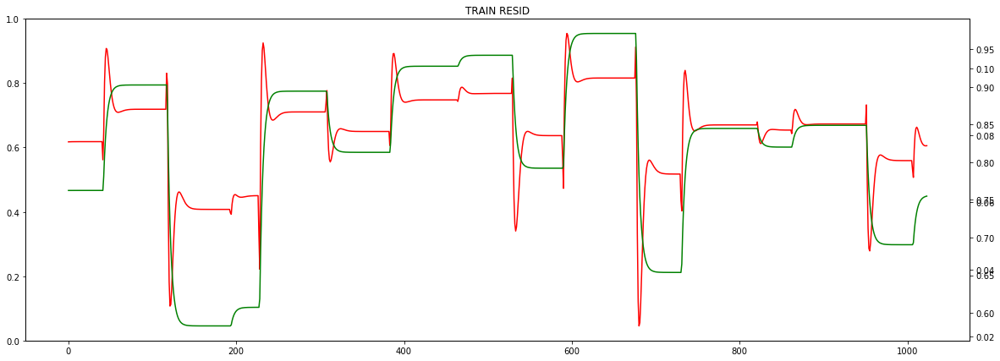

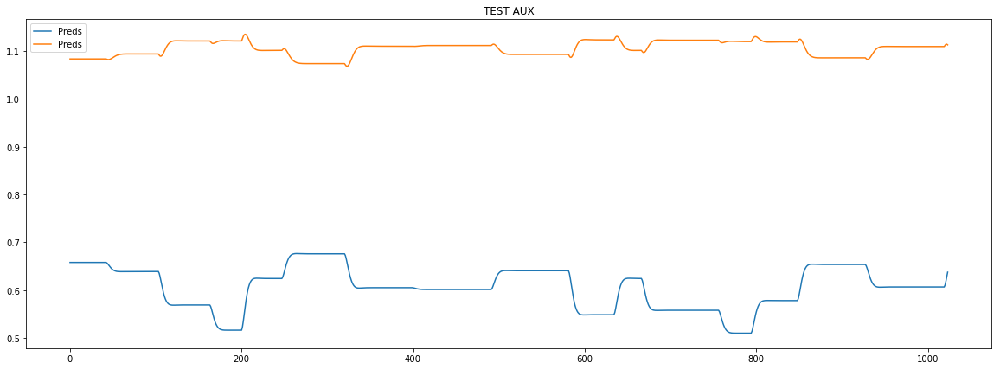

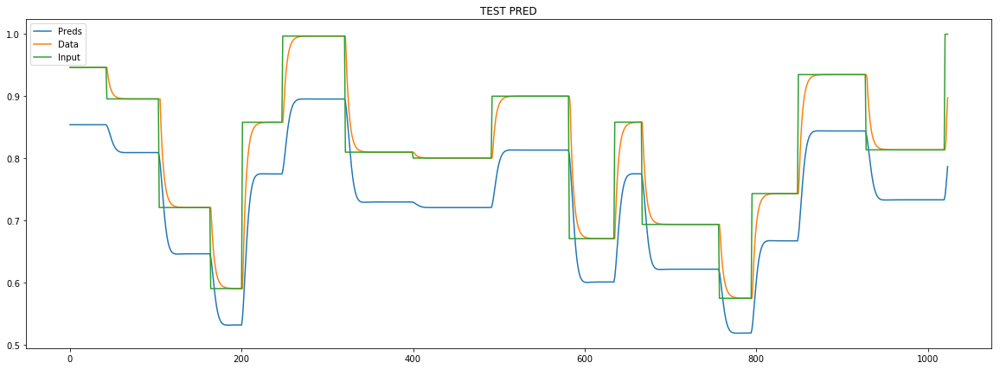

loss rate [0.05349451023706864]
Epoch [36] 
     train_loss[112.37276942225603] 
     eval_train[110.0545938519331] 
     eval_test[117.39603716135025]



aux preds: 0.605071485042572 1.1063395738601685
main loss 0.0
aux loss 109.07090700589694
const loss 2.6642733239210568
combined loss 111.735180329818 


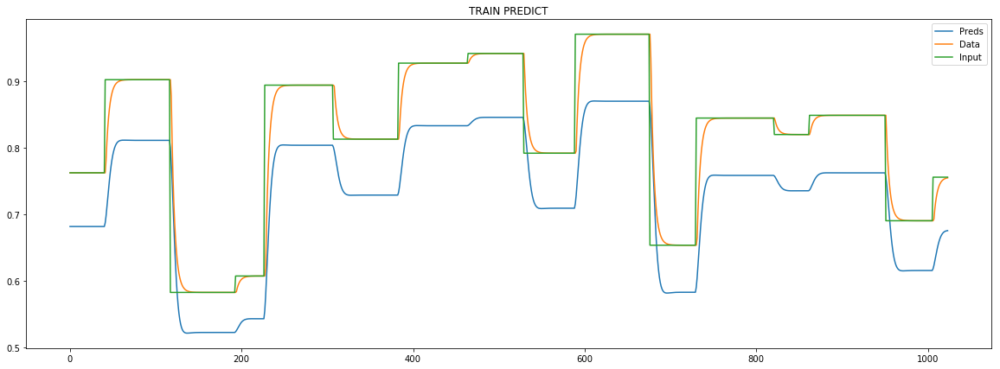

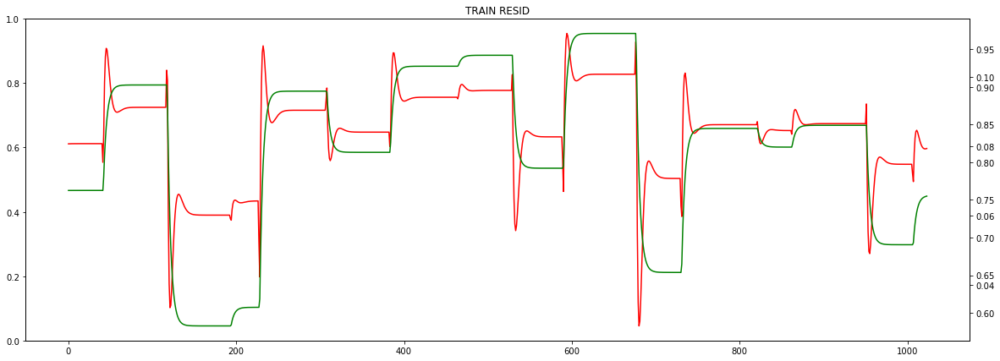

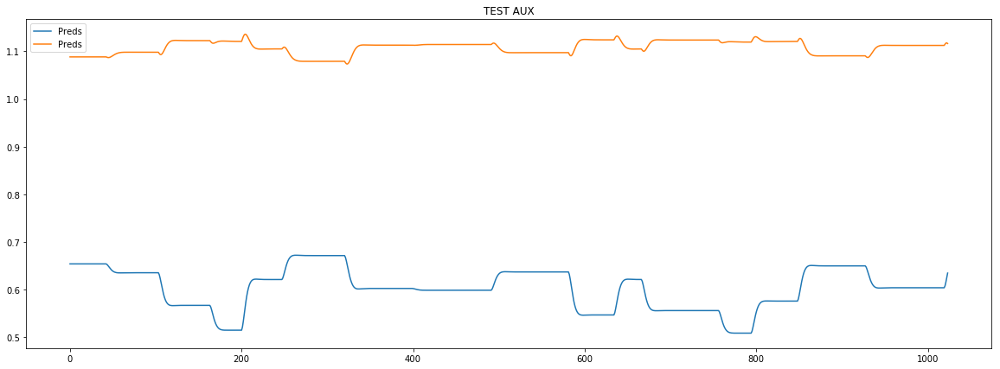

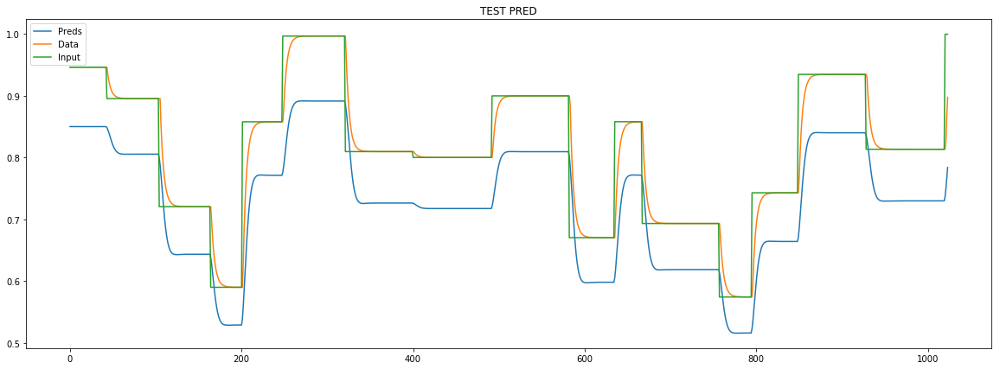

loss rate [0.03971592866952378]
Epoch [37] 
     train_loss[111.735180329818] 
     eval_train[109.6623301758216] 
     eval_test[117.10082773728804]



aux preds: 0.6040729880332947 1.11002779006958
main loss 0.0
aux loss 108.19087087191068
const loss 2.5462424204899716
combined loss 110.73711329240065 


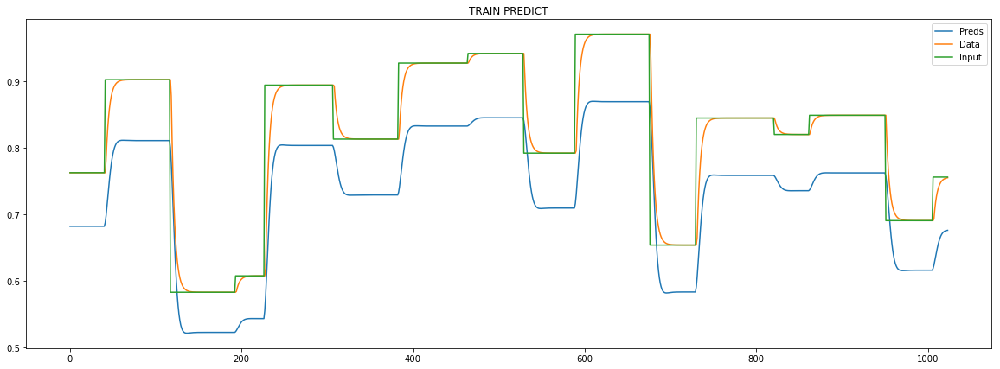

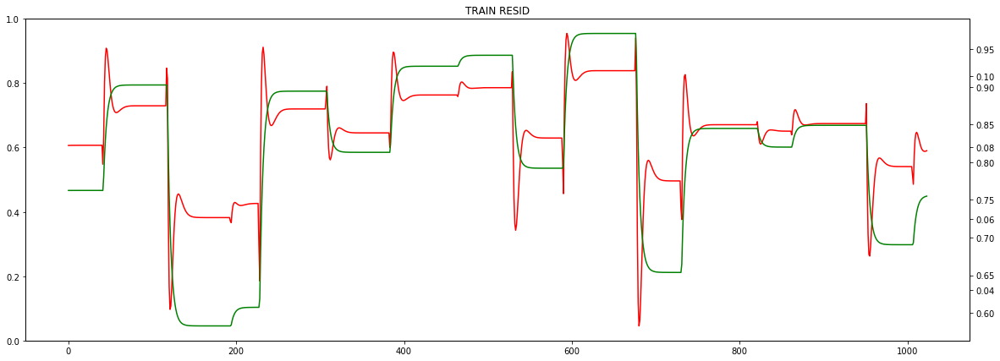

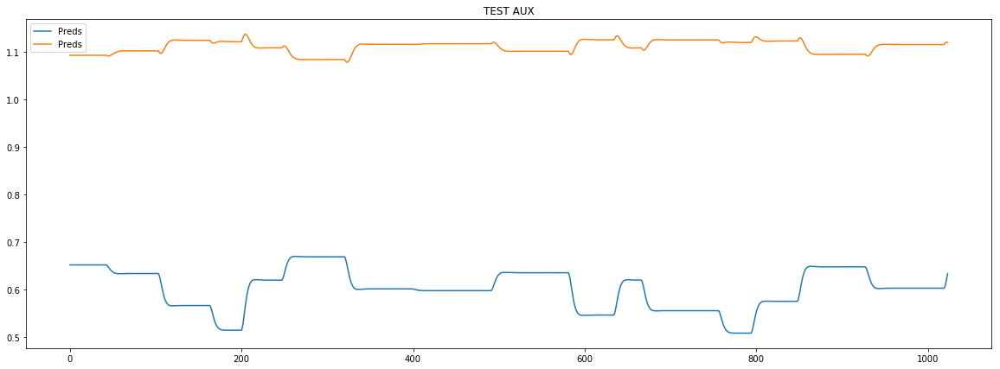

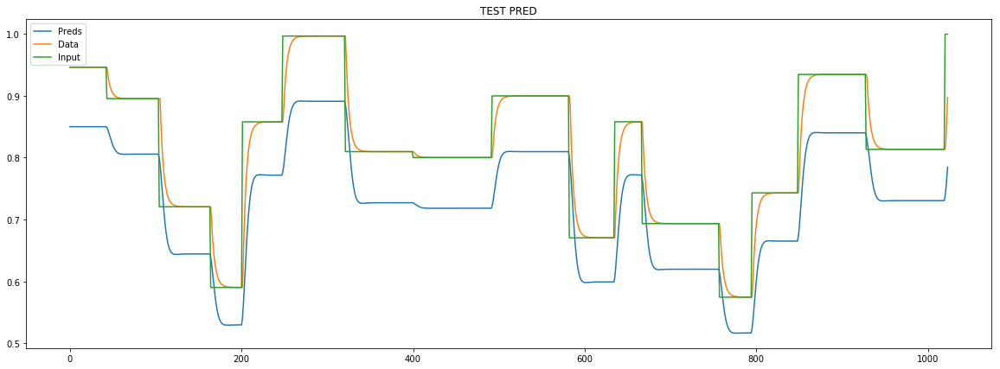

loss rate [0.035945213481952454]
Epoch [38] 
     train_loss[110.73711329240065] 
     eval_train[108.65725433138701] 
     eval_test[115.53354740684682]



aux preds: 0.6023324131965637 1.112172245979309
main loss 0.0
aux loss 107.9376934491671
const loss 2.4537110374524045
combined loss 110.3914044866195 


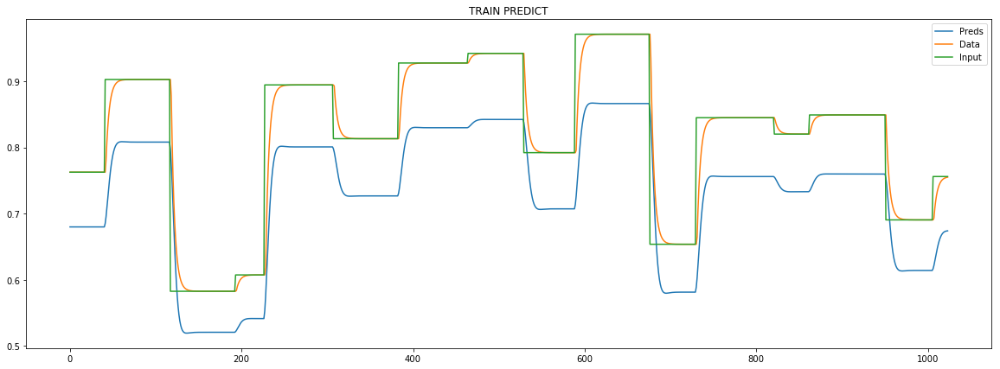

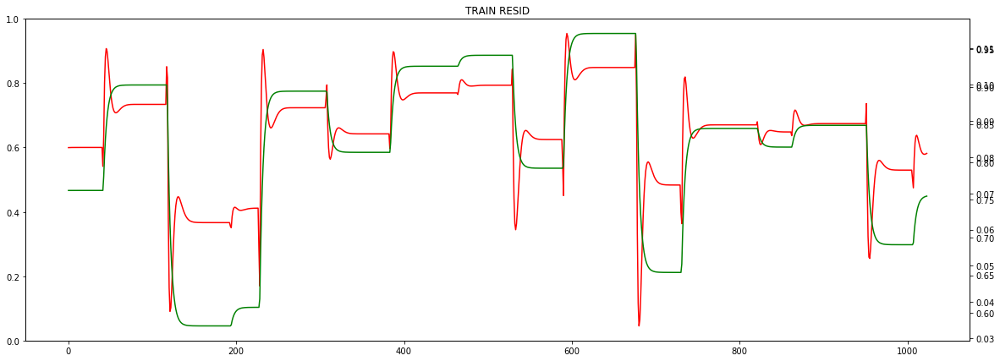

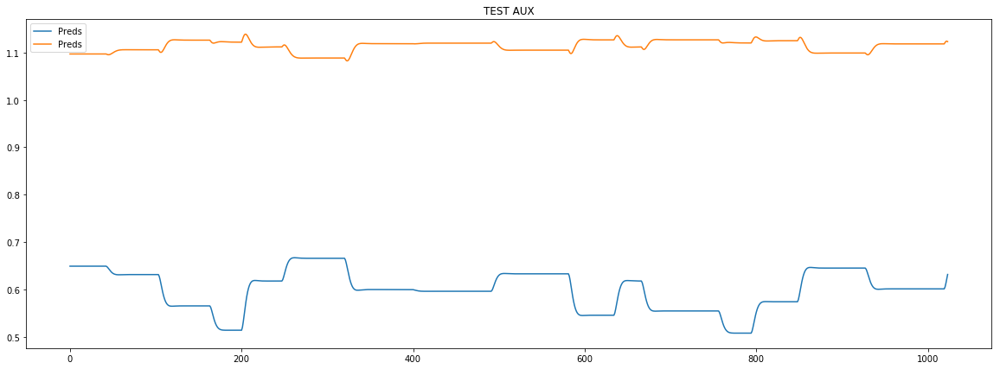

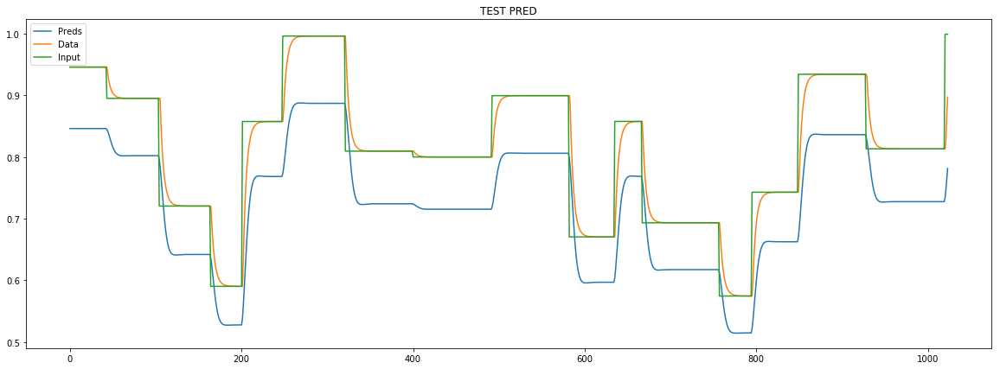

loss rate [0.010653711731957838]
Epoch [39] 
     train_loss[110.3914044866195] 
     eval_train[108.31206651834341] 
     eval_test[115.43376306512138]



aux preds: 0.6023800373077393 1.1130872964859009
main loss 0.0
aux loss 107.57781468904935
const loss 2.3830959590581746
combined loss 109.96091064810753 


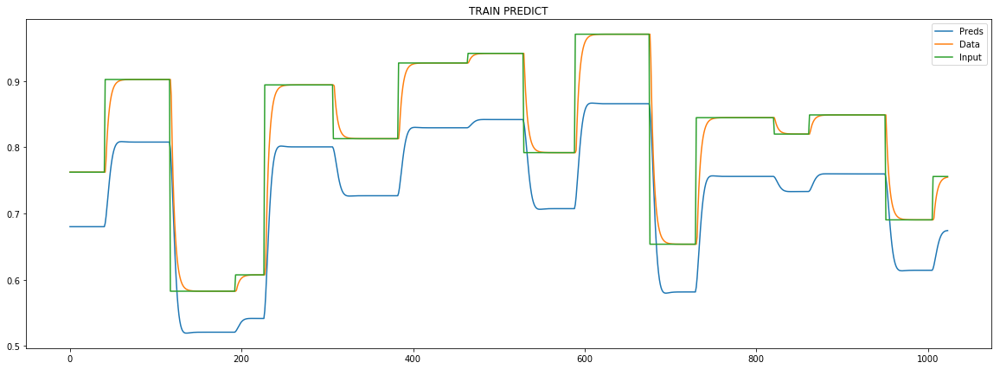

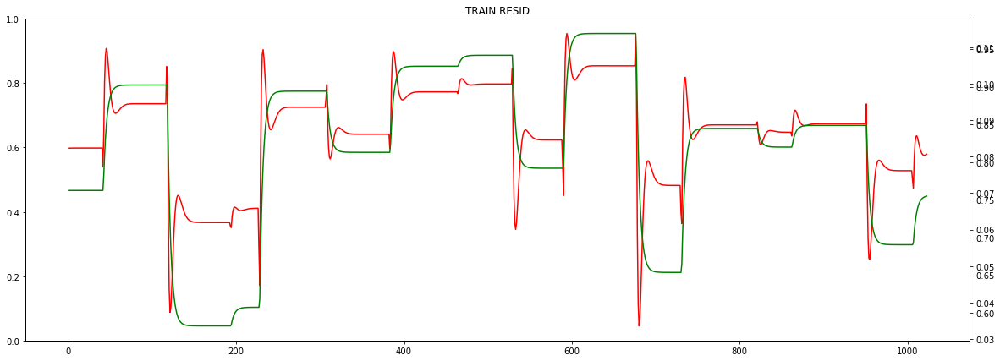

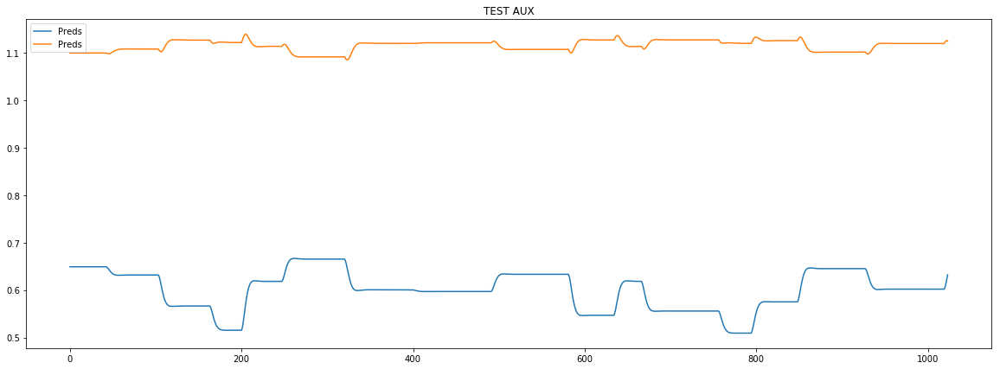

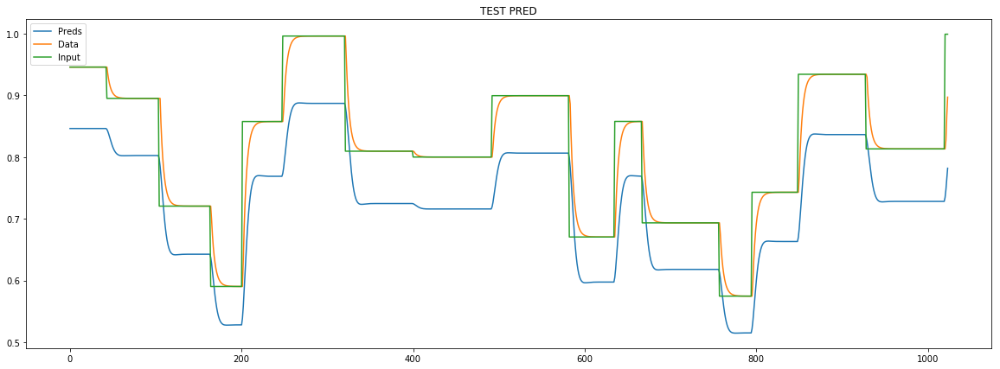

loss rate [0.011810938222314604]
Epoch [40] 
     train_loss[109.96091064810753] 
     eval_train[107.74053851228494] 
     eval_test[114.65237564390357]



aux preds: 0.601492166519165 1.1142194271087646
main loss 0.0
aux loss 107.32815001561092
const loss 2.3014182310837965
combined loss 109.62956824669472 


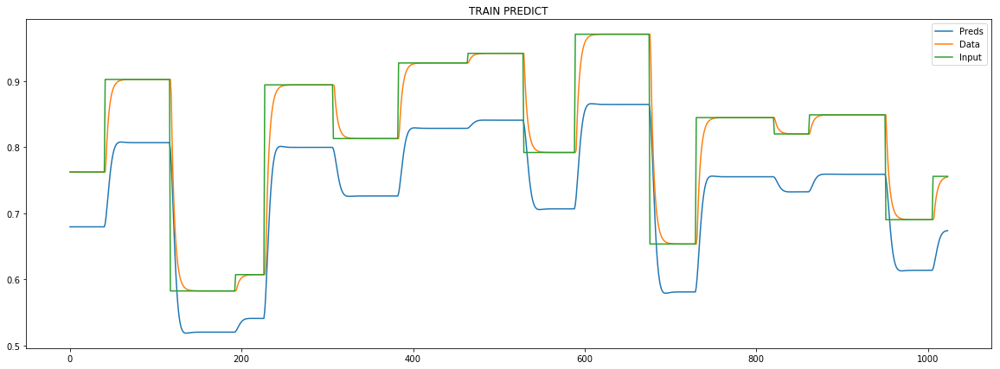

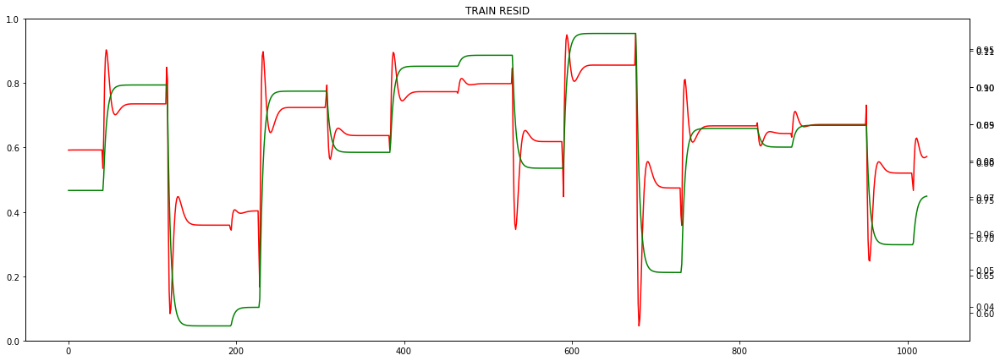

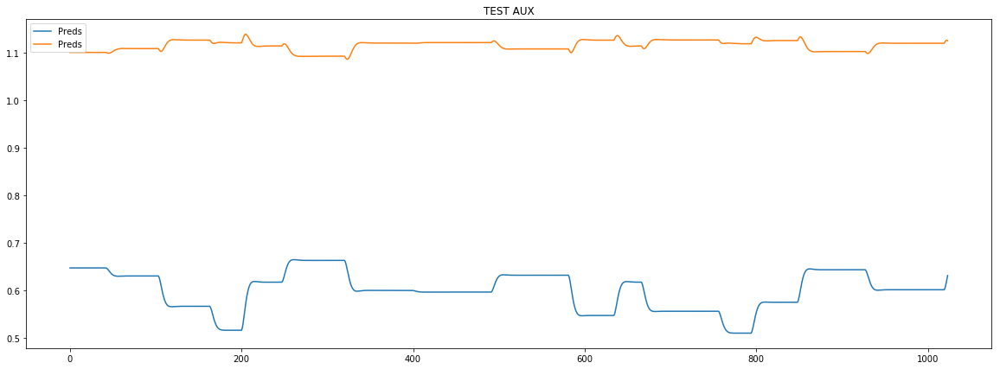

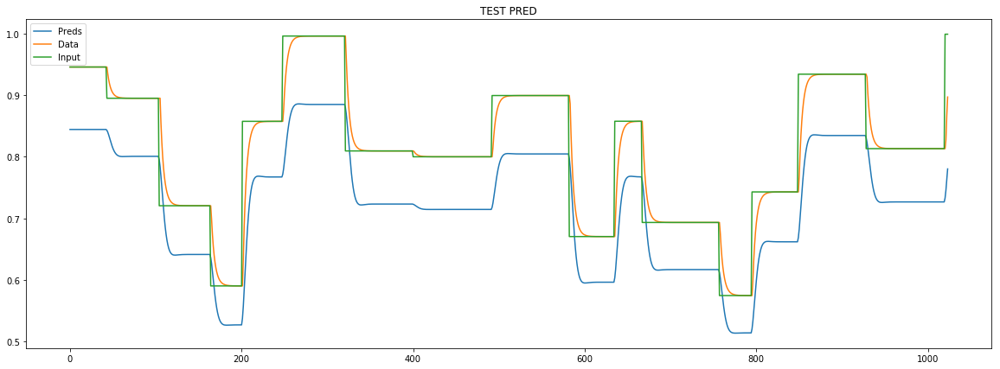

loss rate [0.005245219759313913]
Epoch [41] 
     train_loss[109.62956824669472] 
     eval_train[107.57836415446721] 
     eval_test[114.60227830301632]



aux preds: 0.6028041243553162 1.1177470684051514
main loss 0.0
aux loss 106.46221857804518
const loss 2.2345840701690087
combined loss 108.69680264821419 


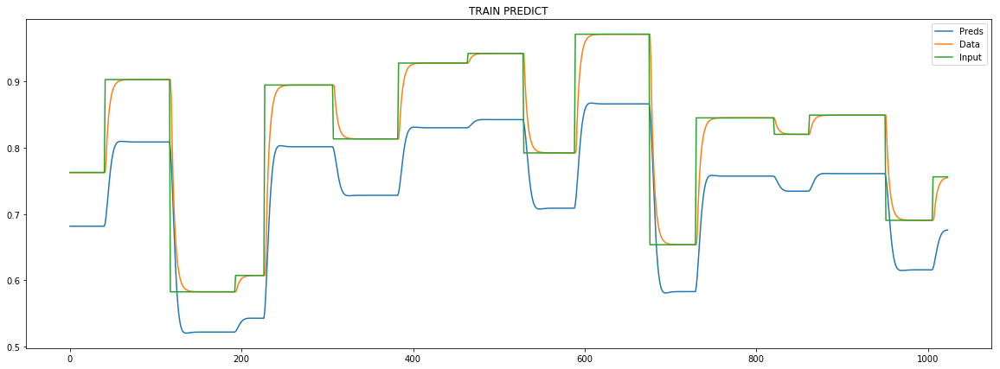

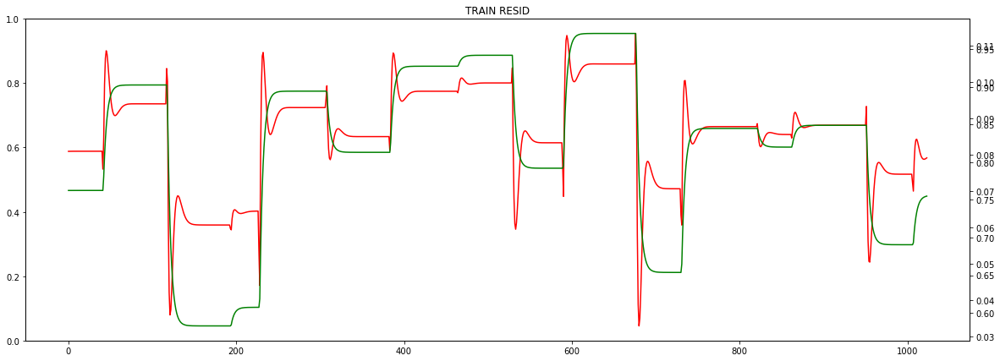

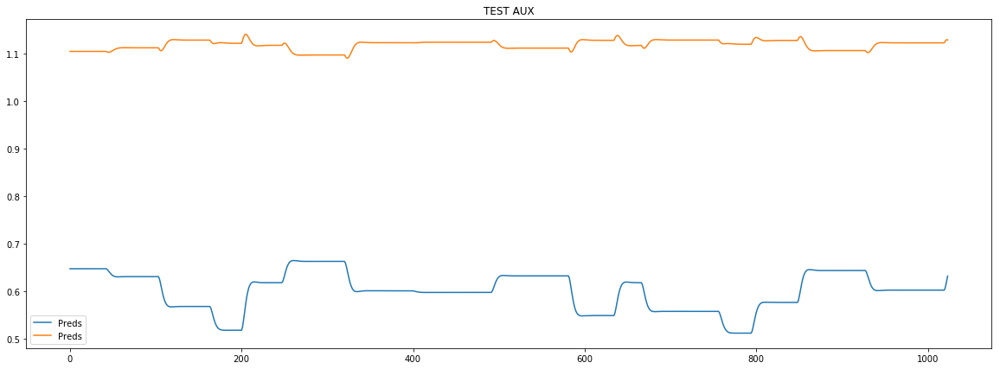

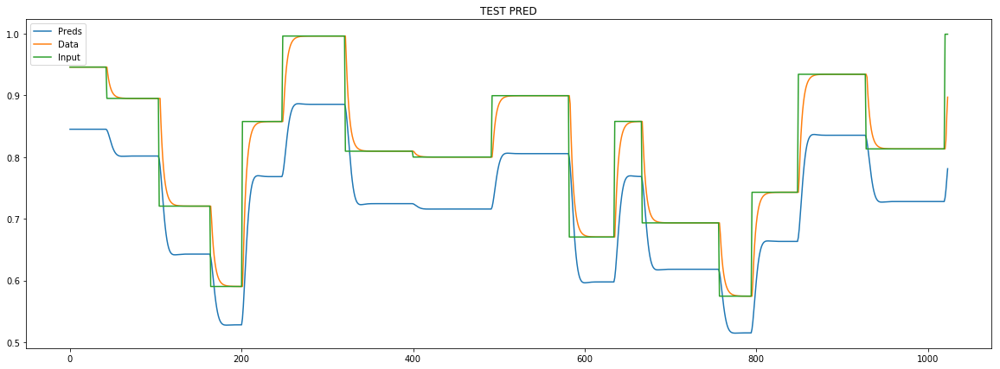

loss rate [0.01121552732236164]
Epoch [42] 
     train_loss[108.69680264821419] 
     eval_train[107.21027769492223] 
     eval_test[113.60751821778038]



aux preds: 0.6021919250488281 1.1190475225448608
main loss 0.0
aux loss 106.52442734058087
const loss 2.156016489634147
combined loss 108.68044383021501 


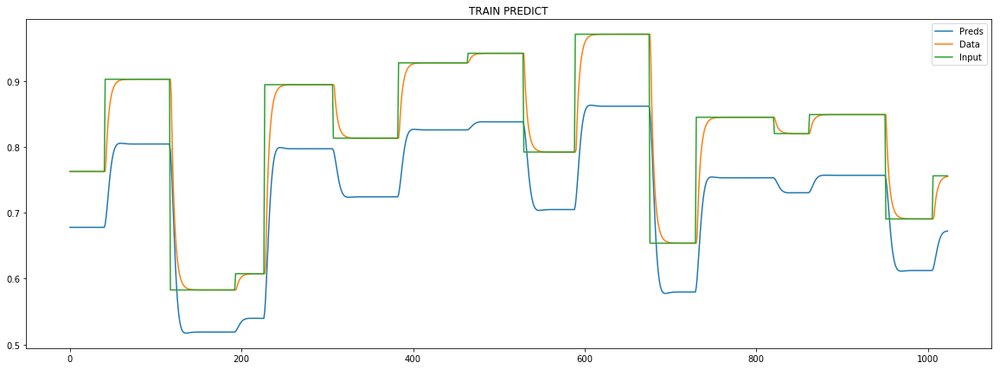

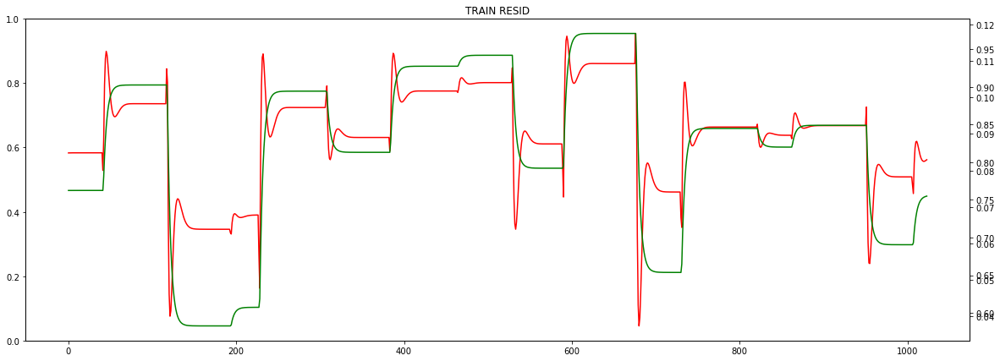

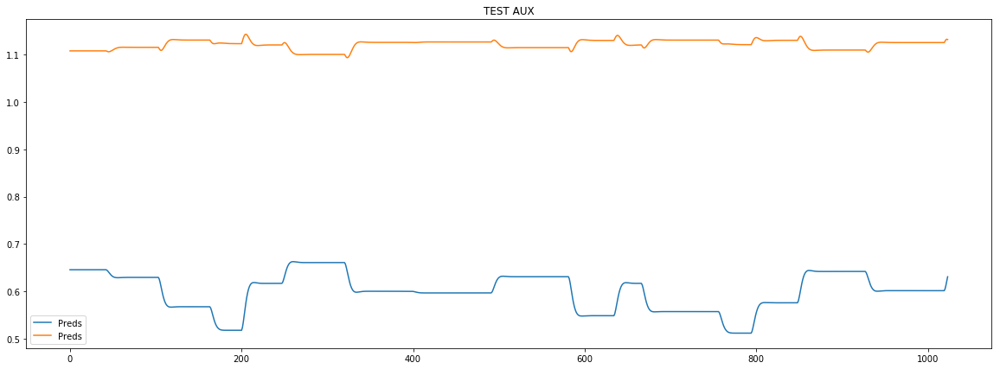

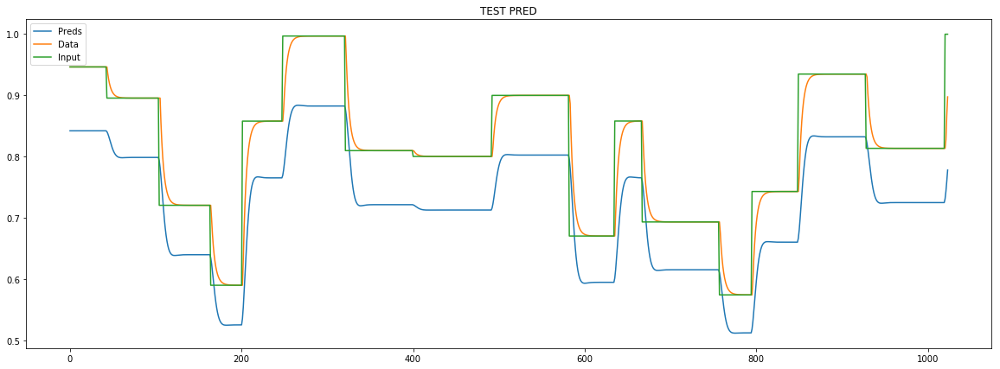

loss rate [0.00802280242727249]
Epoch [43] 
     train_loss[108.68044383021501] 
     eval_train[106.62079910819347] 
     eval_test[113.37048556587912]



aux preds: 0.6017151474952698 1.119592547416687
main loss 0.0
aux loss 106.46591678032509
const loss 2.088239011856226
combined loss 108.55415579218132 


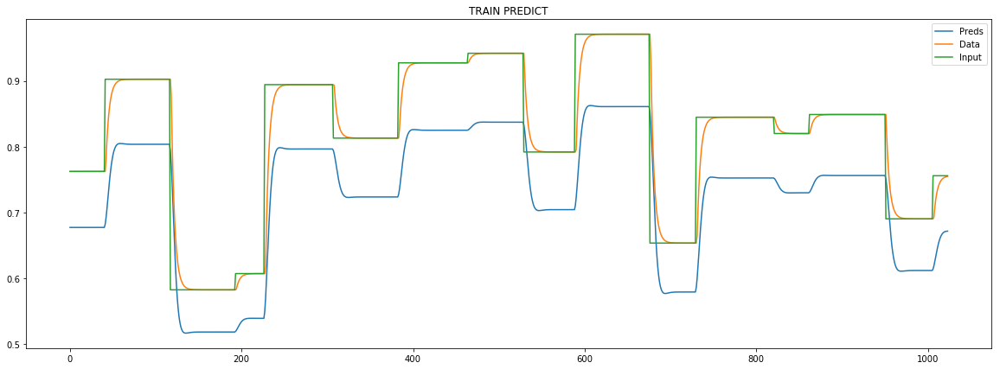

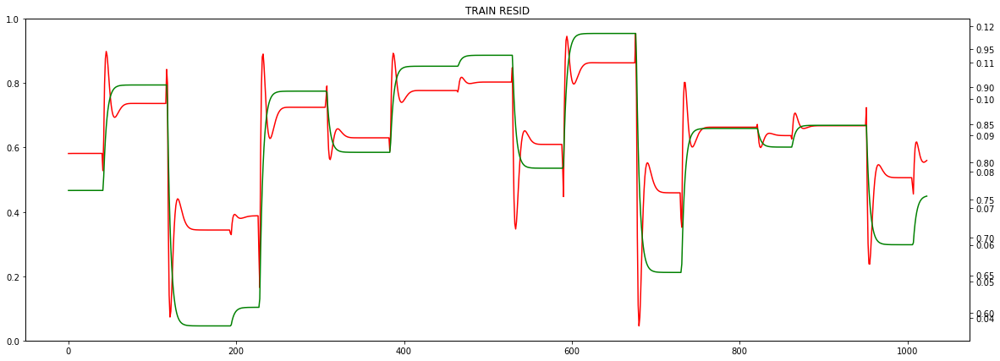

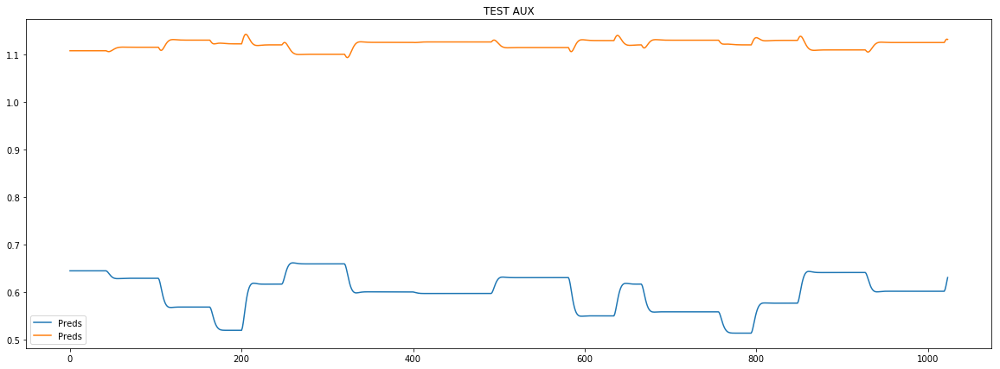

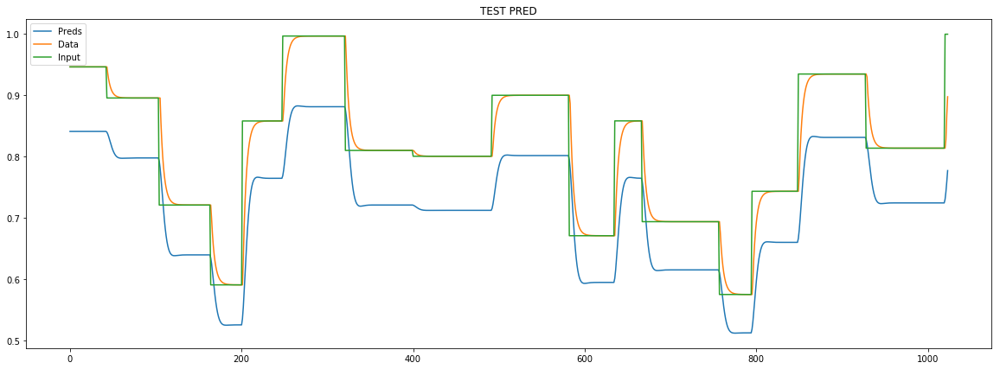

loss rate [0.004742670239375357]
Epoch [44] 
     train_loss[108.55415579218132] 
     eval_train[106.47476584636247] 
     eval_test[113.32009314948863]



aux preds: 0.6026333570480347 1.1196309328079224
main loss 0.0
aux loss 106.15469125600961
const loss 2.0313864808816176
combined loss 108.18607773689124 


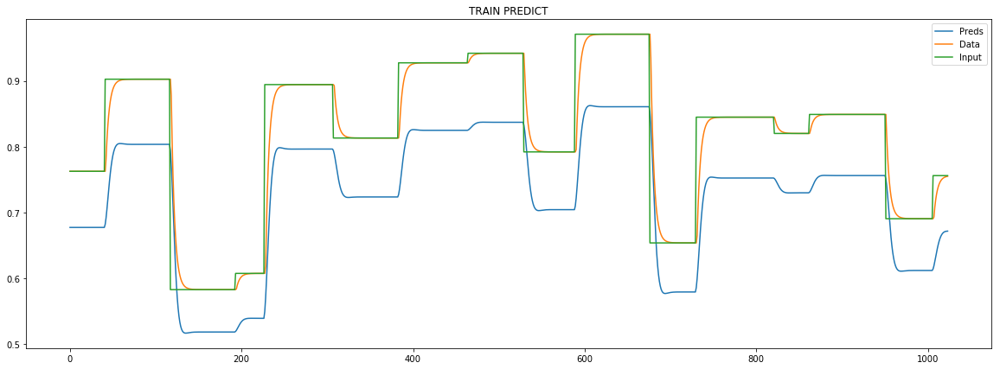

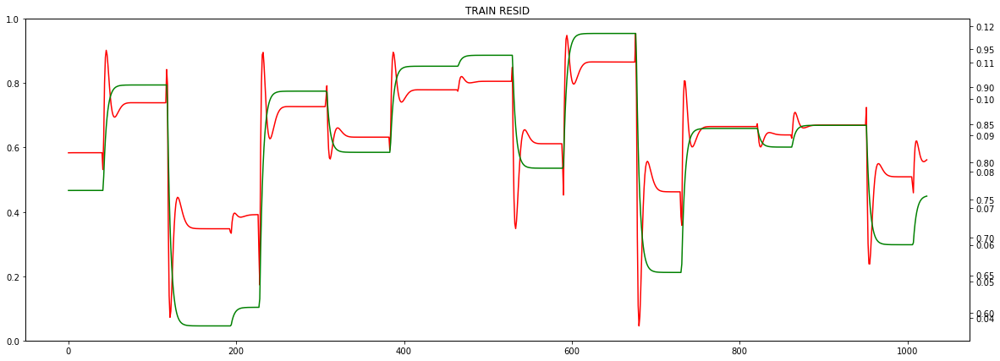

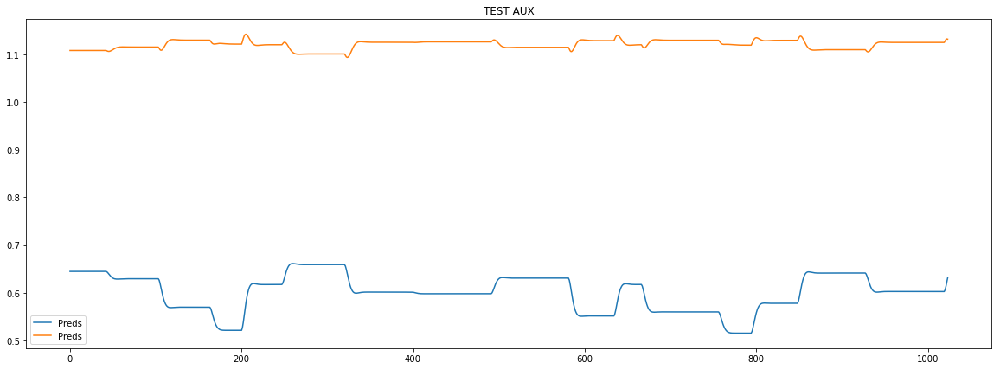

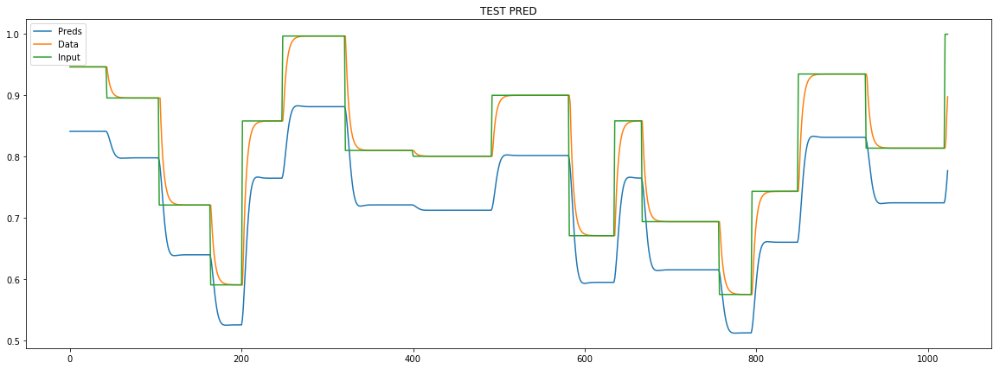

loss rate [0.004224030376593024]
Epoch [45] 
     train_loss[108.18607773689124] 
     eval_train[106.15979037835048] 
     eval_test[112.95355581153524]



aux preds: 0.6029780507087708 1.1196595430374146
main loss 0.0
aux loss 105.93182864555946
const loss 1.9679417552856298
combined loss 107.8997704008451 


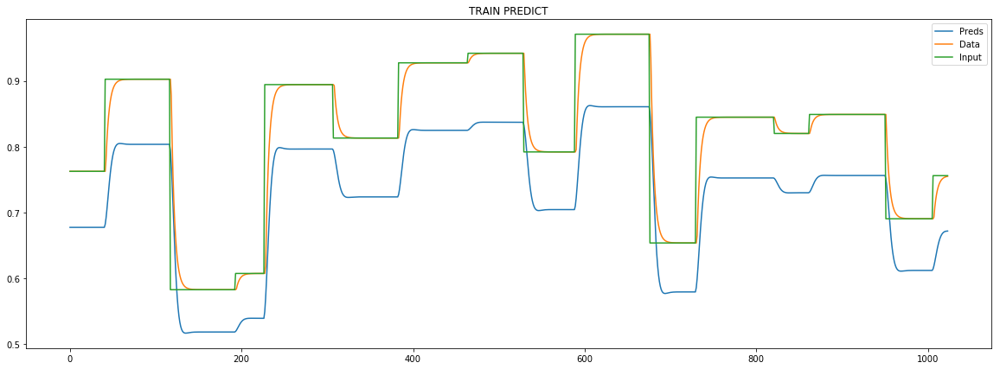

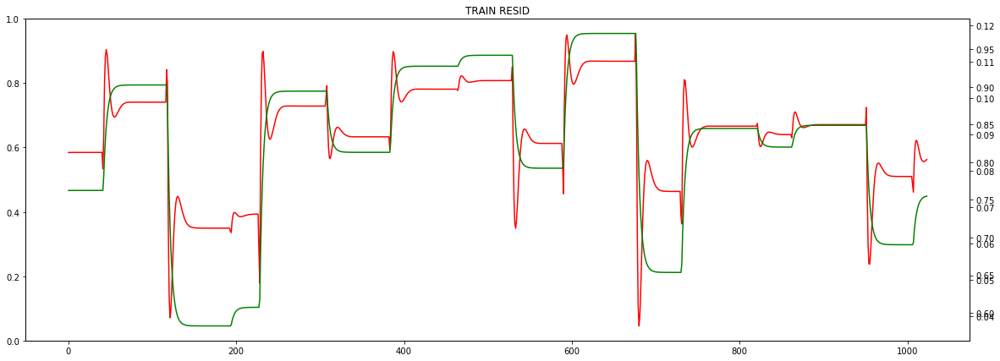

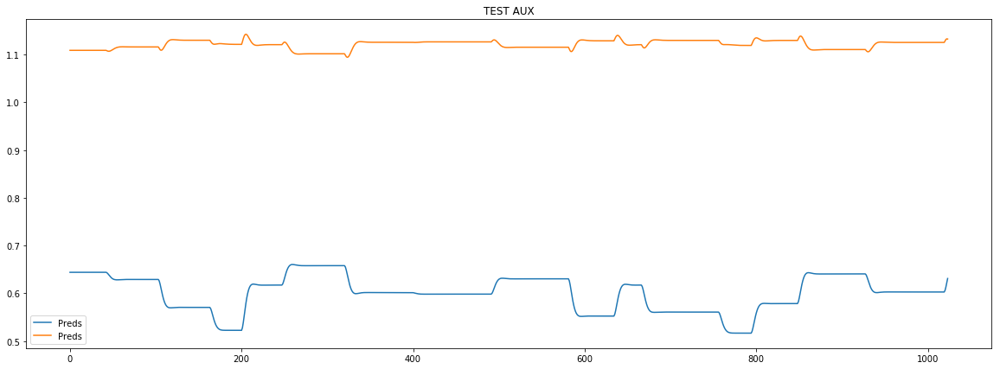

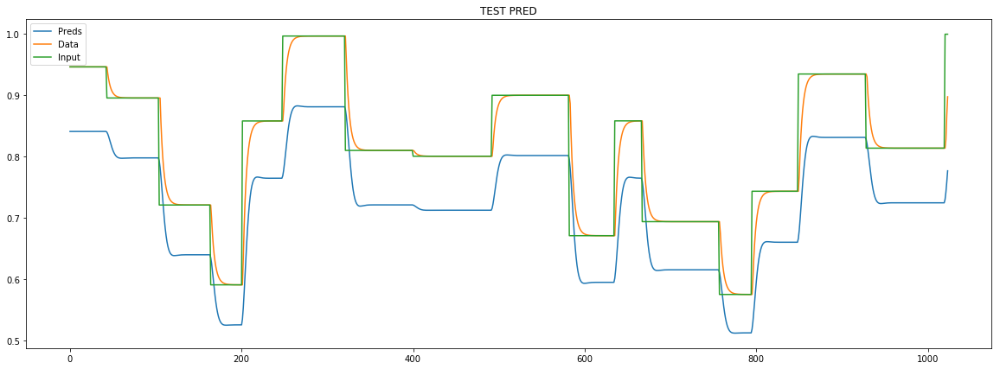

loss rate [0.004750355096234671]
Epoch [46] 
     train_loss[107.8997704008451] 
     eval_train[105.89449819120077] 
     eval_test[112.67690142718229]



aux preds: 0.6036926507949829 1.119497537612915
main loss 0.0
aux loss 105.66179480919472
const loss 1.905671706566444
combined loss 107.56746651576115 


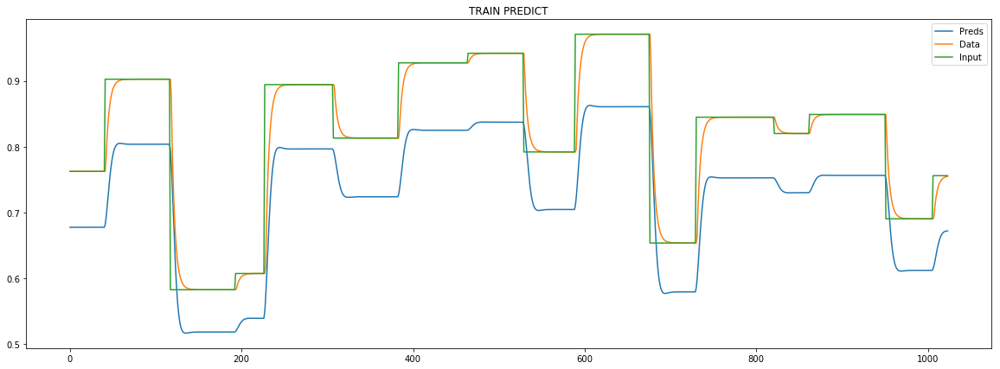

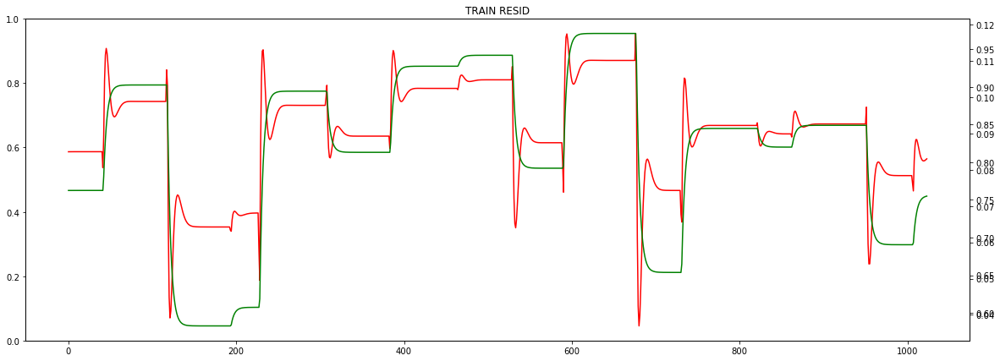

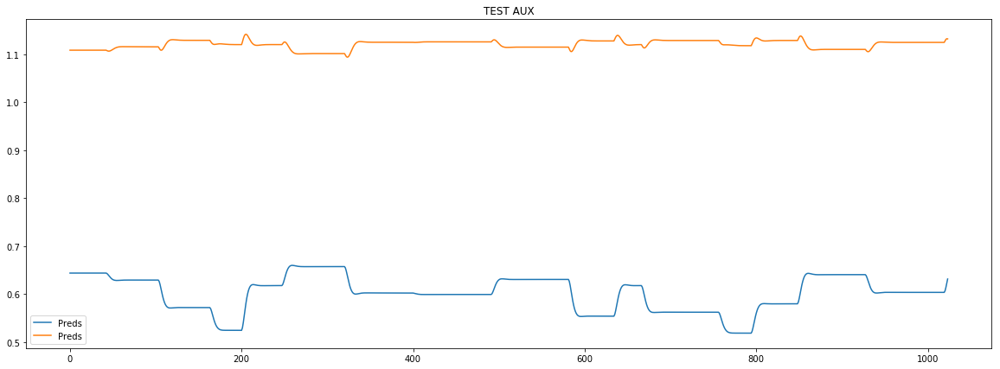

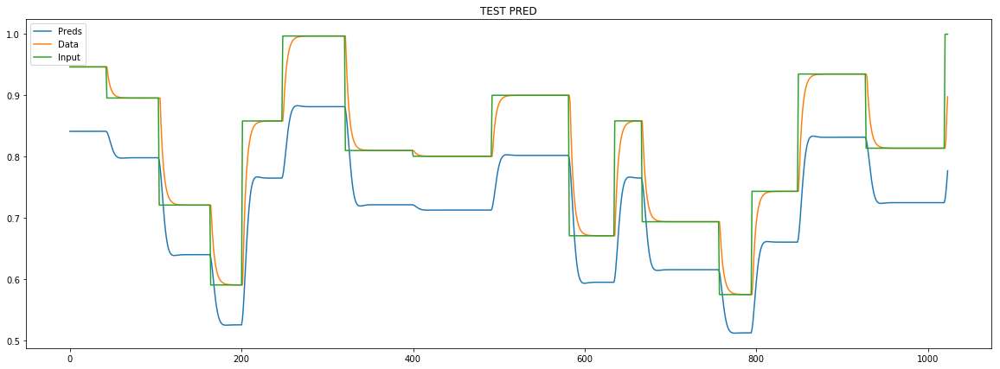

loss rate [0.006392249635203018]
Epoch [47] 
     train_loss[107.56746651576115] 
     eval_train[105.54057633647552] 
     eval_test[112.26129795204508]



aux preds: 0.6037971377372742 1.1195151805877686
main loss 0.0
aux loss 105.46854628049411
const loss 1.8321134184415524
combined loss 107.30065969893566 


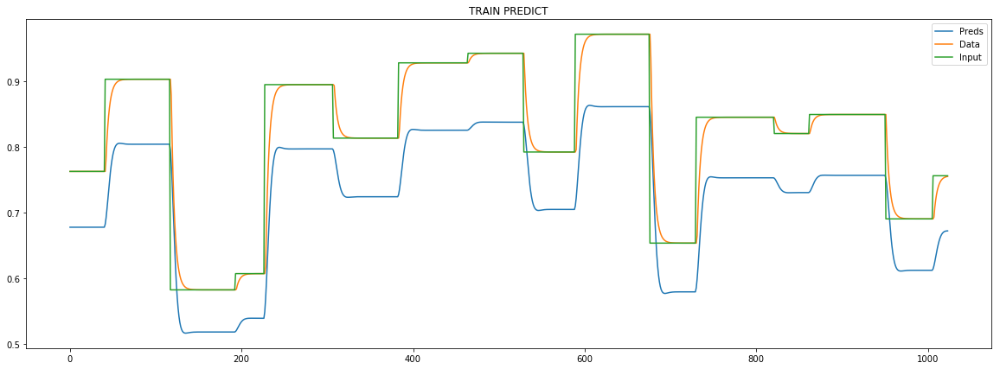

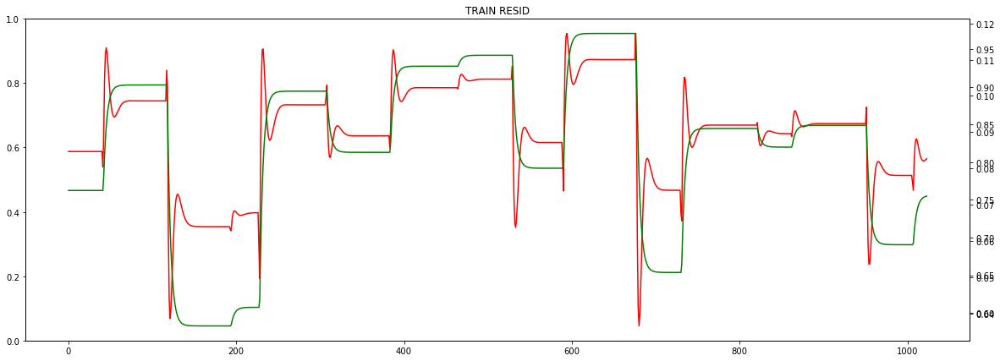

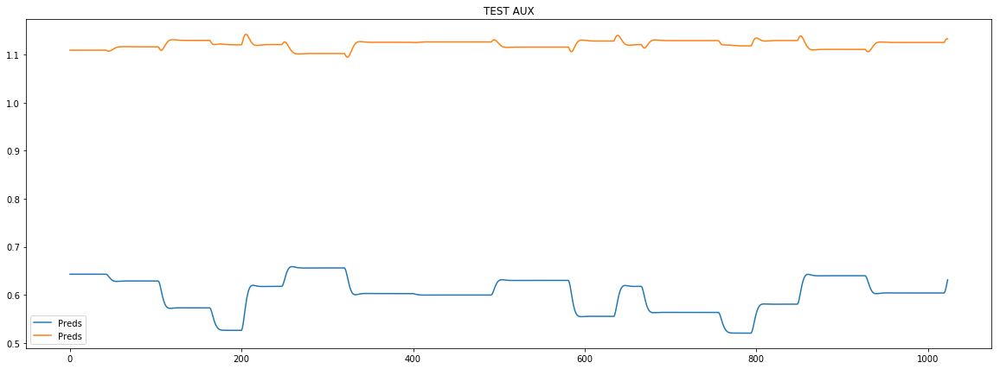

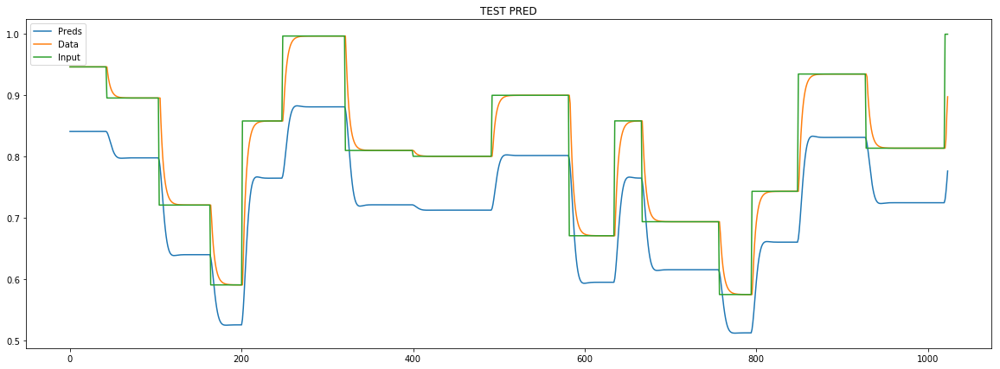

loss rate [0.005535887683168039]
Epoch [48] 
     train_loss[107.30065969893566] 
     eval_train[105.28135322722105] 
     eval_test[112.00707479498602]



aux preds: 0.6047484278678894 1.1194032430648804
main loss 0.0
aux loss 105.15294793935922
const loss 1.7636906527555907
combined loss 106.91663859211481 


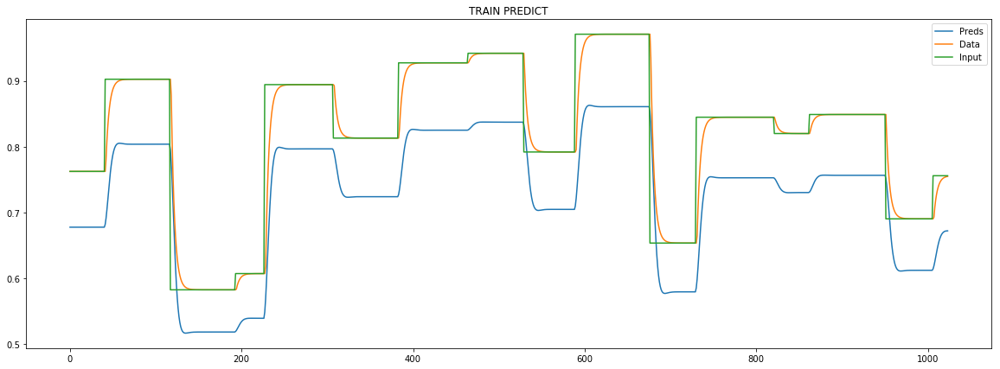

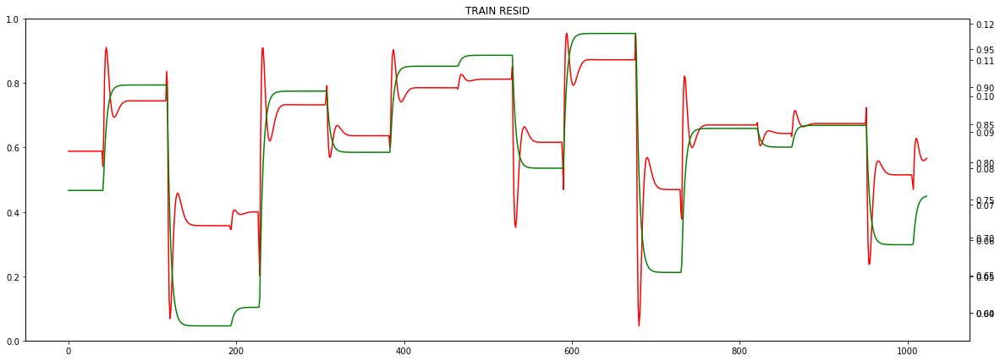

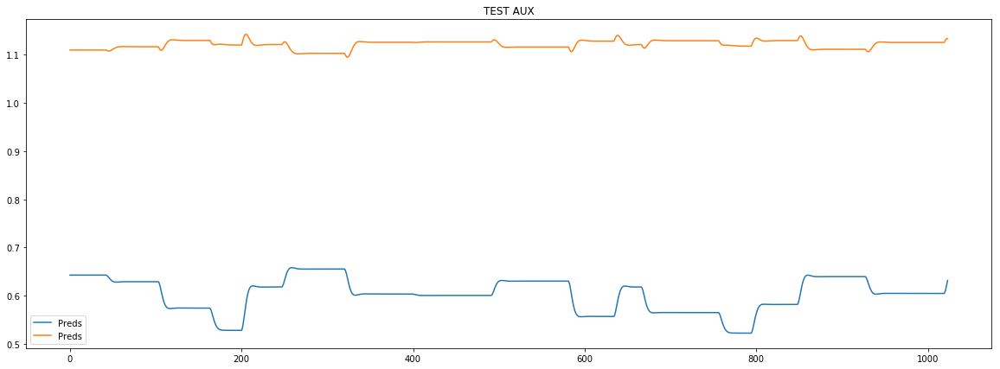

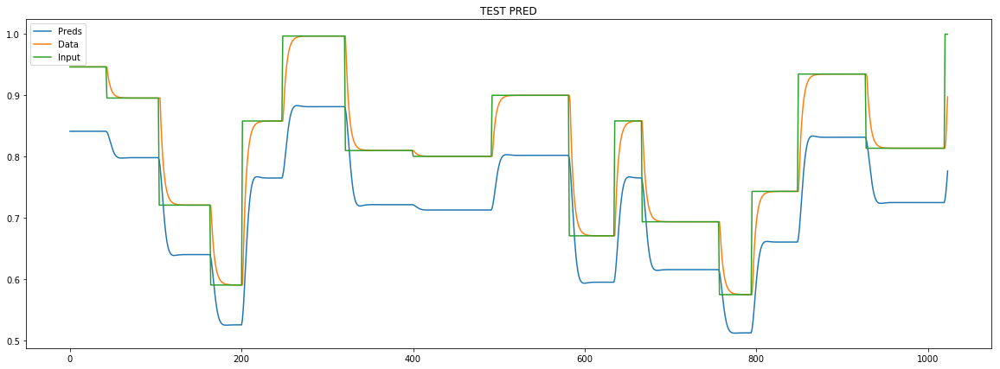

loss rate [0.006859036054660539]
Epoch [49] 
     train_loss[106.91663859211481] 
     eval_train[104.89347472099158] 
     eval_test[111.54471813006833]



aux preds: 0.6047666072845459 1.119280457496643
main loss 0.0
aux loss 104.96496992844801
const loss 1.6818944960832596
combined loss 106.64686442453127 


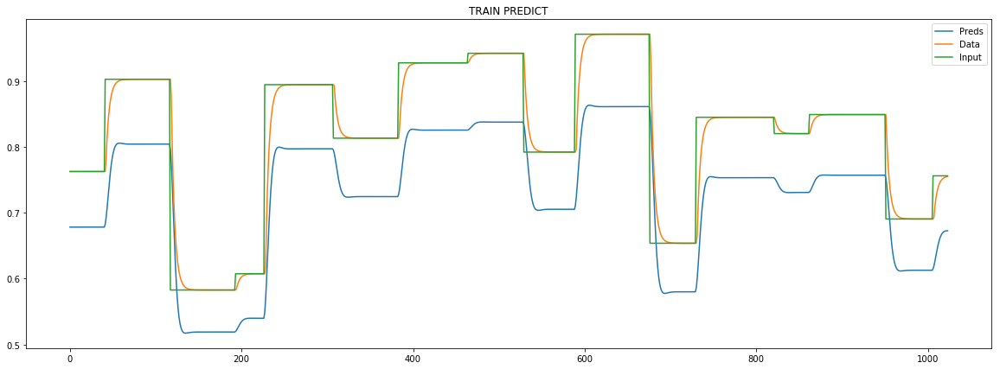

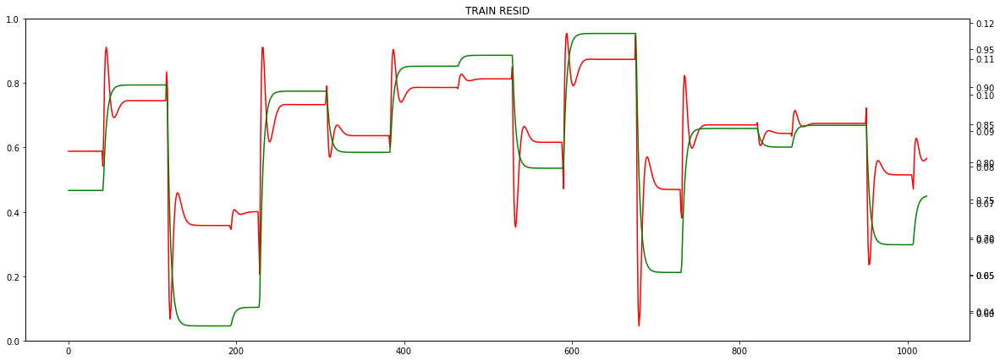

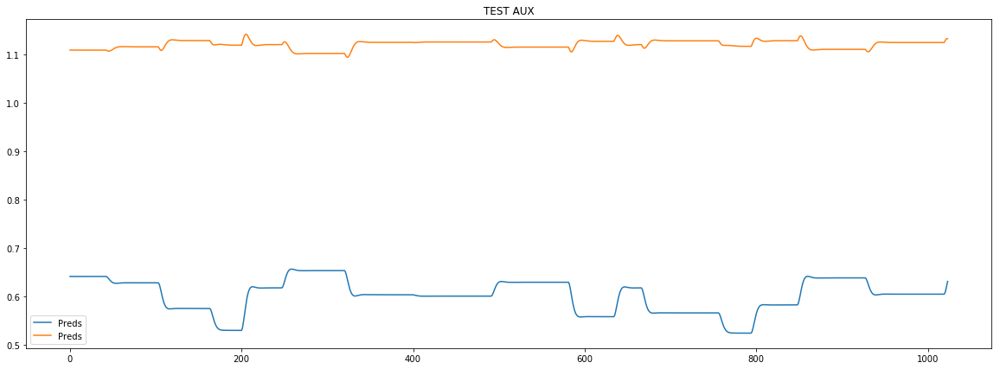

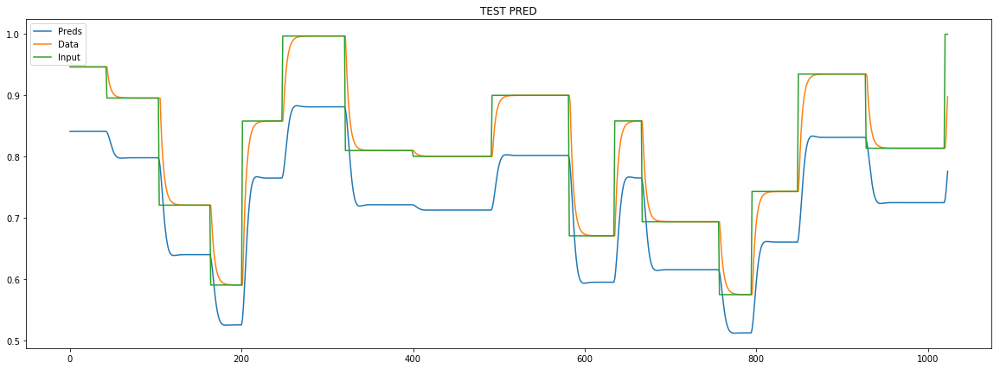

loss rate [0.0057932019344555385]
Epoch [50] 
     train_loss[106.64686442453127] 
     eval_train[104.62589125105967] 
     eval_test[111.28921927647157]



aux preds: 0.6057885885238647 1.1192717552185059
main loss 0.0
aux loss 104.62902589944693
const loss 1.6042928305956035
combined loss 106.23331873004253 


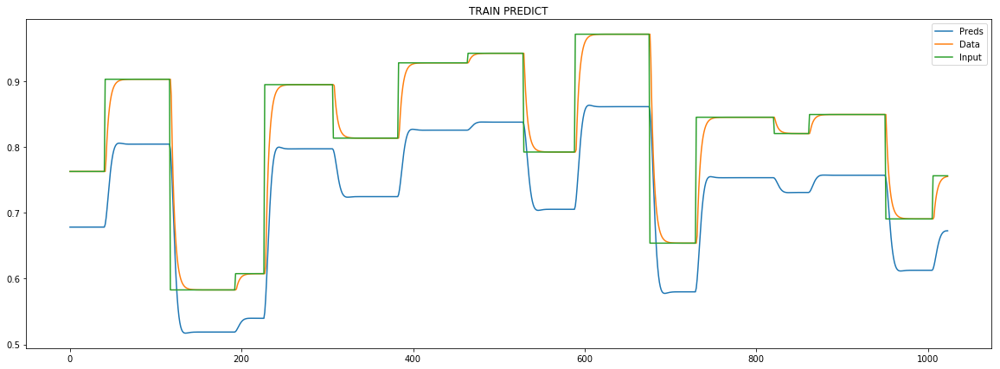

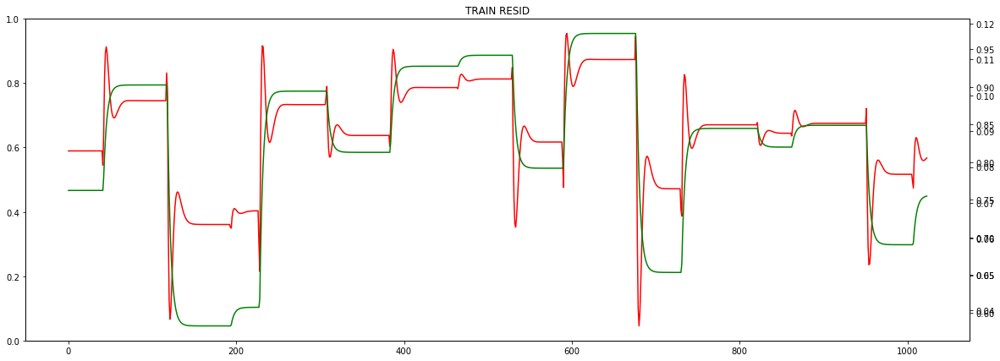

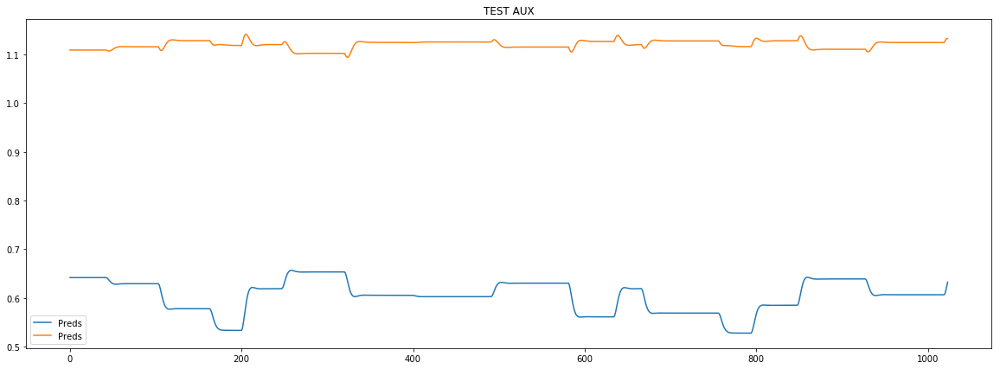

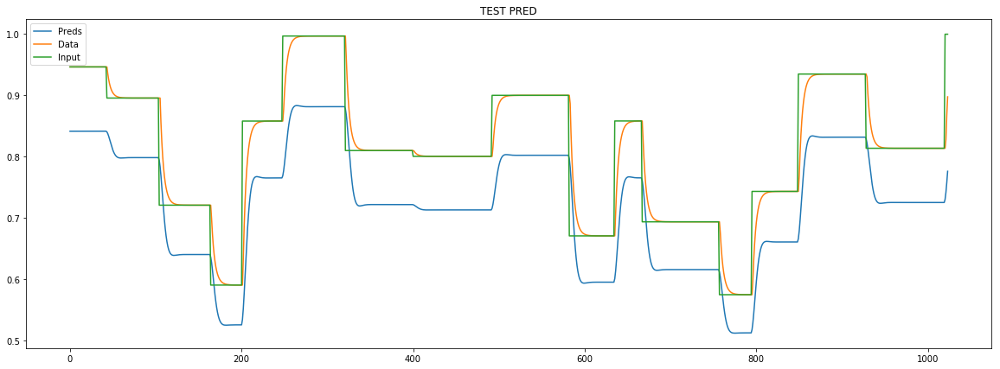

loss rate [0.00722631421472153]
Epoch [51] 
     train_loss[106.23331873004253] 
     eval_train[104.21863442086256] 
     eval_test[110.80711527846076]



aux preds: 0.6057915091514587 1.119229793548584
main loss 0.0
aux loss 104.43369263869066
const loss 1.5139339715242386
combined loss 105.9476266102149 


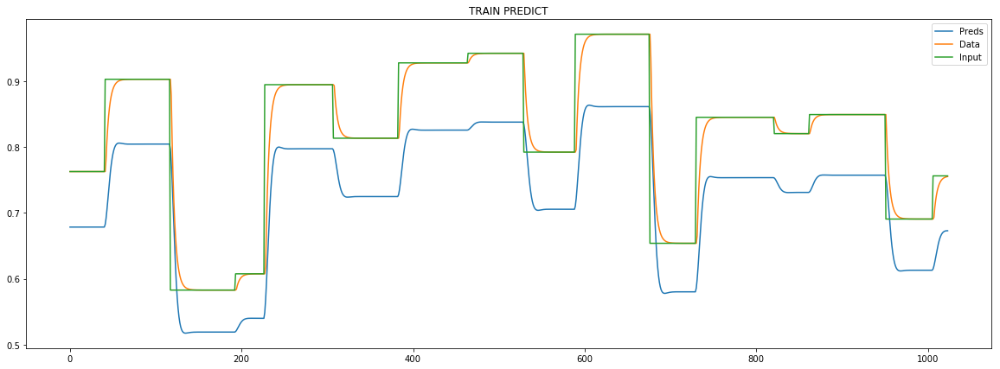

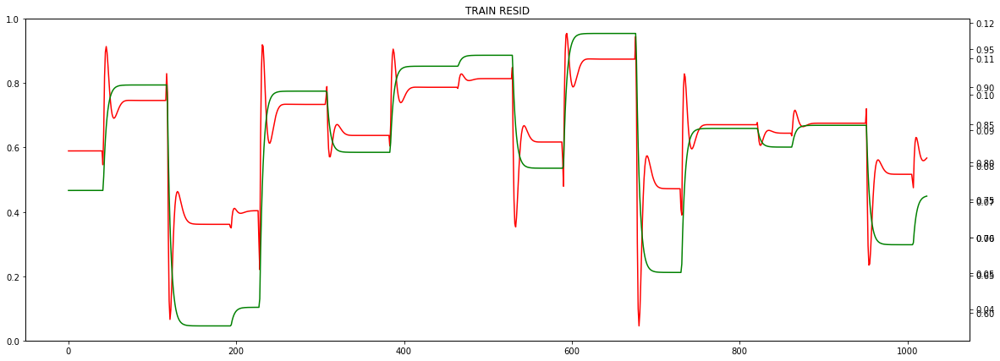

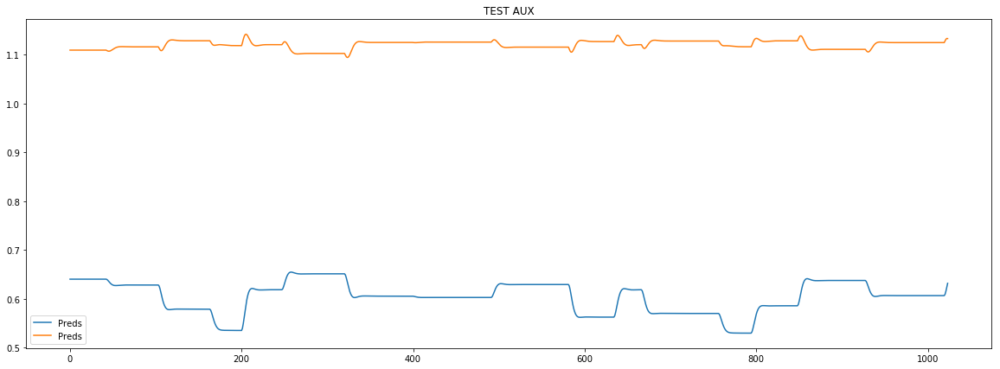

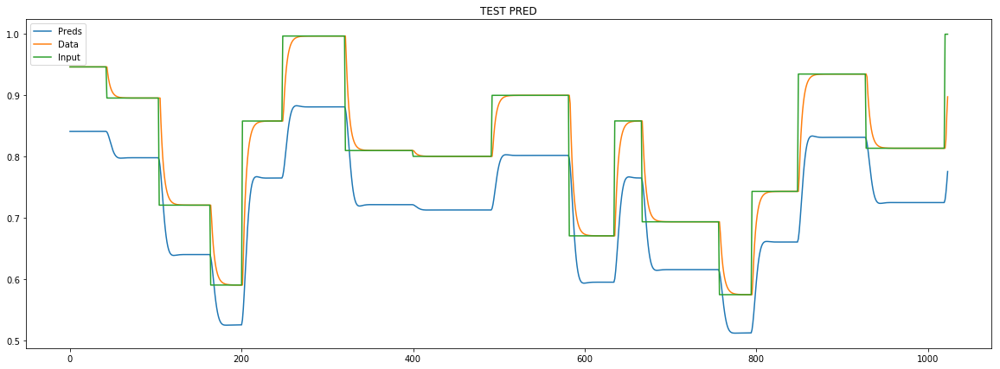

loss rate [0.006046328472232632]
Epoch [52] 
     train_loss[105.9476266102149] 
     eval_train[103.93735456925172] 
     eval_test[110.54124976288189]



aux preds: 0.606783926486969 1.119341492652893
main loss 0.0
aux loss 104.08734820439265
const loss 1.429217590735509
combined loss 105.51656579512816 


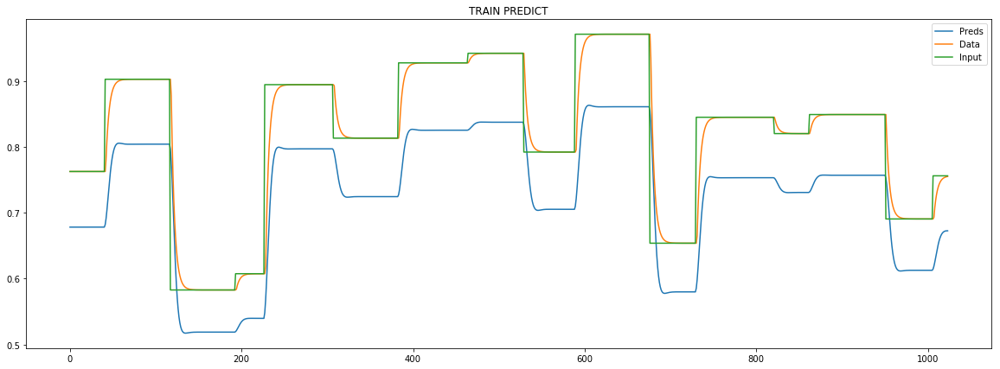

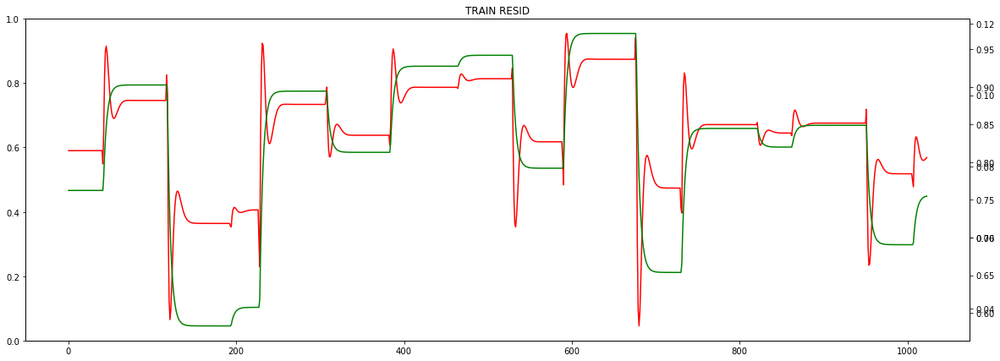

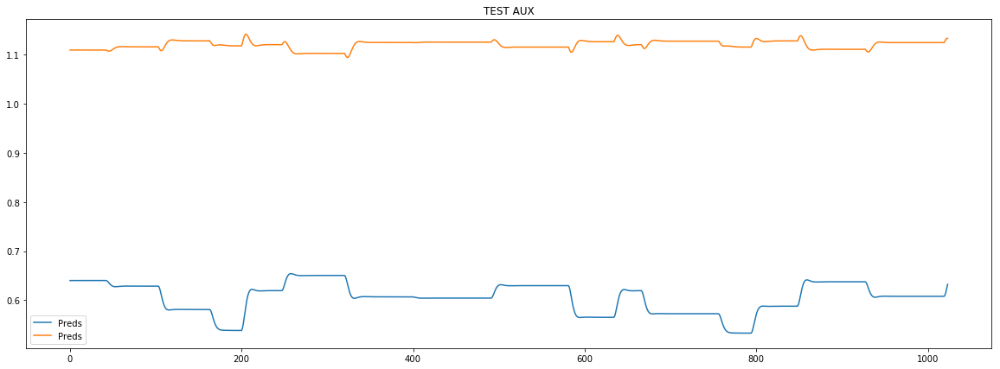

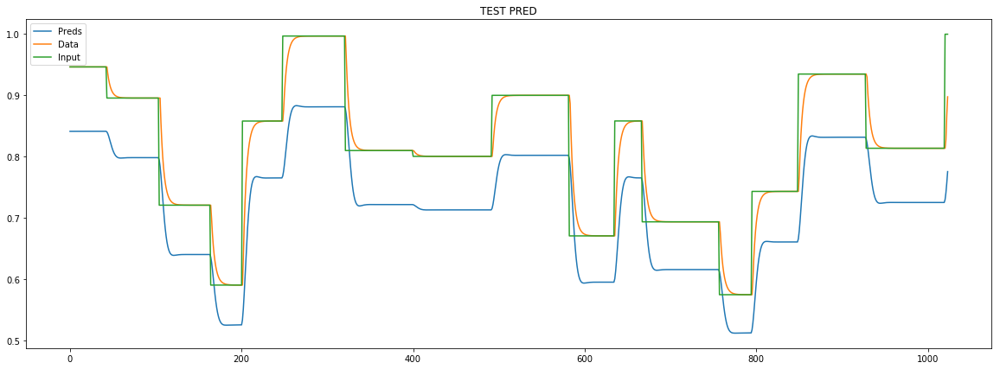

loss rate [0.007447593274289455]
Epoch [53] 
     train_loss[105.51656579512816] 
     eval_train[103.52021651543103] 
     eval_test[110.05341162735766]



aux preds: 0.606984555721283 1.1194032430648804
main loss 0.0
aux loss 103.84904656043419
const loss 1.3365403963969305
combined loss 105.18558695683112 


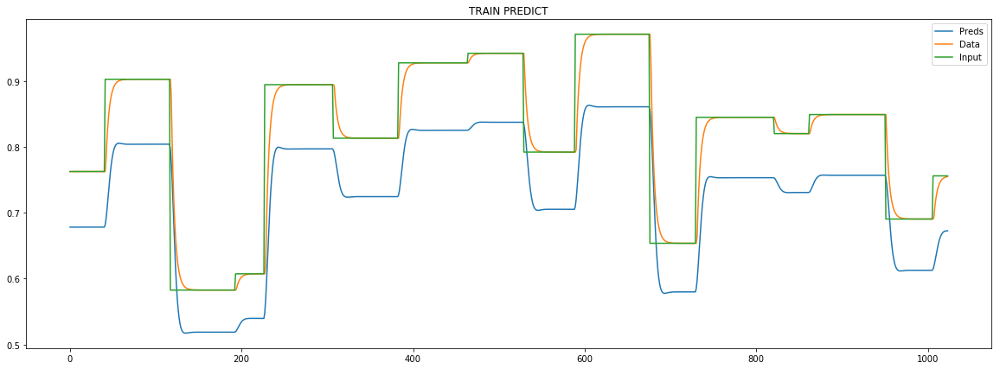

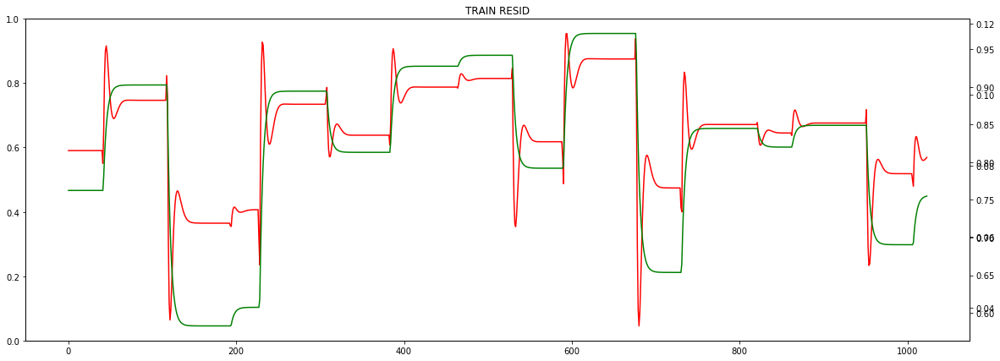

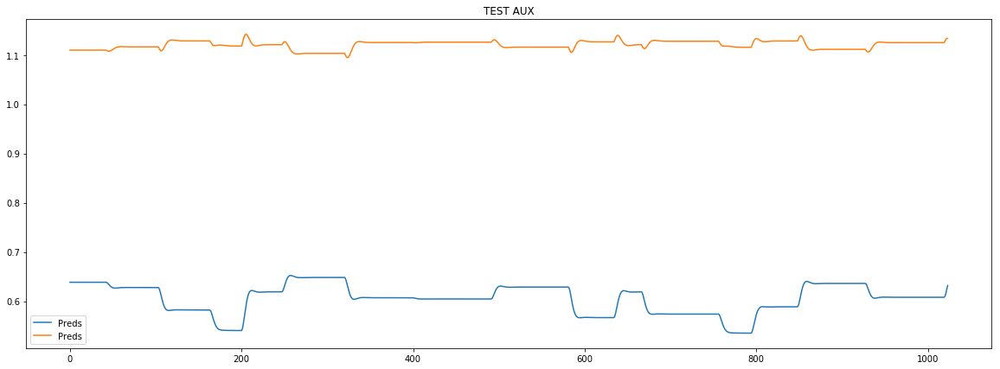

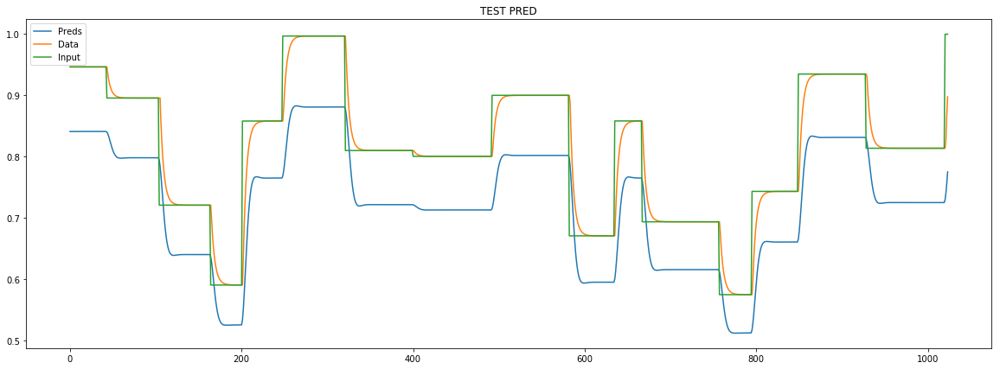

loss rate [0.006388824475598964]
Epoch [54] 
     train_loss[105.18558695683112] 
     eval_train[103.22024242236064] 
     eval_test[109.76150296222079]



aux preds: 0.6078025698661804 1.1195721626281738
main loss 0.0
aux loss 103.51458945641151
const loss 1.24633742754276
combined loss 104.76092688395427 


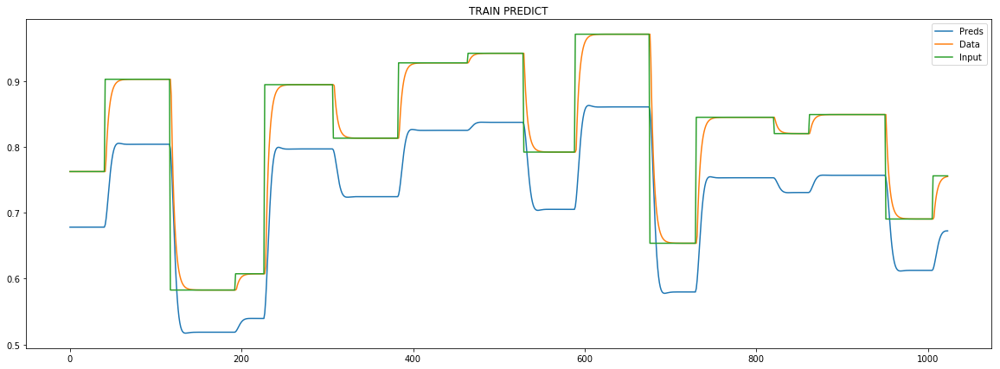

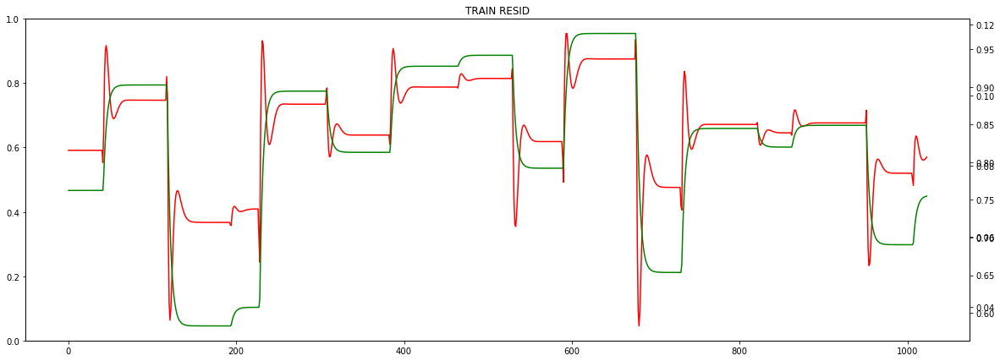

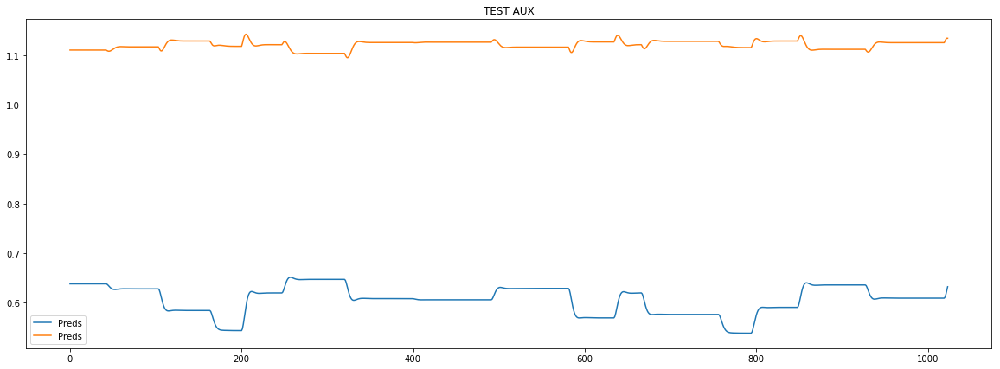

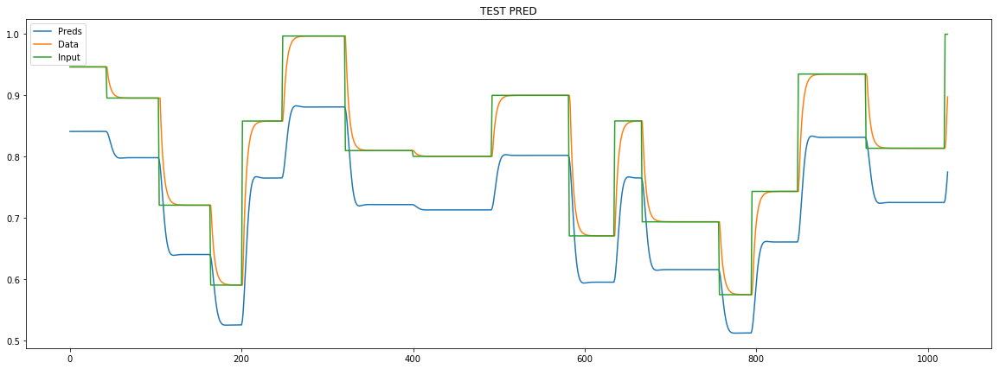

loss rate [0.007994156285009546]
Epoch [55] 
     train_loss[104.76092688395427] 
     eval_train[102.77133670105384] 
     eval_test[109.23841518163681]



aux preds: 0.6079439520835876 1.1196802854537964
main loss 0.0
aux loss 103.26197528839111
const loss 1.149580513055508
combined loss 104.41155580144662 


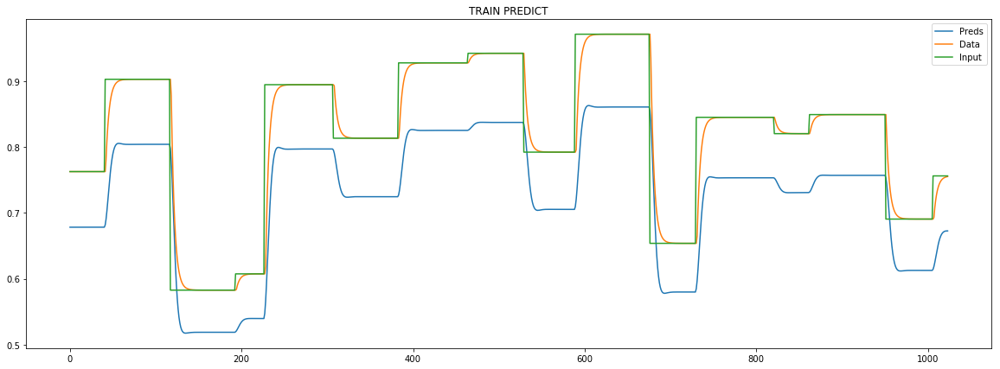

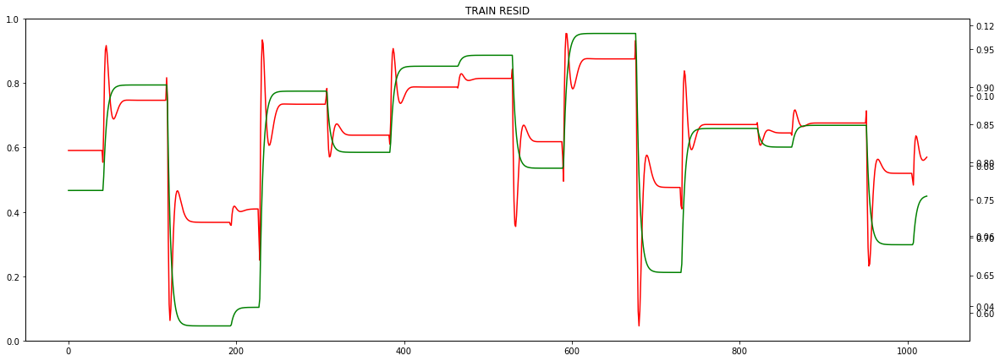

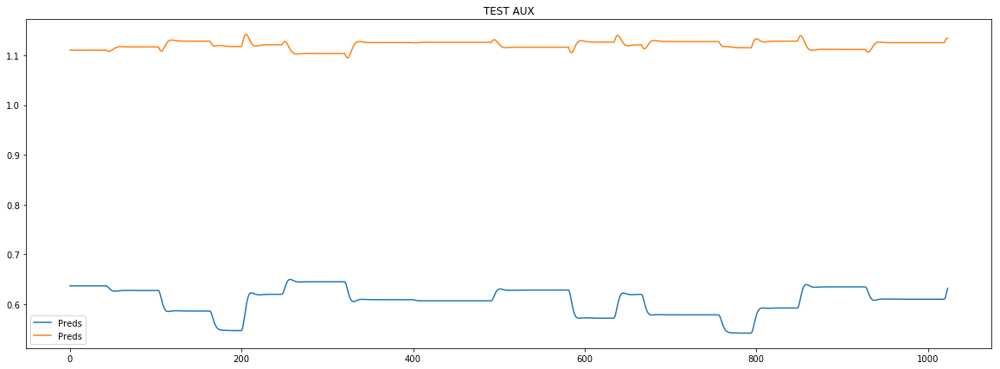

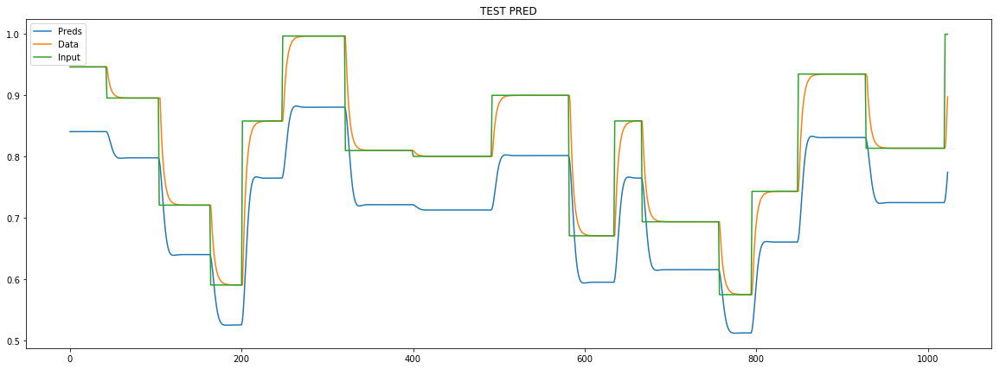

loss rate [0.006769175586405551]
Epoch [56] 
     train_loss[104.41155580144662] 
     eval_train[102.46316156020532] 
     eval_test[108.9419700015675]



aux preds: 0.6088187098503113 1.1199681758880615
main loss 0.0
aux loss 102.89169634305514
const loss 1.0567429936849153
combined loss 103.94843933674007 


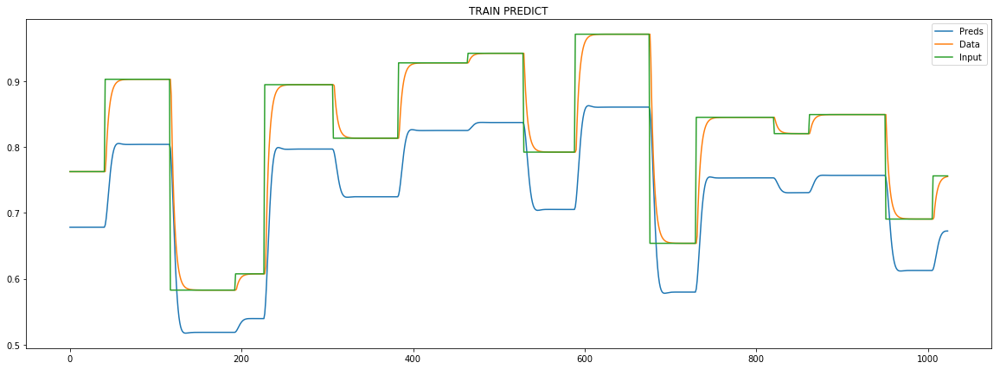

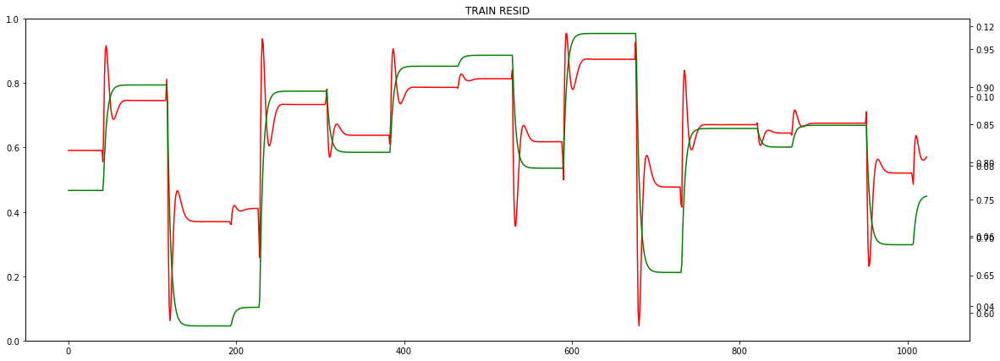

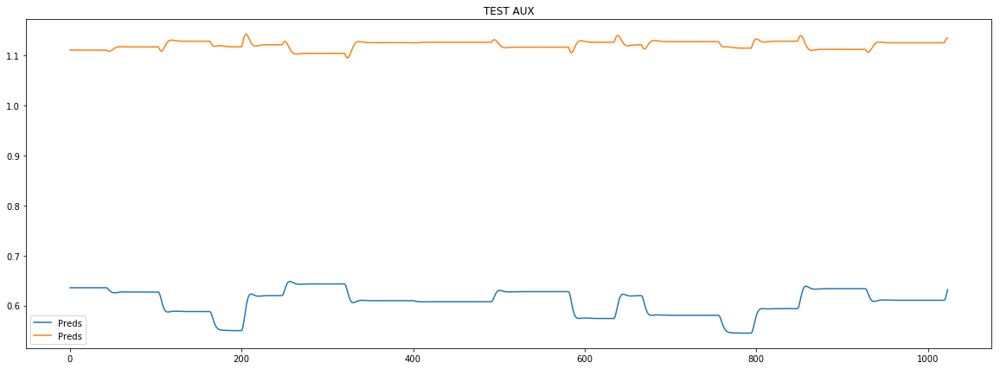

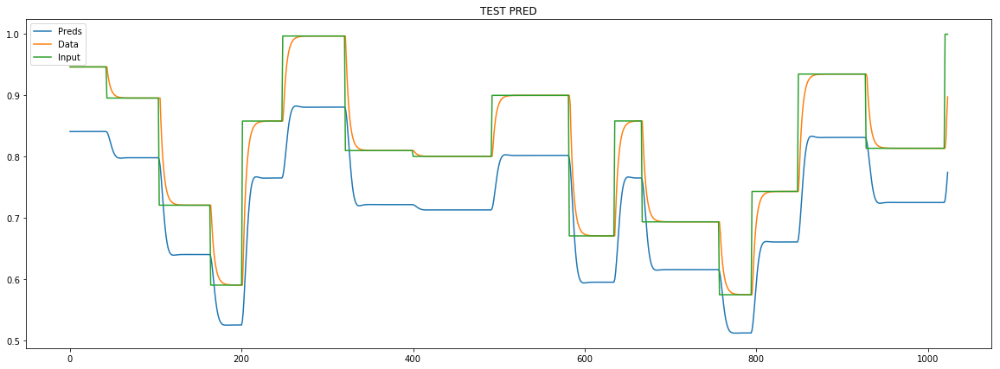

loss rate [0.00926955186126599]
Epoch [57] 
     train_loss[103.94843933674007] 
     eval_train[101.93187422362656] 
     eval_test[108.30067126859319]



aux preds: 0.6084466576576233 1.1201506853103638
main loss 0.0
aux loss 102.70281351529636
const loss 0.9528940400251975
combined loss 103.65570755532156 


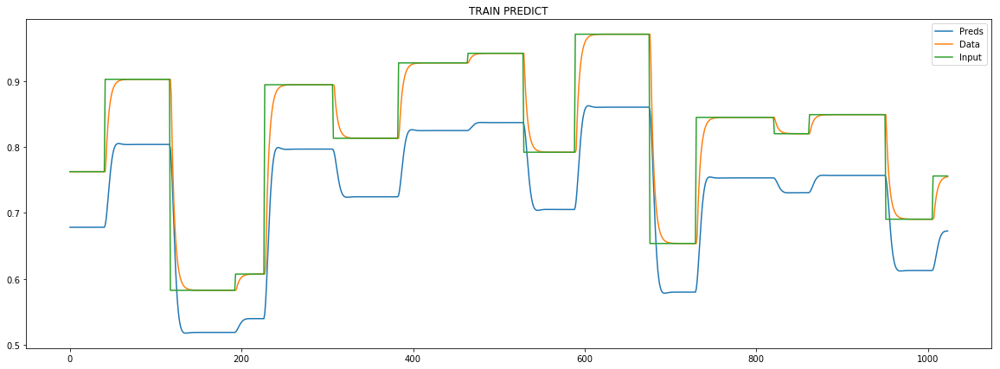

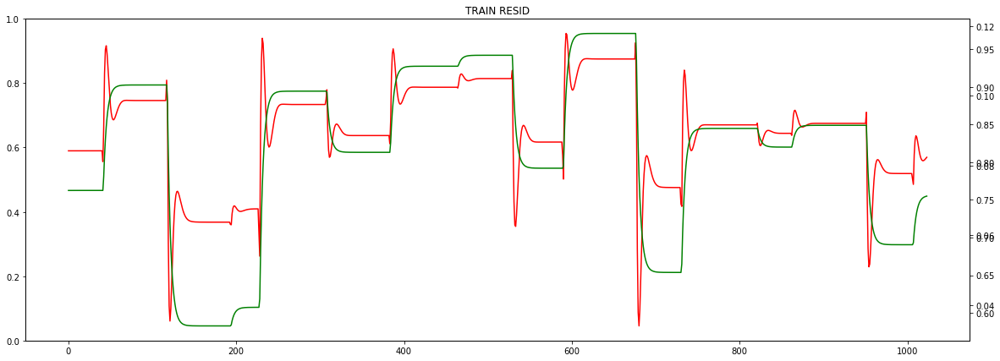

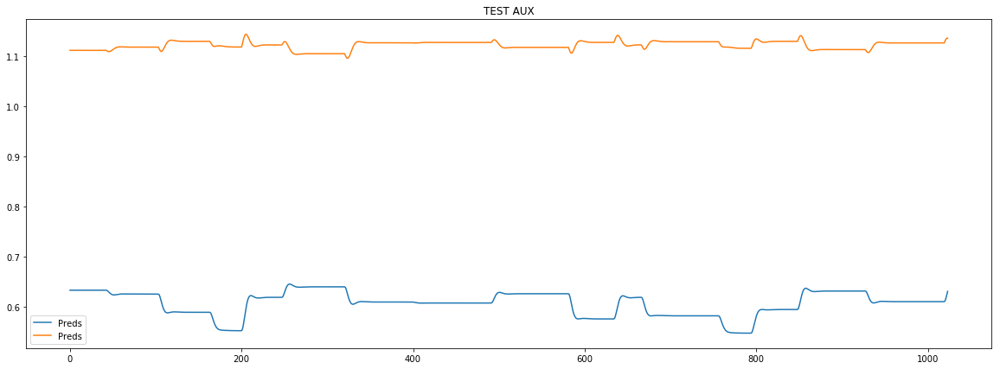

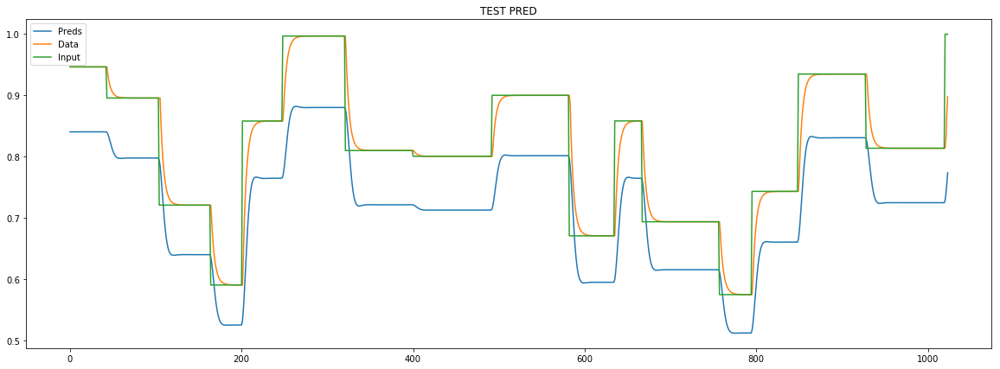

loss rate [0.007157981867841445]
Epoch [58] 
     train_loss[103.65570755532156] 
     eval_train[101.63563973857805] 
     eval_test[108.0480369898406]



aux preds: 0.6095690131187439 1.120578408241272
main loss 0.0
aux loss 102.26041419689471
const loss 0.8594408510969236
combined loss 103.11985504799163 


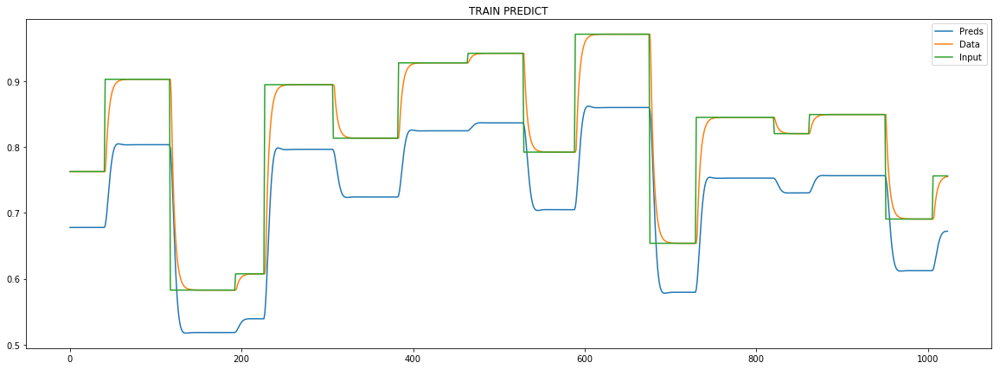

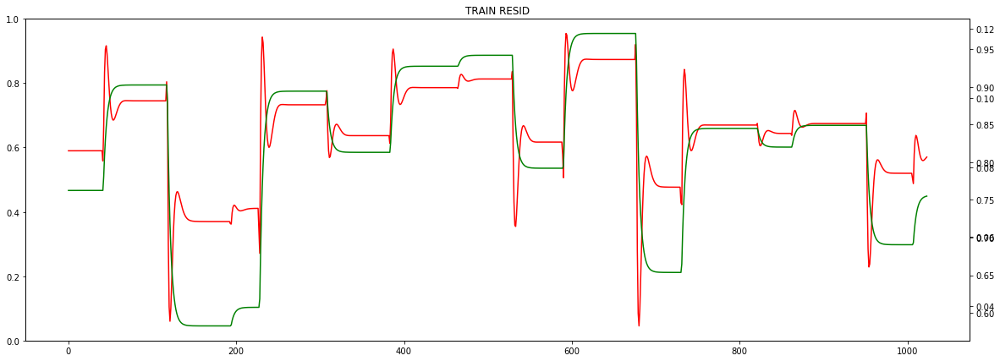

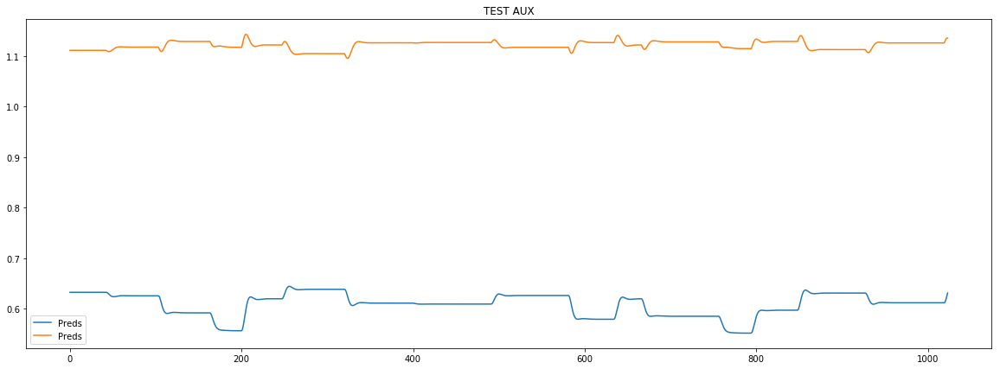

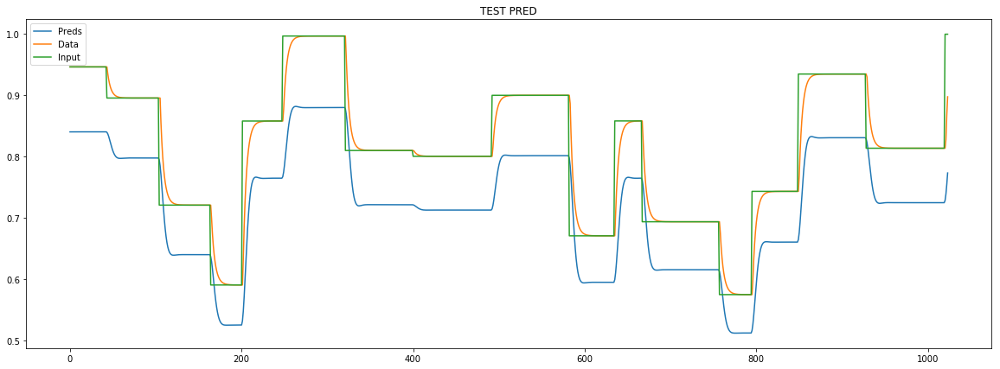

loss rate [0.008849957664884611]
Epoch [59] 
     train_loss[103.11985504799163] 
     eval_train[101.14244953829508] 
     eval_test[107.47062317620623]



aux preds: 0.6095938086509705 1.120854139328003
main loss 0.0
aux loss 101.99989560934213
const loss 0.7614146459561127
combined loss 102.76131025529824 


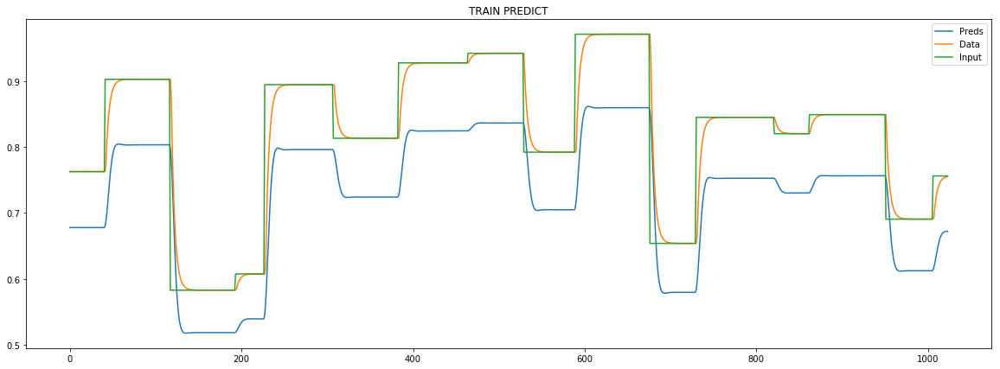

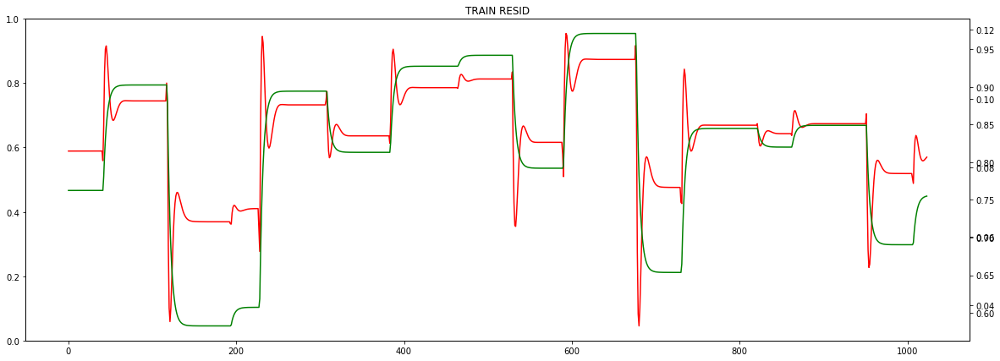

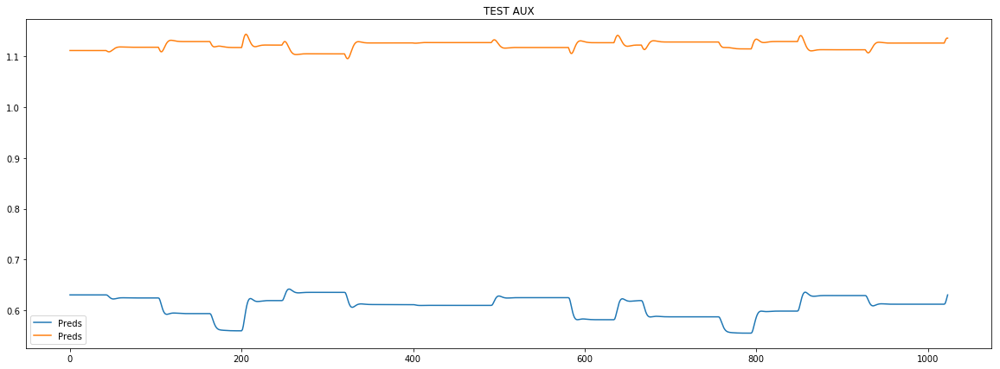

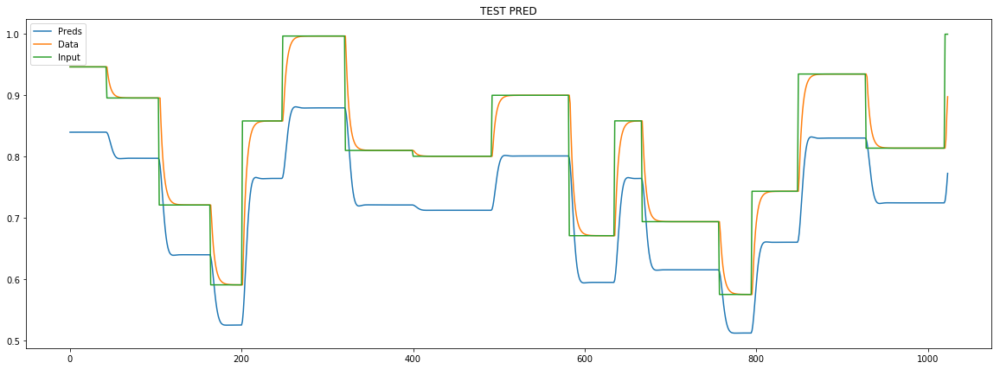

loss rate [0.0067440547425483555]
Epoch [60] 
     train_loss[102.76131025529824] 
     eval_train[100.84324881892938] 
     eval_test[107.21182537891647]



aux preds: 0.6108008623123169 1.1215070486068726
main loss 0.0
aux loss 101.4575270139254
const loss 0.6734556527091906
combined loss 102.1309826666346 


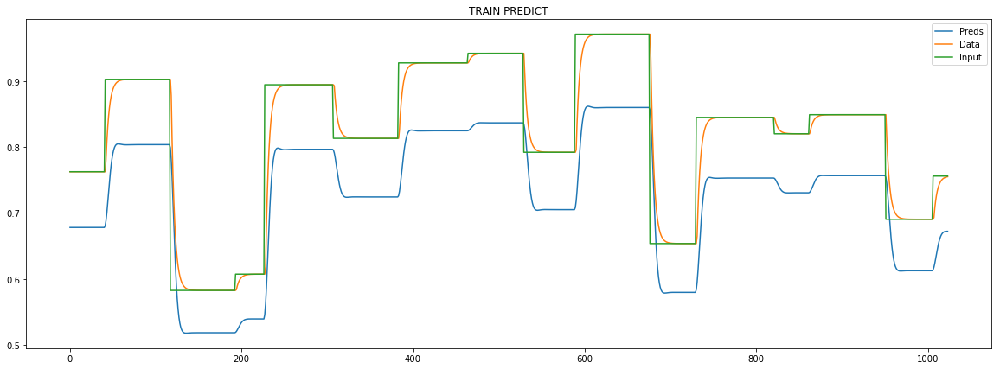

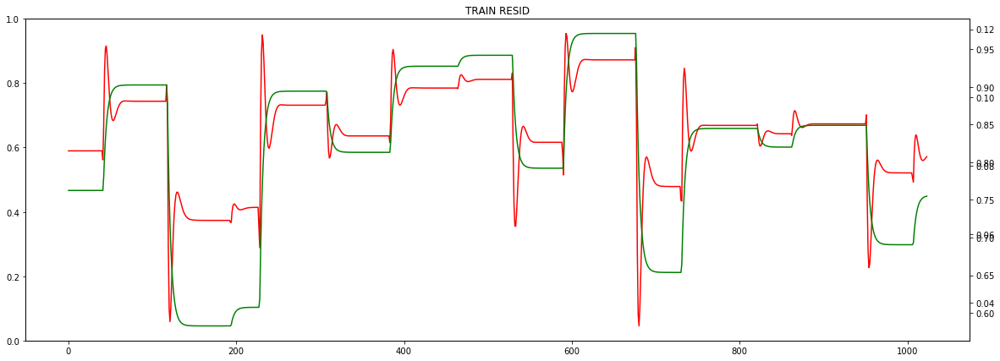

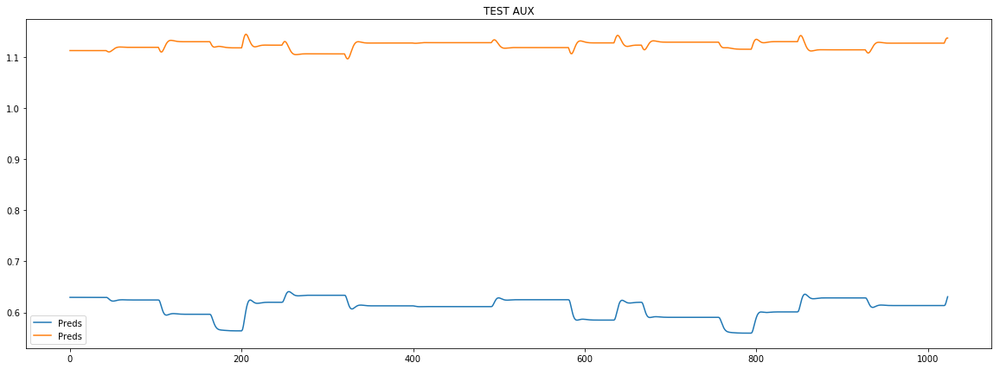

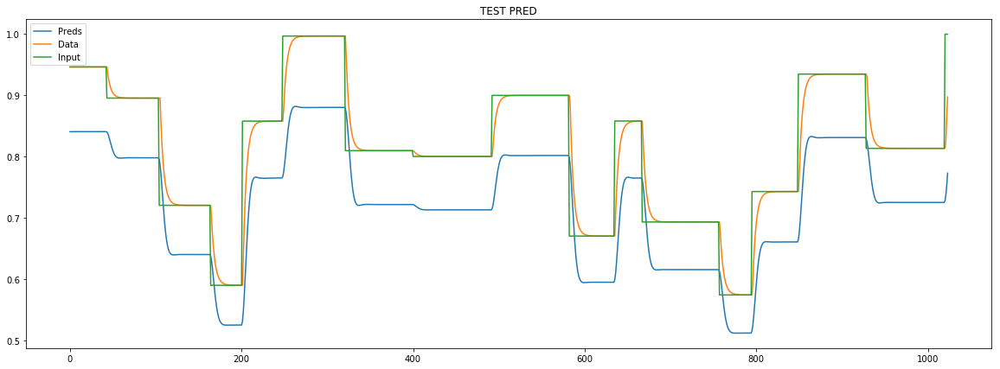

loss rate [0.013864064567866707]
Epoch [61] 
     train_loss[102.1309826666346] 
     eval_train[100.03486017710888] 
     eval_test[106.08537641844966]



aux preds: 0.6103614568710327 1.1222045421600342
main loss 0.0
aux loss 101.26142032329852
const loss 0.5773009987404714
combined loss 101.83872132203899 


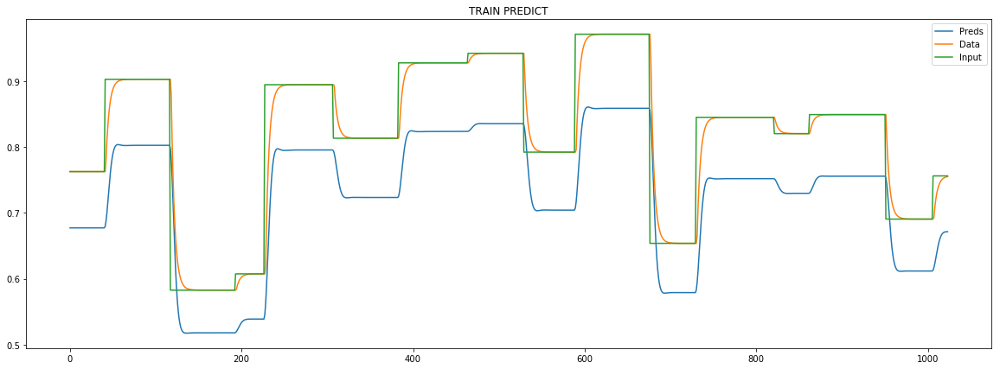

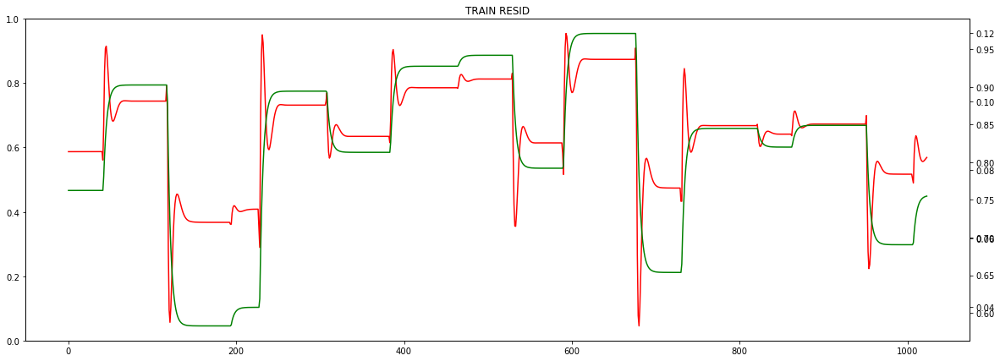

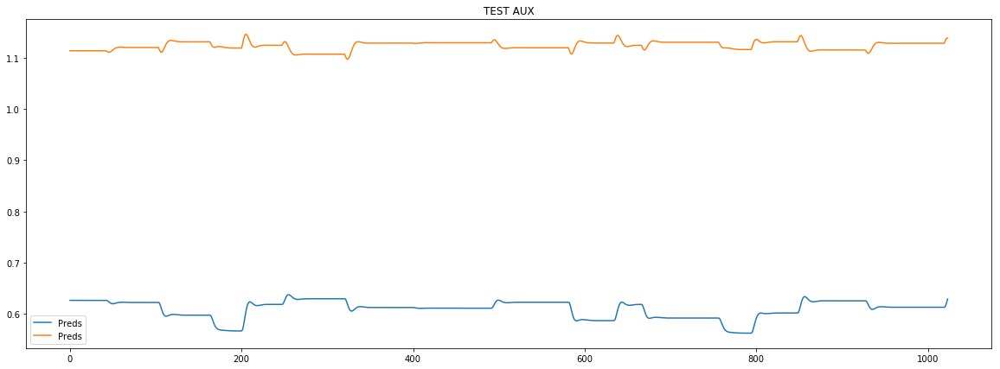

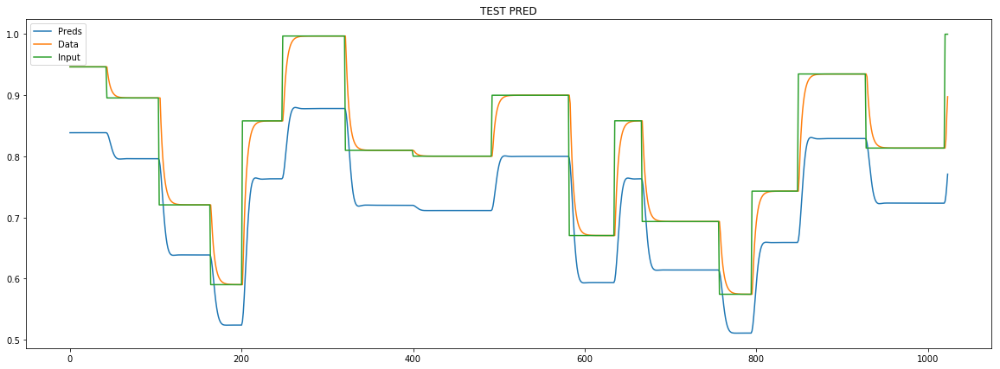

loss rate [0.006638810695086206]
Epoch [62] 
     train_loss[101.83872132203899] 
     eval_train[99.91738494084431] 
     eval_test[106.21276936883275]



aux preds: 0.611667811870575 1.1229066848754883
main loss 0.0
aux loss 100.77713342813345
const loss 0.5008847873944503
combined loss 101.27801821552791 


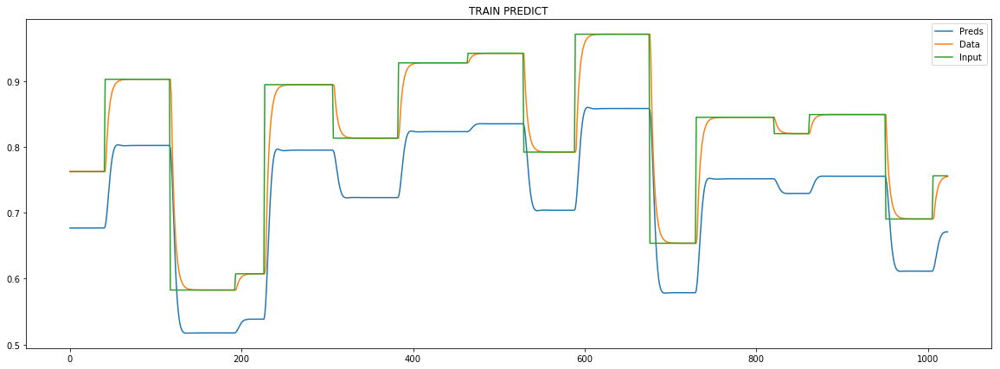

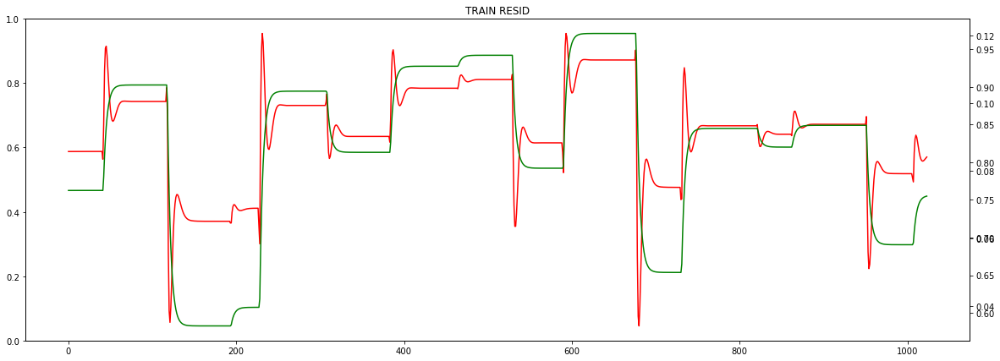

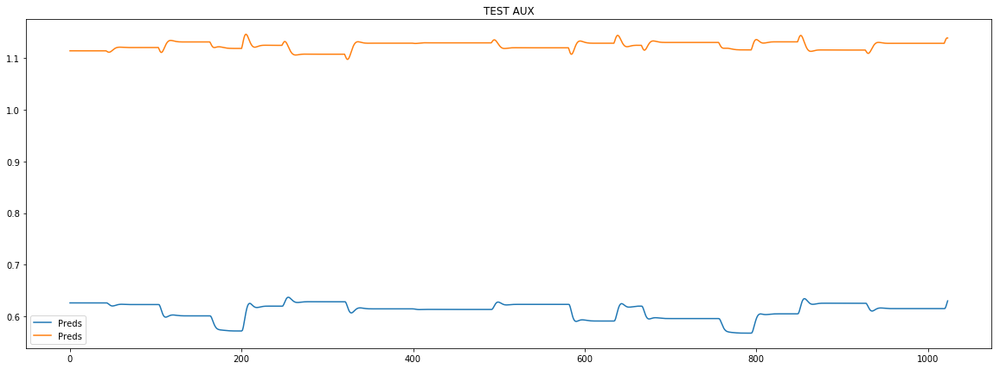

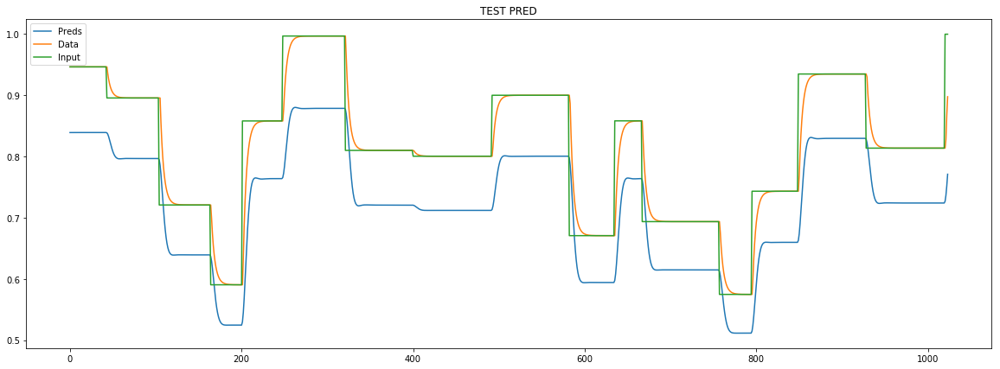

loss rate [0.010925169749406272]
Epoch [63] 
     train_loss[101.27801821552791] 
     eval_train[99.23394451978115] 
     eval_test[105.33975683152676]


In [ ]:
logging.info("Training process STARTED")

model.hidden = model.init_hidden()

lr_drop_rate = p_train['lr_drop_rate']
auto_loss = p_train['auto_loss']
steady_loss_criteria = p_train['steady_loss_criteria']
early_stopping_loss_order = p_train['early_stop_order']
loss_update_patiens = p_train['loss_update_patiens']
if auto_loss:
    decrease_lr_epochs = p_train['drop_lr_each']
    last_loss_update = 0

for t in range(num_epochs):

    if not auto_loss and t % decrease_lr_epochs == 0 and t != 0:
            lr /= lr_drop_rate
            print(f"LR UPDATED: {lr}")
            optimiser = torch.optim.Adam(model.parameters(), lr=lr)
    
    batch_local_hist = hist["train"]["batches"]
    long_term_hist = hist["train"]["epochs"]
    
    for i, data in enumerate(tqdm(train_dl)):
        y_pred = batch_iteration(
            iter_index=i,
            model=model,
            optimiser=optimiser,
            batch_data=data,
            backprop=True,
            hist_part=batch_local_hist
        )
        
    hist['mean_params_sample']['1'][t] = y_pred[:, 1].mean()
    hist['mean_params_sample']['2'][t] = y_pred[:, 2].mean()
    
    print(f"aux preds: {hist['mean_params_sample']['1'][t]} {hist['mean_params_sample']['2'][t]}")
    
    mean_losses = update_long_term_hist(batches_hist=batch_local_hist,
                                                            long_term_hist=long_term_hist)
    mean_main, mean_aux, mean_const = mean_losses
    # TODO add w8 decay
    print(f"main loss {mean_main}")
    print(f"aux loss {mean_aux}")
    print(f"const loss {mean_const}")
    print(f"combined loss {mean_main + mean_aux + mean_const} ")
    
    # VISUALISE TRAINING PROGRESS
    x_batch, y_batch, indexes = data
    plot_shared_scale([
        (y_pred[:, 0].detach().numpy(),"Preds" ),
         (y_batch[:, 0].detach().numpy(), "Data"),
         (x_batch[-1].detach().numpy(), "Input")
        ],
        title="TRAIN PREDICT")
          
    residuals = y_batch[:, 0] - y_pred[:, 0]
    plot_multiscale([
        (residuals.detach().numpy(), "Red"),
        (y_batch[:, 0].detach().numpy(), "Green")
    ],
        title="TRAIN RESID"
    ) 
    # /VISUALISE TRAINING PROGRESS

    # EVAL
    with torch.no_grad():
          
          model = model.eval()
          
          for i, data in enumerate(tqdm(train_dl)):
              batch_local_hist = hist['eval_train']['batches']
              long_term_hist=hist["eval_train"]["epochs"]
              y_pred = batch_iteration(
                iter_index=i,
                model=model,
                optimiser=optimiser,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          
          for i, data in enumerate(tqdm(test_dl)):
              batch_local_hist = hist['eval_test']['batches']
              long_term_hist=hist["eval_test"]["epochs"]
          
              y_pred_test = batch_iteration(
                iter_index=i,
                model=model,
                optimiser=optimiser,
                batch_data=data,
                backprop=False,
                hist_part=batch_local_hist
              )
          
          update_long_term_hist(batches_hist=batch_local_hist,
                                long_term_hist=long_term_hist)
          
          model = model.train()
    # /EVAL
          
    # VISUALISE ITERATION PRED
    x_batch_test, y_batch_test, indexes = data
    plot_shared_scale([
            (y_pred_test[:, 1].detach().numpy(),"Preds" ),
            (y_pred_test[:, 2].detach().numpy(),"Preds" ),
    ],
        title = 'TEST AUX'
    )
          
    plot_shared_scale([
            (y_pred_test[:, 0].detach().numpy(),"Preds" ),
             (y_batch_test[:, 0].detach().numpy(), "Data"),
             (x_batch_test[-1].detach().numpy(), "Input")
    ],
        title = 'TEST PRED'
    )
    # /VISUALISE ITERATION PRED
    
    visualise_resid = False
    if visualise_resid:
        residuals = y_batch_test[:, 0] - y_pred_test[:, 0]
        plot_multiscale(
                [
                 (residuals.detach().numpy(), "Red"), 
                 (y_batch_test[:, 0].detach().numpy(),"Green")
                ],
            title = 'TEST RESID'
        )
    
    
    # UPDATE LR
    hist['weights_sum'][t] = torch.as_tensor([p.sum() for p in model.parameters(recurse=True)]).sum().item()
    hist['weights_sum'][t] = torch.as_tensor([p.sum() for p in model.parameters(recurse=True)]).sum().item()
    
    hist['lr'][t] = lr
          
    if t > 3 and auto_loss:
          h = hist["eval_test"]["epochs"]
          loss_rate = 1 - slice_loss_sum(h, t) / np.mean([slice_loss_sum(h, k) for k in range(t-3,t)])
          
          hist['lr'][t] = lr
          hist['loss_rate'][t] = loss_rate
          
          
          print(f"loss rate [{loss_rate}]")
          loss_stops = loss_rate < steady_loss_criteria
          if loss_stops and t - last_loss_update >= loss_update_patiens:
              last_loss_update = t
              print(f"loss stopped: loss drop= [{loss_rate}]")
              lr /= lr_drop_rate
              print()
              print(f"LR UPDATED: {lr}")
              print()
              if lr <= 10**early_stopping_loss_order:
                  print(f"learning rate critically low [{lr}] EARLY STOPPING")
                  break
          optimiser = torch.optim.Adam(model.parameters(), lr=lr)
    # /UPDATE LR
                       
    # FINAL PROGRESS LOGGING
    msg = "Epoch [{t}] \n \
    train_loss[{train_loss}] \n \
    eval_train[{eval_train}] \n \
    eval_test[{eval_test}]".format(t=t,
                                train_loss=sum([val[t] for val in hist['train']['epochs'].values()]), 
                                eval_train=sum([val[t] for val in hist['eval_train']['epochs'].values()]),
                                eval_test=sum([val[t] for val in hist['eval_test']['epochs'].values()])
                               )
    print(msg)
    logging.info(msg)
                       
    # /FINAL PROGRESS LOGGING

In [ ]:
? model.parameters

In [ ]:
s, e = 0, t

In [ ]:
plot_multiscale([
    (hist['lr'][s:e],"Red" ),
    (hist['loss_rate'][s:e], "Green"),
    (hist['weights_sum'][s:e], "Blue")
])

In [ ]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [ ]:
plot_shared_scale([
    (hist['train']["epochs"]['main'][s:e],"Train" ),
    (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
    (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
#     (hist['train']["epochs"]['aux'][s:e], "aux_train"),
#     (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
#     (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [ ]:
plot_shared_scale([
#     (hist['train']["epochs"]['main'][s:e],"Train" ),
#     (hist['eval_train']["epochs"]['main'][s:e], "Eval_train"),
#     (hist['eval_test']["epochs"]['main'][s:e], "Eval_test"),
    (hist['train']["epochs"]['aux'][s:e], "aux_train"),
    (hist['eval_train']['epochs']['aux'][s:e], "aux_Eval_train"),
    (hist['eval_test']['epochs']['aux'][s:e], "aux_Eval_test")
])

In [ ]:
plot_shared_scale([
    (hist['train']["epochs"]['const'][s:e], "const_train"),
    (hist['eval_train']['epochs']['const'][s:e], "const_Eval_train"),
    (hist['eval_test']['epochs']['const'][s:e], "const_Eval_test")
])

In [ ]:
plot_shared_scale([
                  (hist['mean_params_sample']['1'][s:e], "p1"),
                  ((hist['mean_params_sample']['2']*0 + 1)[s:e], "p2"),
                  (hist['mean_params_sample']['2'][s:e], "p2"),
                  ((hist['mean_params_sample']['2']*0 + 0.5)[s:e], "p2"),
])

In [ ]:
model.buffers

In [ ]:
logging.info("Training process END")